<a href="https://colab.research.google.com/github/Shanteshmani/GAN-Fashion-Test/blob/master/Fashion_Gan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from __future__ import print_function, division

from keras.datasets import fashion_mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU

import matplotlib.pyplot as plt
import sys
import numpy as np
from __future__ import print_function, division

from keras.datasets import fashion_mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU

import matplotlib.pyplot as plt
import sys
import numpy as np

Using TensorFlow backend.


In [0]:
class GAN():
    def __init__(self):
        self.img_rows = 28
        self.img_cols = 28
        self.channels = 1
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = 100

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy',
            optimizer=optimizer,
            metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        # The generator takes noise as input and generates imgs
        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)

        # For the combined model we will only train the generator
        self.discriminator.trainable = False

        # The discriminator takes generated images as input and determines validity
        validity = self.discriminator(img)

        # The combined model  (stacked generator and discriminator)
        # Trains the generator to fool the discriminator
        self.combined = Model(z, validity)
        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer)


    def build_generator(self):

        model = Sequential()

        model.add(Dense(256, input_dim=self.latent_dim))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(1024))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        #model.add(Dense(2048))
        #model.add(LeakyReLU(alpha=0.2))
        #model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(np.prod(self.img_shape), activation='tanh'))
        model.add(Reshape(self.img_shape))

        model.summary()

        noise = Input(shape=(self.latent_dim,))
        img = model(noise)

        return Model(noise, img)

    def build_discriminator(self):

        model = Sequential()

        model.add(Flatten(input_shape=self.img_shape))
        #model.add(Dense(512))
        #model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(256))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(1, activation='sigmoid'))
        model.summary()

        img = Input(shape=self.img_shape)
        validity = model(img)

        return Model(img, validity)

    def train(self, epochs, batch_size=128, sample_interval=50):

        # Load the dataset
        (X_train, _), (_, _) = fashion_mnist.load_data()

        # Rescale -1 to 1
        X_train = X_train / 127.5 - 1.
        X_train = np.expand_dims(X_train, axis=3)

        # Adversarial ground truths
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        for epoch in range(epochs):

            # ---------------------
            #  Train Discriminator
            # ---------------------

            # Select a random batch of images
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            imgs = X_train[idx]

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))

            # Generate a batch of new images
            gen_imgs = self.generator.predict(noise)

            # Train the discriminator
            d_loss_real = self.discriminator.train_on_batch(imgs, valid)
            d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # ---------------------
            #  Train Generator
            # ---------------------

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))

            # Train the generator (to have the discriminator label samples as valid)
            g_loss = self.combined.train_on_batch(noise, valid)

            # Plot the progress
            print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))

            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.sample_images(epoch)

    def sample_images(self, epoch):
        r, c = 5, 5
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise)

        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray')
                axs[i,j].axis('off')
                cnt += 1
        #fig.savefig("images/%d.png" % epoch)
        plt.show()

        plt.close()

In [0]:
noise = np.random.normal(0, 1, (25, 100))

In [4]:
len(noise)

25

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_2 (Flatten)          (None, 784)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 512)               401920    
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
dense_9 (Dense)              (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
dense_10 (Dense)             (None, 1)                 257       
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
________________________________________________

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


0 [D loss: 0.695042, acc.: 57.81%] [G loss: 0.697970]


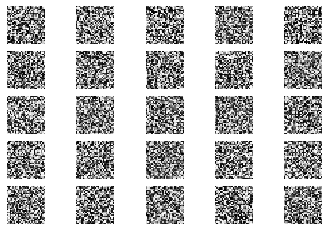

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


1 [D loss: 0.429511, acc.: 79.69%] [G loss: 0.711195]
2 [D loss: 0.376075, acc.: 81.25%] [G loss: 0.870337]
3 [D loss: 0.296788, acc.: 93.75%] [G loss: 1.031135]
4 [D loss: 0.239446, acc.: 95.31%] [G loss: 1.219218]
5 [D loss: 0.205744, acc.: 98.44%] [G loss: 1.308903]
6 [D loss: 0.191552, acc.: 100.00%] [G loss: 1.457940]
7 [D loss: 0.152456, acc.: 100.00%] [G loss: 1.559282]
8 [D loss: 0.169559, acc.: 100.00%] [G loss: 1.541026]
9 [D loss: 0.145821, acc.: 100.00%] [G loss: 1.780988]
10 [D loss: 0.133465, acc.: 100.00%] [G loss: 1.794595]
11 [D loss: 0.117570, acc.: 100.00%] [G loss: 1.921243]
12 [D loss: 0.106624, acc.: 100.00%] [G loss: 2.004936]
13 [D loss: 0.083103, acc.: 100.00%] [G loss: 2.144989]
14 [D loss: 0.079932, acc.: 100.00%] [G loss: 2.178112]
15 [D loss: 0.089120, acc.: 100.00%] [G loss: 2.134892]
16 [D loss: 0.082430, acc.: 100.00%] [G loss: 2.287544]
17 [D loss: 0.077655, acc.: 100.00%] [G loss: 2.305378]
18 [D loss: 0.090761, acc.: 98.44%] [G loss: 2.490003]
19 [D l

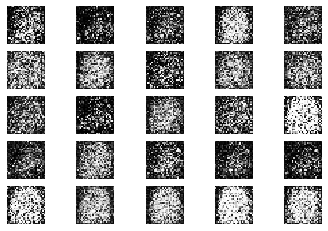

201 [D loss: 0.315393, acc.: 87.50%] [G loss: 2.396273]
202 [D loss: 0.399004, acc.: 79.69%] [G loss: 2.980407]
203 [D loss: 0.392655, acc.: 82.81%] [G loss: 3.738375]
204 [D loss: 0.488662, acc.: 81.25%] [G loss: 2.651794]
205 [D loss: 0.165219, acc.: 93.75%] [G loss: 2.724595]
206 [D loss: 0.311431, acc.: 84.38%] [G loss: 3.154362]
207 [D loss: 0.725307, acc.: 59.38%] [G loss: 2.783770]
208 [D loss: 0.240951, acc.: 92.19%] [G loss: 3.325884]
209 [D loss: 0.342319, acc.: 89.06%] [G loss: 2.643272]
210 [D loss: 0.314734, acc.: 84.38%] [G loss: 3.096096]
211 [D loss: 0.782327, acc.: 73.44%] [G loss: 2.968277]
212 [D loss: 0.571666, acc.: 70.31%] [G loss: 2.810099]
213 [D loss: 0.359992, acc.: 84.38%] [G loss: 2.909647]
214 [D loss: 0.404218, acc.: 82.81%] [G loss: 2.556384]
215 [D loss: 0.496449, acc.: 81.25%] [G loss: 2.235717]
216 [D loss: 0.205047, acc.: 93.75%] [G loss: 2.994200]
217 [D loss: 0.581808, acc.: 67.19%] [G loss: 2.723271]
218 [D loss: 0.492044, acc.: 75.00%] [G loss: 2.

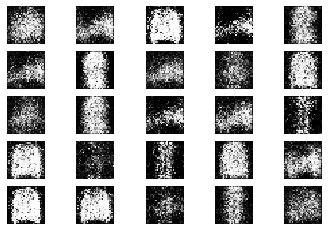

401 [D loss: 0.619025, acc.: 68.75%] [G loss: 0.849521]
402 [D loss: 0.621192, acc.: 67.19%] [G loss: 0.834281]
403 [D loss: 0.568710, acc.: 71.88%] [G loss: 0.887609]
404 [D loss: 0.568992, acc.: 81.25%] [G loss: 0.910227]
405 [D loss: 0.637472, acc.: 70.31%] [G loss: 0.904522]
406 [D loss: 0.557152, acc.: 71.88%] [G loss: 0.978520]
407 [D loss: 0.593344, acc.: 73.44%] [G loss: 1.026792]
408 [D loss: 0.634473, acc.: 65.62%] [G loss: 0.965282]
409 [D loss: 0.567314, acc.: 70.31%] [G loss: 0.964569]
410 [D loss: 0.556417, acc.: 71.88%] [G loss: 0.976849]
411 [D loss: 0.598473, acc.: 73.44%] [G loss: 1.042962]
412 [D loss: 0.555977, acc.: 76.56%] [G loss: 1.000589]
413 [D loss: 0.592534, acc.: 71.88%] [G loss: 1.007966]
414 [D loss: 0.645500, acc.: 54.69%] [G loss: 1.005669]
415 [D loss: 0.630835, acc.: 65.62%] [G loss: 0.968994]
416 [D loss: 0.621105, acc.: 67.19%] [G loss: 1.020176]
417 [D loss: 0.568990, acc.: 68.75%] [G loss: 1.047611]
418 [D loss: 0.585236, acc.: 76.56%] [G loss: 1.

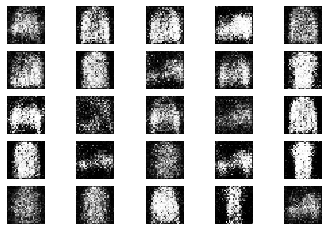

601 [D loss: 0.648732, acc.: 56.25%] [G loss: 0.823979]
602 [D loss: 0.604969, acc.: 65.62%] [G loss: 0.861797]
603 [D loss: 0.555560, acc.: 78.12%] [G loss: 0.902813]
604 [D loss: 0.568713, acc.: 75.00%] [G loss: 0.934540]
605 [D loss: 0.604064, acc.: 65.62%] [G loss: 0.993148]
606 [D loss: 0.685895, acc.: 48.44%] [G loss: 1.012387]
607 [D loss: 0.635679, acc.: 64.06%] [G loss: 0.897627]
608 [D loss: 0.636071, acc.: 68.75%] [G loss: 0.894211]
609 [D loss: 0.651342, acc.: 62.50%] [G loss: 0.969639]
610 [D loss: 0.551424, acc.: 71.88%] [G loss: 0.913126]
611 [D loss: 0.622344, acc.: 60.94%] [G loss: 0.946399]
612 [D loss: 0.701607, acc.: 51.56%] [G loss: 0.879555]
613 [D loss: 0.583798, acc.: 64.06%] [G loss: 0.850148]
614 [D loss: 0.647482, acc.: 57.81%] [G loss: 0.846831]
615 [D loss: 0.609600, acc.: 60.94%] [G loss: 0.928440]
616 [D loss: 0.639995, acc.: 67.19%] [G loss: 0.897855]
617 [D loss: 0.711260, acc.: 46.88%] [G loss: 0.819399]
618 [D loss: 0.575265, acc.: 68.75%] [G loss: 0.

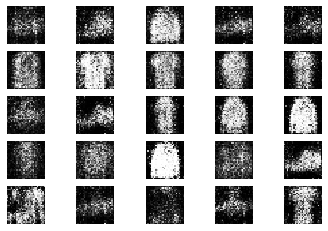

801 [D loss: 0.688473, acc.: 53.12%] [G loss: 0.847960]
802 [D loss: 0.675964, acc.: 59.38%] [G loss: 0.858191]
803 [D loss: 0.585437, acc.: 71.88%] [G loss: 0.894706]
804 [D loss: 0.607140, acc.: 70.31%] [G loss: 0.851229]
805 [D loss: 0.666832, acc.: 59.38%] [G loss: 0.849842]
806 [D loss: 0.708544, acc.: 56.25%] [G loss: 0.793184]
807 [D loss: 0.586824, acc.: 67.19%] [G loss: 0.831670]
808 [D loss: 0.598953, acc.: 67.19%] [G loss: 0.951401]
809 [D loss: 0.651276, acc.: 54.69%] [G loss: 0.905885]
810 [D loss: 0.621351, acc.: 60.94%] [G loss: 0.920511]
811 [D loss: 0.581960, acc.: 73.44%] [G loss: 0.916376]
812 [D loss: 0.628314, acc.: 57.81%] [G loss: 0.938533]
813 [D loss: 0.677003, acc.: 57.81%] [G loss: 0.944385]
814 [D loss: 0.640566, acc.: 64.06%] [G loss: 0.901146]
815 [D loss: 0.618943, acc.: 62.50%] [G loss: 0.813958]
816 [D loss: 0.632895, acc.: 60.94%] [G loss: 0.859757]
817 [D loss: 0.560415, acc.: 68.75%] [G loss: 0.870837]
818 [D loss: 0.613779, acc.: 59.38%] [G loss: 0.

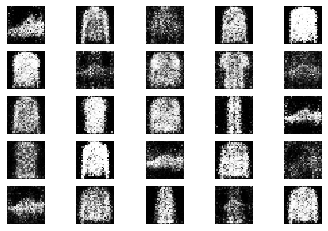

1001 [D loss: 0.606784, acc.: 68.75%] [G loss: 0.931514]
1002 [D loss: 0.651266, acc.: 57.81%] [G loss: 0.844827]
1003 [D loss: 0.628595, acc.: 68.75%] [G loss: 0.930597]
1004 [D loss: 0.670564, acc.: 57.81%] [G loss: 0.893235]
1005 [D loss: 0.616361, acc.: 70.31%] [G loss: 0.866279]
1006 [D loss: 0.615531, acc.: 67.19%] [G loss: 0.887373]
1007 [D loss: 0.633358, acc.: 67.19%] [G loss: 0.796676]
1008 [D loss: 0.675470, acc.: 57.81%] [G loss: 0.826585]
1009 [D loss: 0.582687, acc.: 62.50%] [G loss: 0.888603]
1010 [D loss: 0.608253, acc.: 67.19%] [G loss: 0.862640]
1011 [D loss: 0.667700, acc.: 59.38%] [G loss: 0.831340]
1012 [D loss: 0.673861, acc.: 54.69%] [G loss: 0.913806]
1013 [D loss: 0.598100, acc.: 71.88%] [G loss: 0.913823]
1014 [D loss: 0.620260, acc.: 68.75%] [G loss: 0.921899]
1015 [D loss: 0.615490, acc.: 68.75%] [G loss: 0.943403]
1016 [D loss: 0.679971, acc.: 51.56%] [G loss: 0.887794]
1017 [D loss: 0.692574, acc.: 54.69%] [G loss: 0.886778]
1018 [D loss: 0.588423, acc.: 7

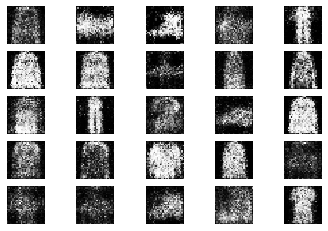

1201 [D loss: 0.621824, acc.: 71.88%] [G loss: 0.904995]
1202 [D loss: 0.642219, acc.: 60.94%] [G loss: 0.928649]
1203 [D loss: 0.601603, acc.: 68.75%] [G loss: 0.870101]
1204 [D loss: 0.633664, acc.: 65.62%] [G loss: 0.821061]
1205 [D loss: 0.624292, acc.: 60.94%] [G loss: 0.852899]
1206 [D loss: 0.652912, acc.: 60.94%] [G loss: 0.841896]
1207 [D loss: 0.559051, acc.: 76.56%] [G loss: 0.830856]
1208 [D loss: 0.634697, acc.: 68.75%] [G loss: 0.868870]
1209 [D loss: 0.642170, acc.: 57.81%] [G loss: 0.859334]
1210 [D loss: 0.543392, acc.: 71.88%] [G loss: 0.838561]
1211 [D loss: 0.579150, acc.: 71.88%] [G loss: 0.878156]
1212 [D loss: 0.584619, acc.: 62.50%] [G loss: 0.890471]
1213 [D loss: 0.720249, acc.: 48.44%] [G loss: 0.900925]
1214 [D loss: 0.616378, acc.: 70.31%] [G loss: 0.953745]
1215 [D loss: 0.651110, acc.: 62.50%] [G loss: 0.812158]
1216 [D loss: 0.608566, acc.: 71.88%] [G loss: 0.856801]
1217 [D loss: 0.679980, acc.: 62.50%] [G loss: 0.914479]
1218 [D loss: 0.662658, acc.: 5

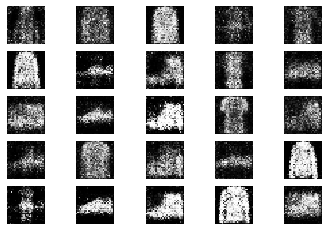

1401 [D loss: 0.659234, acc.: 56.25%] [G loss: 0.847363]
1402 [D loss: 0.564265, acc.: 84.38%] [G loss: 0.838058]
1403 [D loss: 0.627394, acc.: 70.31%] [G loss: 0.816315]
1404 [D loss: 0.632985, acc.: 57.81%] [G loss: 0.850323]
1405 [D loss: 0.647188, acc.: 53.12%] [G loss: 0.947561]
1406 [D loss: 0.667274, acc.: 59.38%] [G loss: 0.919388]
1407 [D loss: 0.605191, acc.: 76.56%] [G loss: 0.929601]
1408 [D loss: 0.597001, acc.: 62.50%] [G loss: 0.827107]
1409 [D loss: 0.638771, acc.: 50.00%] [G loss: 0.883537]
1410 [D loss: 0.633935, acc.: 60.94%] [G loss: 0.895386]
1411 [D loss: 0.592921, acc.: 70.31%] [G loss: 0.939912]
1412 [D loss: 0.646072, acc.: 65.62%] [G loss: 0.891688]
1413 [D loss: 0.620573, acc.: 60.94%] [G loss: 0.896997]
1414 [D loss: 0.644991, acc.: 64.06%] [G loss: 0.920071]
1415 [D loss: 0.605361, acc.: 71.88%] [G loss: 0.910400]
1416 [D loss: 0.533413, acc.: 75.00%] [G loss: 0.943143]
1417 [D loss: 0.582303, acc.: 79.69%] [G loss: 0.970280]
1418 [D loss: 0.621761, acc.: 6

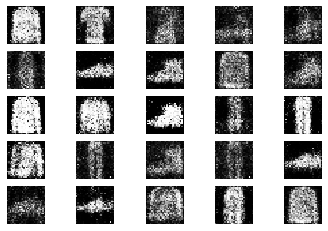

1601 [D loss: 0.580901, acc.: 73.44%] [G loss: 0.910013]
1602 [D loss: 0.614864, acc.: 70.31%] [G loss: 0.887740]
1603 [D loss: 0.738040, acc.: 54.69%] [G loss: 0.922986]
1604 [D loss: 0.570919, acc.: 68.75%] [G loss: 0.937341]
1605 [D loss: 0.622796, acc.: 67.19%] [G loss: 0.880430]
1606 [D loss: 0.597418, acc.: 71.88%] [G loss: 0.918597]
1607 [D loss: 0.643919, acc.: 64.06%] [G loss: 0.941492]
1608 [D loss: 0.645489, acc.: 60.94%] [G loss: 0.923374]
1609 [D loss: 0.615496, acc.: 62.50%] [G loss: 0.904959]
1610 [D loss: 0.605023, acc.: 64.06%] [G loss: 0.868134]
1611 [D loss: 0.636149, acc.: 59.38%] [G loss: 0.951952]
1612 [D loss: 0.668225, acc.: 65.62%] [G loss: 0.905465]
1613 [D loss: 0.612641, acc.: 67.19%] [G loss: 0.974936]
1614 [D loss: 0.565498, acc.: 71.88%] [G loss: 0.870059]
1615 [D loss: 0.685881, acc.: 54.69%] [G loss: 1.013807]
1616 [D loss: 0.570480, acc.: 70.31%] [G loss: 0.920884]
1617 [D loss: 0.591492, acc.: 68.75%] [G loss: 0.950591]
1618 [D loss: 0.592475, acc.: 6

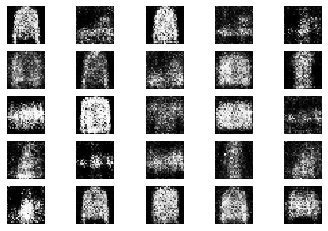

1801 [D loss: 0.666276, acc.: 57.81%] [G loss: 1.043712]
1802 [D loss: 0.672987, acc.: 57.81%] [G loss: 0.909959]
1803 [D loss: 0.592785, acc.: 70.31%] [G loss: 0.916799]
1804 [D loss: 0.582478, acc.: 73.44%] [G loss: 0.949380]
1805 [D loss: 0.649977, acc.: 67.19%] [G loss: 0.880854]
1806 [D loss: 0.562504, acc.: 73.44%] [G loss: 0.930847]
1807 [D loss: 0.640769, acc.: 57.81%] [G loss: 0.922731]
1808 [D loss: 0.652597, acc.: 54.69%] [G loss: 0.839053]
1809 [D loss: 0.688834, acc.: 50.00%] [G loss: 0.917315]
1810 [D loss: 0.602080, acc.: 59.38%] [G loss: 0.875924]
1811 [D loss: 0.655895, acc.: 60.94%] [G loss: 0.937646]
1812 [D loss: 0.643637, acc.: 62.50%] [G loss: 0.902170]
1813 [D loss: 0.627675, acc.: 59.38%] [G loss: 0.873742]
1814 [D loss: 0.669997, acc.: 60.94%] [G loss: 0.969696]
1815 [D loss: 0.607437, acc.: 68.75%] [G loss: 0.848244]
1816 [D loss: 0.638064, acc.: 57.81%] [G loss: 0.934923]
1817 [D loss: 0.631728, acc.: 64.06%] [G loss: 0.843985]
1818 [D loss: 0.631948, acc.: 5

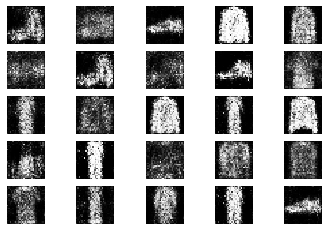

2001 [D loss: 0.643503, acc.: 64.06%] [G loss: 0.876890]
2002 [D loss: 0.658798, acc.: 65.62%] [G loss: 0.841456]
2003 [D loss: 0.697696, acc.: 53.12%] [G loss: 0.931075]
2004 [D loss: 0.608538, acc.: 62.50%] [G loss: 0.923195]
2005 [D loss: 0.621419, acc.: 70.31%] [G loss: 0.958364]
2006 [D loss: 0.626104, acc.: 62.50%] [G loss: 0.903378]
2007 [D loss: 0.596308, acc.: 62.50%] [G loss: 1.014454]
2008 [D loss: 0.585768, acc.: 64.06%] [G loss: 0.954479]
2009 [D loss: 0.736411, acc.: 57.81%] [G loss: 0.911761]
2010 [D loss: 0.602924, acc.: 70.31%] [G loss: 0.928328]
2011 [D loss: 0.632449, acc.: 60.94%] [G loss: 0.948109]
2012 [D loss: 0.621575, acc.: 60.94%] [G loss: 0.906015]
2013 [D loss: 0.578985, acc.: 64.06%] [G loss: 0.859000]
2014 [D loss: 0.572543, acc.: 73.44%] [G loss: 0.863878]
2015 [D loss: 0.633279, acc.: 59.38%] [G loss: 0.932779]
2016 [D loss: 0.637130, acc.: 64.06%] [G loss: 0.936712]
2017 [D loss: 0.652237, acc.: 62.50%] [G loss: 0.854810]
2018 [D loss: 0.605189, acc.: 6

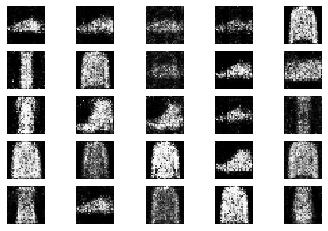

2201 [D loss: 0.605494, acc.: 68.75%] [G loss: 0.930660]
2202 [D loss: 0.598522, acc.: 65.62%] [G loss: 1.049529]
2203 [D loss: 0.585292, acc.: 64.06%] [G loss: 0.881822]
2204 [D loss: 0.655642, acc.: 60.94%] [G loss: 0.895147]
2205 [D loss: 0.683557, acc.: 57.81%] [G loss: 0.802288]
2206 [D loss: 0.661314, acc.: 65.62%] [G loss: 0.930123]
2207 [D loss: 0.571121, acc.: 73.44%] [G loss: 0.951256]
2208 [D loss: 0.583011, acc.: 68.75%] [G loss: 0.962329]
2209 [D loss: 0.570848, acc.: 71.88%] [G loss: 0.883699]
2210 [D loss: 0.637045, acc.: 70.31%] [G loss: 0.867699]
2211 [D loss: 0.613798, acc.: 65.62%] [G loss: 0.818562]
2212 [D loss: 0.632829, acc.: 64.06%] [G loss: 0.789604]
2213 [D loss: 0.649897, acc.: 56.25%] [G loss: 0.928717]
2214 [D loss: 0.626158, acc.: 65.62%] [G loss: 0.976241]
2215 [D loss: 0.669290, acc.: 57.81%] [G loss: 0.917467]
2216 [D loss: 0.601702, acc.: 71.88%] [G loss: 0.908226]
2217 [D loss: 0.687835, acc.: 46.88%] [G loss: 0.966969]
2218 [D loss: 0.534813, acc.: 7

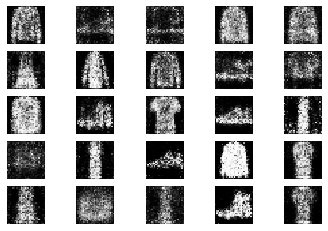

2401 [D loss: 0.642308, acc.: 59.38%] [G loss: 0.910680]
2402 [D loss: 0.597336, acc.: 70.31%] [G loss: 0.839079]
2403 [D loss: 0.650911, acc.: 57.81%] [G loss: 0.875389]
2404 [D loss: 0.605063, acc.: 64.06%] [G loss: 0.837282]
2405 [D loss: 0.678389, acc.: 53.12%] [G loss: 0.928086]
2406 [D loss: 0.566825, acc.: 70.31%] [G loss: 0.905244]
2407 [D loss: 0.591746, acc.: 78.12%] [G loss: 0.885002]
2408 [D loss: 0.621509, acc.: 65.62%] [G loss: 0.906948]
2409 [D loss: 0.671333, acc.: 62.50%] [G loss: 0.875776]
2410 [D loss: 0.648292, acc.: 56.25%] [G loss: 0.989476]
2411 [D loss: 0.607459, acc.: 64.06%] [G loss: 0.953811]
2412 [D loss: 0.597884, acc.: 68.75%] [G loss: 0.885340]
2413 [D loss: 0.614501, acc.: 59.38%] [G loss: 0.953380]
2414 [D loss: 0.672212, acc.: 64.06%] [G loss: 0.871329]
2415 [D loss: 0.555206, acc.: 73.44%] [G loss: 0.870703]
2416 [D loss: 0.612764, acc.: 65.62%] [G loss: 0.972239]
2417 [D loss: 0.597149, acc.: 65.62%] [G loss: 0.939966]
2418 [D loss: 0.632466, acc.: 6

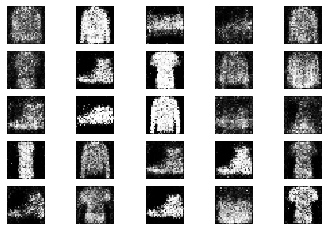

2601 [D loss: 0.659143, acc.: 56.25%] [G loss: 0.997656]
2602 [D loss: 0.669460, acc.: 64.06%] [G loss: 0.875308]
2603 [D loss: 0.640079, acc.: 57.81%] [G loss: 0.838757]
2604 [D loss: 0.647163, acc.: 59.38%] [G loss: 0.912124]
2605 [D loss: 0.620669, acc.: 64.06%] [G loss: 0.924953]
2606 [D loss: 0.659072, acc.: 59.38%] [G loss: 0.886646]
2607 [D loss: 0.592305, acc.: 71.88%] [G loss: 0.841621]
2608 [D loss: 0.649032, acc.: 59.38%] [G loss: 1.000263]
2609 [D loss: 0.685433, acc.: 62.50%] [G loss: 0.877875]
2610 [D loss: 0.632245, acc.: 62.50%] [G loss: 0.923086]
2611 [D loss: 0.604785, acc.: 71.88%] [G loss: 0.905115]
2612 [D loss: 0.621857, acc.: 62.50%] [G loss: 0.955116]
2613 [D loss: 0.571128, acc.: 78.12%] [G loss: 0.958930]
2614 [D loss: 0.620455, acc.: 64.06%] [G loss: 0.972588]
2615 [D loss: 0.636138, acc.: 64.06%] [G loss: 0.930955]
2616 [D loss: 0.632221, acc.: 59.38%] [G loss: 0.917127]
2617 [D loss: 0.652013, acc.: 59.38%] [G loss: 0.899734]
2618 [D loss: 0.663597, acc.: 5

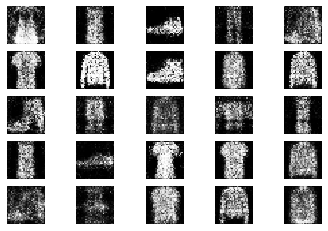

2801 [D loss: 0.582132, acc.: 70.31%] [G loss: 0.927890]
2802 [D loss: 0.604219, acc.: 62.50%] [G loss: 0.945537]
2803 [D loss: 0.689007, acc.: 46.88%] [G loss: 0.949395]
2804 [D loss: 0.566530, acc.: 70.31%] [G loss: 0.964264]
2805 [D loss: 0.706956, acc.: 54.69%] [G loss: 0.992445]
2806 [D loss: 0.633569, acc.: 59.38%] [G loss: 0.959348]
2807 [D loss: 0.691814, acc.: 45.31%] [G loss: 0.799978]
2808 [D loss: 0.557442, acc.: 73.44%] [G loss: 0.880186]
2809 [D loss: 0.650421, acc.: 56.25%] [G loss: 0.925662]
2810 [D loss: 0.663847, acc.: 57.81%] [G loss: 0.894451]
2811 [D loss: 0.639237, acc.: 62.50%] [G loss: 0.871039]
2812 [D loss: 0.582105, acc.: 65.62%] [G loss: 0.938869]
2813 [D loss: 0.655003, acc.: 60.94%] [G loss: 0.927687]
2814 [D loss: 0.608688, acc.: 57.81%] [G loss: 0.921850]
2815 [D loss: 0.624725, acc.: 62.50%] [G loss: 0.924015]
2816 [D loss: 0.600589, acc.: 68.75%] [G loss: 0.887813]
2817 [D loss: 0.622796, acc.: 59.38%] [G loss: 0.872772]
2818 [D loss: 0.585448, acc.: 7

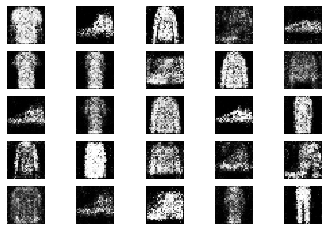

3001 [D loss: 0.673559, acc.: 64.06%] [G loss: 1.077229]
3002 [D loss: 0.592610, acc.: 75.00%] [G loss: 0.949420]
3003 [D loss: 0.625690, acc.: 59.38%] [G loss: 0.943184]
3004 [D loss: 0.647773, acc.: 65.62%] [G loss: 0.839341]
3005 [D loss: 0.640683, acc.: 53.12%] [G loss: 0.881491]
3006 [D loss: 0.712665, acc.: 54.69%] [G loss: 0.821434]
3007 [D loss: 0.623374, acc.: 68.75%] [G loss: 0.850031]
3008 [D loss: 0.657963, acc.: 62.50%] [G loss: 0.838347]
3009 [D loss: 0.620782, acc.: 70.31%] [G loss: 0.752111]
3010 [D loss: 0.552742, acc.: 79.69%] [G loss: 0.921046]
3011 [D loss: 0.630838, acc.: 65.62%] [G loss: 0.898980]
3012 [D loss: 0.657466, acc.: 60.94%] [G loss: 0.931027]
3013 [D loss: 0.618571, acc.: 65.62%] [G loss: 0.954276]
3014 [D loss: 0.642729, acc.: 54.69%] [G loss: 0.867756]
3015 [D loss: 0.679852, acc.: 56.25%] [G loss: 0.825129]
3016 [D loss: 0.685210, acc.: 53.12%] [G loss: 1.063721]
3017 [D loss: 0.692535, acc.: 59.38%] [G loss: 0.958488]
3018 [D loss: 0.674688, acc.: 5

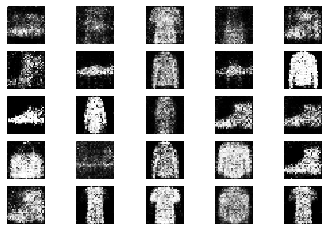

3201 [D loss: 0.652705, acc.: 59.38%] [G loss: 0.865477]
3202 [D loss: 0.680124, acc.: 53.12%] [G loss: 0.938724]
3203 [D loss: 0.614225, acc.: 71.88%] [G loss: 0.963336]
3204 [D loss: 0.600249, acc.: 64.06%] [G loss: 0.928521]
3205 [D loss: 0.673658, acc.: 59.38%] [G loss: 0.883603]
3206 [D loss: 0.650810, acc.: 64.06%] [G loss: 0.866476]
3207 [D loss: 0.648110, acc.: 54.69%] [G loss: 0.857217]
3208 [D loss: 0.665652, acc.: 65.62%] [G loss: 0.804320]
3209 [D loss: 0.602291, acc.: 67.19%] [G loss: 0.970691]
3210 [D loss: 0.629639, acc.: 60.94%] [G loss: 0.857990]
3211 [D loss: 0.661171, acc.: 60.94%] [G loss: 0.900392]
3212 [D loss: 0.716997, acc.: 46.88%] [G loss: 0.844893]
3213 [D loss: 0.684365, acc.: 57.81%] [G loss: 0.875960]
3214 [D loss: 0.605466, acc.: 70.31%] [G loss: 0.894354]
3215 [D loss: 0.603591, acc.: 62.50%] [G loss: 0.906536]
3216 [D loss: 0.671923, acc.: 64.06%] [G loss: 0.936770]
3217 [D loss: 0.733063, acc.: 50.00%] [G loss: 0.846246]
3218 [D loss: 0.639659, acc.: 5

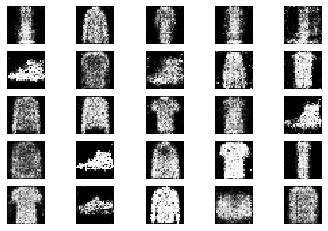

3401 [D loss: 0.652134, acc.: 62.50%] [G loss: 0.927418]
3402 [D loss: 0.618938, acc.: 68.75%] [G loss: 1.022180]
3403 [D loss: 0.682725, acc.: 60.94%] [G loss: 0.918396]
3404 [D loss: 0.640352, acc.: 65.62%] [G loss: 0.918404]
3405 [D loss: 0.663219, acc.: 54.69%] [G loss: 0.923164]
3406 [D loss: 0.616731, acc.: 68.75%] [G loss: 0.868572]
3407 [D loss: 0.604041, acc.: 71.88%] [G loss: 0.907944]
3408 [D loss: 0.667346, acc.: 62.50%] [G loss: 0.929295]
3409 [D loss: 0.694495, acc.: 59.38%] [G loss: 0.962865]
3410 [D loss: 0.654670, acc.: 57.81%] [G loss: 0.905725]
3411 [D loss: 0.724061, acc.: 54.69%] [G loss: 0.976805]
3412 [D loss: 0.602391, acc.: 75.00%] [G loss: 0.878158]
3413 [D loss: 0.655776, acc.: 50.00%] [G loss: 0.950930]
3414 [D loss: 0.583172, acc.: 73.44%] [G loss: 1.000570]
3415 [D loss: 0.698108, acc.: 54.69%] [G loss: 0.922924]
3416 [D loss: 0.642917, acc.: 67.19%] [G loss: 0.841177]
3417 [D loss: 0.585198, acc.: 78.12%] [G loss: 0.986437]
3418 [D loss: 0.657841, acc.: 5

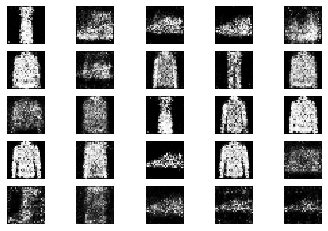

3601 [D loss: 0.614689, acc.: 67.19%] [G loss: 0.881182]
3602 [D loss: 0.687665, acc.: 64.06%] [G loss: 0.833422]
3603 [D loss: 0.639115, acc.: 62.50%] [G loss: 0.906098]
3604 [D loss: 0.583457, acc.: 67.19%] [G loss: 0.909403]
3605 [D loss: 0.548239, acc.: 81.25%] [G loss: 0.912384]
3606 [D loss: 0.597734, acc.: 71.88%] [G loss: 0.790493]
3607 [D loss: 0.660319, acc.: 59.38%] [G loss: 0.898183]
3608 [D loss: 0.720105, acc.: 57.81%] [G loss: 0.927639]
3609 [D loss: 0.643957, acc.: 60.94%] [G loss: 0.972878]
3610 [D loss: 0.693918, acc.: 57.81%] [G loss: 0.874854]
3611 [D loss: 0.623545, acc.: 67.19%] [G loss: 0.949509]
3612 [D loss: 0.653888, acc.: 57.81%] [G loss: 0.869063]
3613 [D loss: 0.666196, acc.: 50.00%] [G loss: 0.990569]
3614 [D loss: 0.670413, acc.: 54.69%] [G loss: 0.902577]
3615 [D loss: 0.700308, acc.: 51.56%] [G loss: 0.990768]
3616 [D loss: 0.561032, acc.: 73.44%] [G loss: 0.879915]
3617 [D loss: 0.659884, acc.: 60.94%] [G loss: 0.912622]
3618 [D loss: 0.630142, acc.: 6

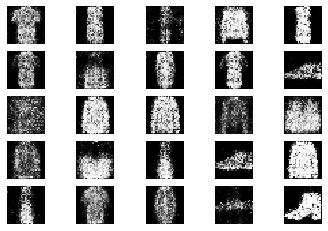

3801 [D loss: 0.654247, acc.: 60.94%] [G loss: 0.842224]
3802 [D loss: 0.654631, acc.: 64.06%] [G loss: 0.886904]
3803 [D loss: 0.731825, acc.: 46.88%] [G loss: 0.841590]
3804 [D loss: 0.598358, acc.: 68.75%] [G loss: 0.900390]
3805 [D loss: 0.555409, acc.: 73.44%] [G loss: 0.950098]
3806 [D loss: 0.620407, acc.: 70.31%] [G loss: 0.958350]
3807 [D loss: 0.640030, acc.: 64.06%] [G loss: 0.920370]
3808 [D loss: 0.642919, acc.: 57.81%] [G loss: 0.933923]
3809 [D loss: 0.721326, acc.: 48.44%] [G loss: 0.873813]
3810 [D loss: 0.626870, acc.: 64.06%] [G loss: 0.932235]
3811 [D loss: 0.636514, acc.: 60.94%] [G loss: 0.963762]
3812 [D loss: 0.579462, acc.: 68.75%] [G loss: 0.892328]
3813 [D loss: 0.645504, acc.: 62.50%] [G loss: 0.924183]
3814 [D loss: 0.621890, acc.: 65.62%] [G loss: 0.926022]
3815 [D loss: 0.652875, acc.: 67.19%] [G loss: 0.845980]
3816 [D loss: 0.708893, acc.: 57.81%] [G loss: 0.922094]
3817 [D loss: 0.597920, acc.: 68.75%] [G loss: 0.853698]
3818 [D loss: 0.626942, acc.: 5

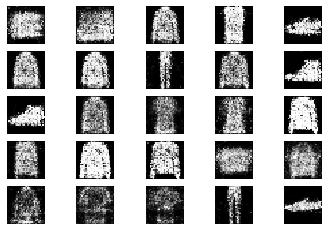

4001 [D loss: 0.618513, acc.: 70.31%] [G loss: 0.779774]
4002 [D loss: 0.689570, acc.: 57.81%] [G loss: 0.868935]
4003 [D loss: 0.693414, acc.: 57.81%] [G loss: 0.862832]
4004 [D loss: 0.645825, acc.: 67.19%] [G loss: 0.901371]
4005 [D loss: 0.643801, acc.: 60.94%] [G loss: 0.863023]
4006 [D loss: 0.623843, acc.: 70.31%] [G loss: 0.896578]
4007 [D loss: 0.726356, acc.: 57.81%] [G loss: 0.913511]
4008 [D loss: 0.648216, acc.: 56.25%] [G loss: 0.898449]
4009 [D loss: 0.706946, acc.: 45.31%] [G loss: 0.962495]
4010 [D loss: 0.632562, acc.: 64.06%] [G loss: 0.935909]
4011 [D loss: 0.660914, acc.: 68.75%] [G loss: 0.985501]
4012 [D loss: 0.554647, acc.: 78.12%] [G loss: 0.882791]
4013 [D loss: 0.610728, acc.: 62.50%] [G loss: 0.884557]
4014 [D loss: 0.631432, acc.: 67.19%] [G loss: 0.859787]
4015 [D loss: 0.661520, acc.: 54.69%] [G loss: 0.914359]
4016 [D loss: 0.613994, acc.: 73.44%] [G loss: 0.843219]
4017 [D loss: 0.628734, acc.: 67.19%] [G loss: 0.865752]
4018 [D loss: 0.682589, acc.: 5

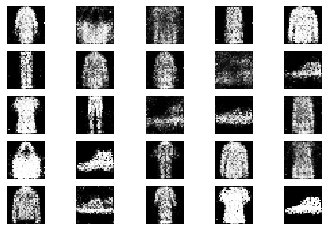

4201 [D loss: 0.668177, acc.: 53.12%] [G loss: 0.971782]
4202 [D loss: 0.664193, acc.: 56.25%] [G loss: 0.845111]
4203 [D loss: 0.577407, acc.: 73.44%] [G loss: 0.983560]
4204 [D loss: 0.625093, acc.: 73.44%] [G loss: 0.830180]
4205 [D loss: 0.674946, acc.: 57.81%] [G loss: 0.925444]
4206 [D loss: 0.631725, acc.: 64.06%] [G loss: 0.934261]
4207 [D loss: 0.610598, acc.: 65.62%] [G loss: 0.954853]
4208 [D loss: 0.702994, acc.: 56.25%] [G loss: 0.971214]
4209 [D loss: 0.651802, acc.: 67.19%] [G loss: 0.916637]
4210 [D loss: 0.658844, acc.: 60.94%] [G loss: 0.907909]
4211 [D loss: 0.656799, acc.: 67.19%] [G loss: 0.991184]
4212 [D loss: 0.699378, acc.: 57.81%] [G loss: 0.904254]
4213 [D loss: 0.651148, acc.: 65.62%] [G loss: 0.928949]
4214 [D loss: 0.617902, acc.: 67.19%] [G loss: 0.823456]
4215 [D loss: 0.625128, acc.: 67.19%] [G loss: 0.978595]
4216 [D loss: 0.633104, acc.: 65.62%] [G loss: 0.893771]
4217 [D loss: 0.650989, acc.: 59.38%] [G loss: 0.889203]
4218 [D loss: 0.625299, acc.: 6

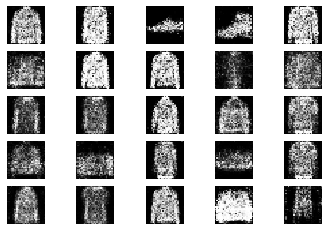

4401 [D loss: 0.629018, acc.: 59.38%] [G loss: 0.882727]
4402 [D loss: 0.652306, acc.: 56.25%] [G loss: 0.946464]
4403 [D loss: 0.642801, acc.: 65.62%] [G loss: 0.972632]
4404 [D loss: 0.600139, acc.: 75.00%] [G loss: 0.885044]
4405 [D loss: 0.613253, acc.: 70.31%] [G loss: 0.911592]
4406 [D loss: 0.524721, acc.: 81.25%] [G loss: 0.888638]
4407 [D loss: 0.595910, acc.: 70.31%] [G loss: 0.951727]
4408 [D loss: 0.646979, acc.: 59.38%] [G loss: 0.873415]
4409 [D loss: 0.658494, acc.: 60.94%] [G loss: 0.952344]
4410 [D loss: 0.646610, acc.: 59.38%] [G loss: 0.899305]
4411 [D loss: 0.589333, acc.: 67.19%] [G loss: 0.855086]
4412 [D loss: 0.638336, acc.: 54.69%] [G loss: 0.867218]
4413 [D loss: 0.632136, acc.: 62.50%] [G loss: 0.922303]
4414 [D loss: 0.686993, acc.: 54.69%] [G loss: 0.842011]
4415 [D loss: 0.674073, acc.: 51.56%] [G loss: 0.901403]
4416 [D loss: 0.585377, acc.: 67.19%] [G loss: 0.828873]
4417 [D loss: 0.646882, acc.: 64.06%] [G loss: 0.907052]
4418 [D loss: 0.674511, acc.: 5

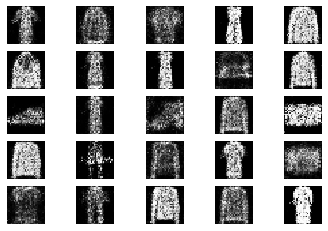

4601 [D loss: 0.605223, acc.: 76.56%] [G loss: 0.870733]
4602 [D loss: 0.675769, acc.: 56.25%] [G loss: 0.828861]
4603 [D loss: 0.690738, acc.: 59.38%] [G loss: 0.882641]
4604 [D loss: 0.651913, acc.: 57.81%] [G loss: 0.832648]
4605 [D loss: 0.642440, acc.: 65.62%] [G loss: 0.913253]
4606 [D loss: 0.698057, acc.: 57.81%] [G loss: 0.886886]
4607 [D loss: 0.733602, acc.: 46.88%] [G loss: 1.046524]
4608 [D loss: 0.646140, acc.: 64.06%] [G loss: 0.944897]
4609 [D loss: 0.638250, acc.: 67.19%] [G loss: 1.006860]
4610 [D loss: 0.628612, acc.: 65.62%] [G loss: 1.004618]
4611 [D loss: 0.621994, acc.: 67.19%] [G loss: 0.872267]
4612 [D loss: 0.660138, acc.: 59.38%] [G loss: 0.860955]
4613 [D loss: 0.653045, acc.: 62.50%] [G loss: 0.926830]
4614 [D loss: 0.599295, acc.: 75.00%] [G loss: 0.876743]
4615 [D loss: 0.676341, acc.: 62.50%] [G loss: 0.992719]
4616 [D loss: 0.600853, acc.: 73.44%] [G loss: 0.927036]
4617 [D loss: 0.640157, acc.: 60.94%] [G loss: 0.870213]
4618 [D loss: 0.618725, acc.: 6

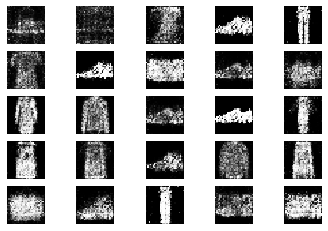

4801 [D loss: 0.609261, acc.: 64.06%] [G loss: 0.909551]
4802 [D loss: 0.774848, acc.: 54.69%] [G loss: 0.953591]
4803 [D loss: 0.647070, acc.: 67.19%] [G loss: 0.935473]
4804 [D loss: 0.648147, acc.: 56.25%] [G loss: 0.867665]
4805 [D loss: 0.677760, acc.: 56.25%] [G loss: 0.833971]
4806 [D loss: 0.588375, acc.: 75.00%] [G loss: 0.776737]
4807 [D loss: 0.615175, acc.: 67.19%] [G loss: 0.863273]
4808 [D loss: 0.599061, acc.: 75.00%] [G loss: 0.853562]
4809 [D loss: 0.639259, acc.: 64.06%] [G loss: 0.916025]
4810 [D loss: 0.637023, acc.: 64.06%] [G loss: 0.871894]
4811 [D loss: 0.648157, acc.: 54.69%] [G loss: 0.931787]
4812 [D loss: 0.629992, acc.: 64.06%] [G loss: 0.918829]
4813 [D loss: 0.695221, acc.: 60.94%] [G loss: 0.838007]
4814 [D loss: 0.692327, acc.: 54.69%] [G loss: 0.921237]
4815 [D loss: 0.610623, acc.: 56.25%] [G loss: 0.924966]
4816 [D loss: 0.634707, acc.: 68.75%] [G loss: 0.922022]
4817 [D loss: 0.629691, acc.: 67.19%] [G loss: 0.935458]
4818 [D loss: 0.627039, acc.: 6

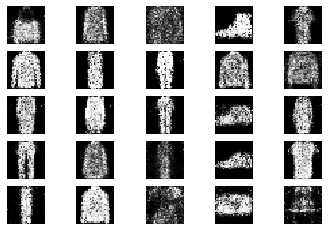

5001 [D loss: 0.599124, acc.: 73.44%] [G loss: 0.987948]
5002 [D loss: 0.702644, acc.: 46.88%] [G loss: 0.829545]
5003 [D loss: 0.672961, acc.: 64.06%] [G loss: 0.847273]
5004 [D loss: 0.670078, acc.: 57.81%] [G loss: 0.836299]
5005 [D loss: 0.599303, acc.: 76.56%] [G loss: 0.855847]
5006 [D loss: 0.677718, acc.: 60.94%] [G loss: 0.858799]
5007 [D loss: 0.667413, acc.: 62.50%] [G loss: 0.934417]
5008 [D loss: 0.611881, acc.: 65.62%] [G loss: 0.864509]
5009 [D loss: 0.626769, acc.: 59.38%] [G loss: 0.969829]
5010 [D loss: 0.694917, acc.: 60.94%] [G loss: 0.939511]
5011 [D loss: 0.669802, acc.: 57.81%] [G loss: 0.928107]
5012 [D loss: 0.639075, acc.: 67.19%] [G loss: 0.906765]
5013 [D loss: 0.621464, acc.: 60.94%] [G loss: 0.944995]
5014 [D loss: 0.591633, acc.: 64.06%] [G loss: 0.911563]
5015 [D loss: 0.643010, acc.: 64.06%] [G loss: 0.904954]
5016 [D loss: 0.738080, acc.: 51.56%] [G loss: 0.864164]
5017 [D loss: 0.601394, acc.: 62.50%] [G loss: 0.813306]
5018 [D loss: 0.643117, acc.: 5

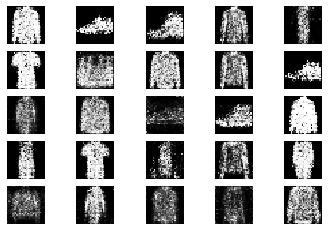

5201 [D loss: 0.728137, acc.: 48.44%] [G loss: 0.827226]
5202 [D loss: 0.695679, acc.: 54.69%] [G loss: 0.830305]
5203 [D loss: 0.642688, acc.: 62.50%] [G loss: 0.904092]
5204 [D loss: 0.580707, acc.: 67.19%] [G loss: 0.968731]
5205 [D loss: 0.656460, acc.: 60.94%] [G loss: 0.942968]
5206 [D loss: 0.663126, acc.: 56.25%] [G loss: 0.800210]
5207 [D loss: 0.680034, acc.: 53.12%] [G loss: 0.884390]
5208 [D loss: 0.623477, acc.: 64.06%] [G loss: 0.868744]
5209 [D loss: 0.672686, acc.: 57.81%] [G loss: 0.837107]
5210 [D loss: 0.683655, acc.: 53.12%] [G loss: 0.890295]
5211 [D loss: 0.654160, acc.: 59.38%] [G loss: 0.911825]
5212 [D loss: 0.660834, acc.: 62.50%] [G loss: 0.882762]
5213 [D loss: 0.690241, acc.: 57.81%] [G loss: 0.918240]
5214 [D loss: 0.670067, acc.: 62.50%] [G loss: 0.868717]
5215 [D loss: 0.598449, acc.: 70.31%] [G loss: 0.929303]
5216 [D loss: 0.620721, acc.: 67.19%] [G loss: 0.848230]
5217 [D loss: 0.602806, acc.: 68.75%] [G loss: 0.879357]
5218 [D loss: 0.737481, acc.: 5

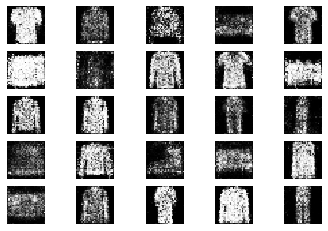

5401 [D loss: 0.613684, acc.: 71.88%] [G loss: 0.889638]
5402 [D loss: 0.667597, acc.: 60.94%] [G loss: 0.812475]
5403 [D loss: 0.597140, acc.: 65.62%] [G loss: 0.859383]
5404 [D loss: 0.691392, acc.: 57.81%] [G loss: 0.880598]
5405 [D loss: 0.625639, acc.: 64.06%] [G loss: 0.853166]
5406 [D loss: 0.678604, acc.: 50.00%] [G loss: 0.839024]
5407 [D loss: 0.703230, acc.: 57.81%] [G loss: 0.934773]
5408 [D loss: 0.679219, acc.: 57.81%] [G loss: 0.915967]
5409 [D loss: 0.668979, acc.: 53.12%] [G loss: 0.978552]
5410 [D loss: 0.667878, acc.: 65.62%] [G loss: 0.941874]
5411 [D loss: 0.659660, acc.: 60.94%] [G loss: 0.866387]
5412 [D loss: 0.635515, acc.: 64.06%] [G loss: 0.901596]
5413 [D loss: 0.668454, acc.: 64.06%] [G loss: 0.917356]
5414 [D loss: 0.643084, acc.: 59.38%] [G loss: 0.909592]
5415 [D loss: 0.653404, acc.: 62.50%] [G loss: 0.957099]
5416 [D loss: 0.629010, acc.: 70.31%] [G loss: 0.882109]
5417 [D loss: 0.674041, acc.: 56.25%] [G loss: 0.881960]
5418 [D loss: 0.646198, acc.: 6

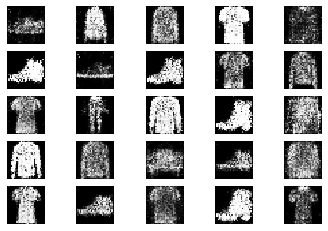

5601 [D loss: 0.633591, acc.: 64.06%] [G loss: 0.884544]
5602 [D loss: 0.680172, acc.: 57.81%] [G loss: 0.954177]
5603 [D loss: 0.591581, acc.: 71.88%] [G loss: 0.881843]
5604 [D loss: 0.651378, acc.: 64.06%] [G loss: 0.997817]
5605 [D loss: 0.704844, acc.: 60.94%] [G loss: 0.884720]
5606 [D loss: 0.648712, acc.: 65.62%] [G loss: 0.917698]
5607 [D loss: 0.588432, acc.: 73.44%] [G loss: 0.965717]
5608 [D loss: 0.647439, acc.: 64.06%] [G loss: 0.829080]
5609 [D loss: 0.673177, acc.: 56.25%] [G loss: 0.895500]
5610 [D loss: 0.622520, acc.: 62.50%] [G loss: 0.856664]
5611 [D loss: 0.653033, acc.: 57.81%] [G loss: 0.899084]
5612 [D loss: 0.659496, acc.: 62.50%] [G loss: 0.886243]
5613 [D loss: 0.618572, acc.: 70.31%] [G loss: 0.906556]
5614 [D loss: 0.626877, acc.: 65.62%] [G loss: 0.871284]
5615 [D loss: 0.559178, acc.: 75.00%] [G loss: 0.896835]
5616 [D loss: 0.683740, acc.: 62.50%] [G loss: 0.872448]
5617 [D loss: 0.615820, acc.: 65.62%] [G loss: 0.905614]
5618 [D loss: 0.694674, acc.: 5

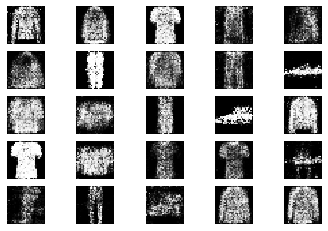

5801 [D loss: 0.610509, acc.: 65.62%] [G loss: 0.949247]
5802 [D loss: 0.623015, acc.: 59.38%] [G loss: 0.917158]
5803 [D loss: 0.627064, acc.: 57.81%] [G loss: 0.962965]
5804 [D loss: 0.655343, acc.: 64.06%] [G loss: 1.094705]
5805 [D loss: 0.651757, acc.: 56.25%] [G loss: 0.963978]
5806 [D loss: 0.660773, acc.: 65.62%] [G loss: 0.941006]
5807 [D loss: 0.648590, acc.: 59.38%] [G loss: 0.883251]
5808 [D loss: 0.626382, acc.: 64.06%] [G loss: 1.001841]
5809 [D loss: 0.653291, acc.: 64.06%] [G loss: 0.944337]
5810 [D loss: 0.590686, acc.: 79.69%] [G loss: 0.952440]
5811 [D loss: 0.628175, acc.: 64.06%] [G loss: 0.835110]
5812 [D loss: 0.623620, acc.: 65.62%] [G loss: 0.935050]
5813 [D loss: 0.618097, acc.: 70.31%] [G loss: 0.835664]
5814 [D loss: 0.663956, acc.: 56.25%] [G loss: 0.862711]
5815 [D loss: 0.613649, acc.: 65.62%] [G loss: 0.801408]
5816 [D loss: 0.741362, acc.: 45.31%] [G loss: 0.906596]
5817 [D loss: 0.647345, acc.: 67.19%] [G loss: 0.944847]
5818 [D loss: 0.663282, acc.: 6

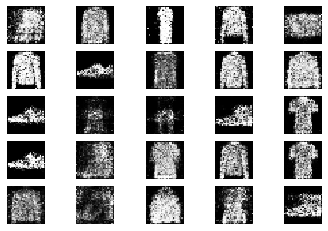

6001 [D loss: 0.665621, acc.: 60.94%] [G loss: 0.830297]
6002 [D loss: 0.667689, acc.: 57.81%] [G loss: 0.824198]
6003 [D loss: 0.683330, acc.: 57.81%] [G loss: 0.848016]
6004 [D loss: 0.596517, acc.: 65.62%] [G loss: 0.901105]
6005 [D loss: 0.678945, acc.: 65.62%] [G loss: 0.905453]
6006 [D loss: 0.668617, acc.: 53.12%] [G loss: 0.853345]
6007 [D loss: 0.657259, acc.: 57.81%] [G loss: 0.971075]
6008 [D loss: 0.600511, acc.: 62.50%] [G loss: 0.902883]
6009 [D loss: 0.623746, acc.: 60.94%] [G loss: 0.961633]
6010 [D loss: 0.732934, acc.: 54.69%] [G loss: 0.877566]
6011 [D loss: 0.648536, acc.: 54.69%] [G loss: 0.894559]
6012 [D loss: 0.647034, acc.: 62.50%] [G loss: 0.891175]
6013 [D loss: 0.652807, acc.: 59.38%] [G loss: 0.927877]
6014 [D loss: 0.641832, acc.: 57.81%] [G loss: 0.965567]
6015 [D loss: 0.637486, acc.: 62.50%] [G loss: 0.924044]
6016 [D loss: 0.670696, acc.: 59.38%] [G loss: 0.989134]
6017 [D loss: 0.674353, acc.: 53.12%] [G loss: 0.902642]
6018 [D loss: 0.599343, acc.: 6

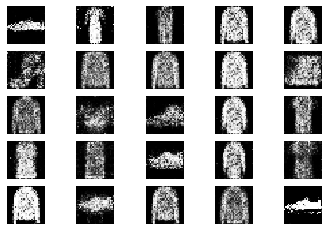

6201 [D loss: 0.590644, acc.: 71.88%] [G loss: 0.855819]
6202 [D loss: 0.629122, acc.: 59.38%] [G loss: 0.938002]
6203 [D loss: 0.692118, acc.: 56.25%] [G loss: 0.908058]
6204 [D loss: 0.704714, acc.: 56.25%] [G loss: 0.859927]
6205 [D loss: 0.654669, acc.: 62.50%] [G loss: 0.887425]
6206 [D loss: 0.664947, acc.: 53.12%] [G loss: 0.823400]
6207 [D loss: 0.640599, acc.: 59.38%] [G loss: 0.950365]
6208 [D loss: 0.680380, acc.: 57.81%] [G loss: 0.839203]
6209 [D loss: 0.690511, acc.: 59.38%] [G loss: 0.866145]
6210 [D loss: 0.658259, acc.: 59.38%] [G loss: 0.850515]
6211 [D loss: 0.689910, acc.: 53.12%] [G loss: 0.849905]
6212 [D loss: 0.624966, acc.: 56.25%] [G loss: 0.830221]
6213 [D loss: 0.623643, acc.: 62.50%] [G loss: 0.918495]
6214 [D loss: 0.645649, acc.: 67.19%] [G loss: 0.882931]
6215 [D loss: 0.620928, acc.: 65.62%] [G loss: 0.937349]
6216 [D loss: 0.667175, acc.: 64.06%] [G loss: 0.849817]
6217 [D loss: 0.711577, acc.: 51.56%] [G loss: 0.925827]
6218 [D loss: 0.572707, acc.: 6

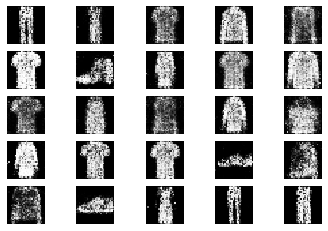

6401 [D loss: 0.653962, acc.: 59.38%] [G loss: 0.951303]
6402 [D loss: 0.681044, acc.: 59.38%] [G loss: 0.857118]
6403 [D loss: 0.675476, acc.: 54.69%] [G loss: 0.962977]
6404 [D loss: 0.678657, acc.: 59.38%] [G loss: 1.003510]
6405 [D loss: 0.681472, acc.: 54.69%] [G loss: 0.999474]
6406 [D loss: 0.684260, acc.: 57.81%] [G loss: 0.959777]
6407 [D loss: 0.687543, acc.: 53.12%] [G loss: 0.927570]
6408 [D loss: 0.631209, acc.: 65.62%] [G loss: 0.923860]
6409 [D loss: 0.615941, acc.: 70.31%] [G loss: 0.953741]
6410 [D loss: 0.673789, acc.: 59.38%] [G loss: 0.928402]
6411 [D loss: 0.682130, acc.: 59.38%] [G loss: 0.856667]
6412 [D loss: 0.647218, acc.: 57.81%] [G loss: 0.851280]
6413 [D loss: 0.609401, acc.: 71.88%] [G loss: 0.827393]
6414 [D loss: 0.662023, acc.: 56.25%] [G loss: 0.870144]
6415 [D loss: 0.631174, acc.: 64.06%] [G loss: 0.912901]
6416 [D loss: 0.679115, acc.: 54.69%] [G loss: 0.875641]
6417 [D loss: 0.664573, acc.: 62.50%] [G loss: 0.743756]
6418 [D loss: 0.667853, acc.: 6

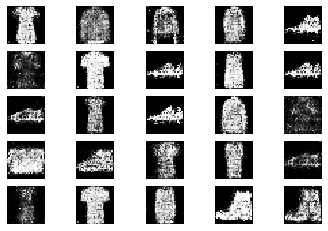

6601 [D loss: 0.709334, acc.: 56.25%] [G loss: 0.907149]
6602 [D loss: 0.668357, acc.: 60.94%] [G loss: 0.927860]
6603 [D loss: 0.669873, acc.: 56.25%] [G loss: 0.917078]
6604 [D loss: 0.625178, acc.: 65.62%] [G loss: 0.917735]
6605 [D loss: 0.655047, acc.: 54.69%] [G loss: 0.860319]
6606 [D loss: 0.660231, acc.: 57.81%] [G loss: 0.905531]
6607 [D loss: 0.619062, acc.: 65.62%] [G loss: 0.877580]
6608 [D loss: 0.609655, acc.: 68.75%] [G loss: 0.924531]
6609 [D loss: 0.631023, acc.: 60.94%] [G loss: 0.829032]
6610 [D loss: 0.654522, acc.: 62.50%] [G loss: 0.943825]
6611 [D loss: 0.639206, acc.: 57.81%] [G loss: 0.877801]
6612 [D loss: 0.682024, acc.: 60.94%] [G loss: 0.855045]
6613 [D loss: 0.630009, acc.: 60.94%] [G loss: 0.907481]
6614 [D loss: 0.645032, acc.: 62.50%] [G loss: 0.938885]
6615 [D loss: 0.653288, acc.: 56.25%] [G loss: 0.869601]
6616 [D loss: 0.606006, acc.: 67.19%] [G loss: 0.905288]
6617 [D loss: 0.591655, acc.: 71.88%] [G loss: 0.960851]
6618 [D loss: 0.639929, acc.: 7

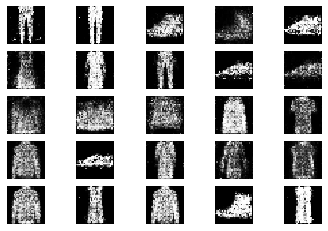

6801 [D loss: 0.652700, acc.: 60.94%] [G loss: 0.889145]
6802 [D loss: 0.633015, acc.: 65.62%] [G loss: 0.940458]
6803 [D loss: 0.618815, acc.: 68.75%] [G loss: 1.008482]
6804 [D loss: 0.657022, acc.: 67.19%] [G loss: 1.008866]
6805 [D loss: 0.617947, acc.: 65.62%] [G loss: 0.939143]
6806 [D loss: 0.652679, acc.: 64.06%] [G loss: 0.870157]
6807 [D loss: 0.687319, acc.: 57.81%] [G loss: 0.873399]
6808 [D loss: 0.724564, acc.: 48.44%] [G loss: 0.954048]
6809 [D loss: 0.608889, acc.: 71.88%] [G loss: 0.991946]
6810 [D loss: 0.629948, acc.: 62.50%] [G loss: 0.928488]
6811 [D loss: 0.659185, acc.: 60.94%] [G loss: 0.907551]
6812 [D loss: 0.675283, acc.: 60.94%] [G loss: 0.891001]
6813 [D loss: 0.667627, acc.: 56.25%] [G loss: 0.873394]
6814 [D loss: 0.697384, acc.: 60.94%] [G loss: 0.883789]
6815 [D loss: 0.577882, acc.: 68.75%] [G loss: 0.922189]
6816 [D loss: 0.720041, acc.: 48.44%] [G loss: 0.985758]
6817 [D loss: 0.644607, acc.: 67.19%] [G loss: 0.954889]
6818 [D loss: 0.656460, acc.: 6

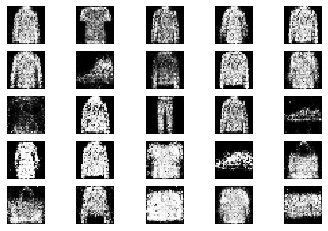

7001 [D loss: 0.687055, acc.: 57.81%] [G loss: 0.831038]
7002 [D loss: 0.681281, acc.: 59.38%] [G loss: 0.933658]
7003 [D loss: 0.650463, acc.: 60.94%] [G loss: 0.913521]
7004 [D loss: 0.610293, acc.: 71.88%] [G loss: 0.886732]
7005 [D loss: 0.654695, acc.: 53.12%] [G loss: 0.921363]
7006 [D loss: 0.635691, acc.: 70.31%] [G loss: 0.968630]
7007 [D loss: 0.614700, acc.: 73.44%] [G loss: 0.861766]
7008 [D loss: 0.611652, acc.: 64.06%] [G loss: 0.997991]
7009 [D loss: 0.675178, acc.: 56.25%] [G loss: 1.020660]
7010 [D loss: 0.644894, acc.: 70.31%] [G loss: 1.026675]
7011 [D loss: 0.568810, acc.: 75.00%] [G loss: 0.885254]
7012 [D loss: 0.670908, acc.: 60.94%] [G loss: 0.920981]
7013 [D loss: 0.677527, acc.: 50.00%] [G loss: 0.923039]
7014 [D loss: 0.638848, acc.: 68.75%] [G loss: 0.851868]
7015 [D loss: 0.685269, acc.: 57.81%] [G loss: 0.857162]
7016 [D loss: 0.695732, acc.: 56.25%] [G loss: 0.910392]
7017 [D loss: 0.712545, acc.: 51.56%] [G loss: 0.842358]
7018 [D loss: 0.679943, acc.: 5

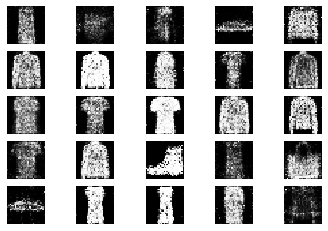

7201 [D loss: 0.636621, acc.: 62.50%] [G loss: 0.830685]
7202 [D loss: 0.649217, acc.: 57.81%] [G loss: 0.876594]
7203 [D loss: 0.692227, acc.: 59.38%] [G loss: 0.899025]
7204 [D loss: 0.630168, acc.: 62.50%] [G loss: 0.925301]
7205 [D loss: 0.580899, acc.: 70.31%] [G loss: 0.919329]
7206 [D loss: 0.660842, acc.: 53.12%] [G loss: 0.900261]
7207 [D loss: 0.626154, acc.: 64.06%] [G loss: 0.881028]
7208 [D loss: 0.638487, acc.: 60.94%] [G loss: 0.885747]
7209 [D loss: 0.599619, acc.: 62.50%] [G loss: 0.867693]
7210 [D loss: 0.594648, acc.: 68.75%] [G loss: 0.914393]
7211 [D loss: 0.679790, acc.: 57.81%] [G loss: 0.865920]
7212 [D loss: 0.640438, acc.: 60.94%] [G loss: 0.910439]
7213 [D loss: 0.677748, acc.: 56.25%] [G loss: 0.800956]
7214 [D loss: 0.698249, acc.: 48.44%] [G loss: 0.800660]
7215 [D loss: 0.656757, acc.: 60.94%] [G loss: 0.897707]
7216 [D loss: 0.685047, acc.: 56.25%] [G loss: 0.933324]
7217 [D loss: 0.686707, acc.: 64.06%] [G loss: 0.837418]
7218 [D loss: 0.609949, acc.: 6

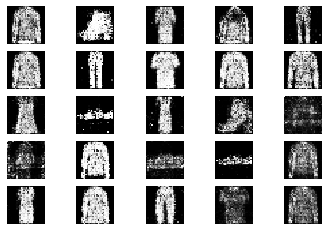

7401 [D loss: 0.638361, acc.: 60.94%] [G loss: 0.902296]
7402 [D loss: 0.651694, acc.: 64.06%] [G loss: 0.907546]
7403 [D loss: 0.708347, acc.: 54.69%] [G loss: 0.930821]
7404 [D loss: 0.639048, acc.: 59.38%] [G loss: 1.017891]
7405 [D loss: 0.693518, acc.: 54.69%] [G loss: 0.975377]
7406 [D loss: 0.625390, acc.: 67.19%] [G loss: 0.996361]
7407 [D loss: 0.702702, acc.: 53.12%] [G loss: 0.912457]
7408 [D loss: 0.636498, acc.: 60.94%] [G loss: 0.921925]
7409 [D loss: 0.622991, acc.: 65.62%] [G loss: 1.053339]
7410 [D loss: 0.698022, acc.: 62.50%] [G loss: 0.979034]
7411 [D loss: 0.658616, acc.: 53.12%] [G loss: 0.864722]
7412 [D loss: 0.643651, acc.: 67.19%] [G loss: 0.864524]
7413 [D loss: 0.520628, acc.: 84.38%] [G loss: 1.058591]
7414 [D loss: 0.682781, acc.: 56.25%] [G loss: 0.873234]
7415 [D loss: 0.544734, acc.: 76.56%] [G loss: 0.965027]
7416 [D loss: 0.685069, acc.: 53.12%] [G loss: 0.940220]
7417 [D loss: 0.683864, acc.: 57.81%] [G loss: 0.913850]
7418 [D loss: 0.674792, acc.: 5

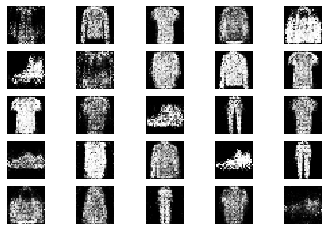

7601 [D loss: 0.616472, acc.: 67.19%] [G loss: 0.893231]
7602 [D loss: 0.658015, acc.: 56.25%] [G loss: 0.929347]
7603 [D loss: 0.663870, acc.: 56.25%] [G loss: 0.853897]
7604 [D loss: 0.657089, acc.: 62.50%] [G loss: 0.912236]
7605 [D loss: 0.691284, acc.: 57.81%] [G loss: 0.875235]
7606 [D loss: 0.673602, acc.: 54.69%] [G loss: 0.910496]
7607 [D loss: 0.630848, acc.: 65.62%] [G loss: 0.904452]
7608 [D loss: 0.639388, acc.: 59.38%] [G loss: 0.854721]
7609 [D loss: 0.609711, acc.: 65.62%] [G loss: 0.900551]
7610 [D loss: 0.664470, acc.: 60.94%] [G loss: 0.962024]
7611 [D loss: 0.650319, acc.: 62.50%] [G loss: 0.950482]
7612 [D loss: 0.694517, acc.: 51.56%] [G loss: 0.898336]
7613 [D loss: 0.689853, acc.: 60.94%] [G loss: 0.915945]
7614 [D loss: 0.682591, acc.: 57.81%] [G loss: 0.903099]
7615 [D loss: 0.612580, acc.: 64.06%] [G loss: 0.864095]
7616 [D loss: 0.687435, acc.: 54.69%] [G loss: 0.871747]
7617 [D loss: 0.768933, acc.: 48.44%] [G loss: 0.892201]
7618 [D loss: 0.633850, acc.: 6

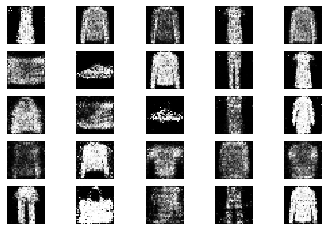

7801 [D loss: 0.631573, acc.: 65.62%] [G loss: 0.913228]
7802 [D loss: 0.625515, acc.: 64.06%] [G loss: 0.942974]
7803 [D loss: 0.631638, acc.: 60.94%] [G loss: 0.904701]
7804 [D loss: 0.570930, acc.: 75.00%] [G loss: 0.912669]
7805 [D loss: 0.581550, acc.: 67.19%] [G loss: 0.914146]
7806 [D loss: 0.580754, acc.: 68.75%] [G loss: 0.923980]
7807 [D loss: 0.640711, acc.: 56.25%] [G loss: 0.864619]
7808 [D loss: 0.650099, acc.: 62.50%] [G loss: 0.839047]
7809 [D loss: 0.620004, acc.: 65.62%] [G loss: 0.901986]
7810 [D loss: 0.645238, acc.: 65.62%] [G loss: 0.947604]
7811 [D loss: 0.662555, acc.: 65.62%] [G loss: 0.922984]
7812 [D loss: 0.598125, acc.: 73.44%] [G loss: 0.952809]
7813 [D loss: 0.641715, acc.: 62.50%] [G loss: 0.934437]
7814 [D loss: 0.692530, acc.: 54.69%] [G loss: 0.885477]
7815 [D loss: 0.694723, acc.: 51.56%] [G loss: 0.811015]
7816 [D loss: 0.647762, acc.: 60.94%] [G loss: 0.851824]
7817 [D loss: 0.633468, acc.: 60.94%] [G loss: 0.806161]
7818 [D loss: 0.625253, acc.: 6

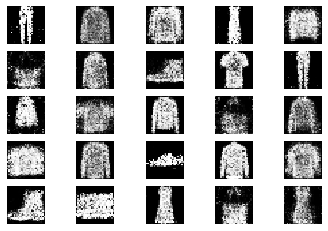

8001 [D loss: 0.627424, acc.: 68.75%] [G loss: 0.937549]
8002 [D loss: 0.716837, acc.: 45.31%] [G loss: 0.869642]
8003 [D loss: 0.628878, acc.: 64.06%] [G loss: 0.887409]
8004 [D loss: 0.690867, acc.: 56.25%] [G loss: 0.874137]
8005 [D loss: 0.659115, acc.: 56.25%] [G loss: 0.837323]
8006 [D loss: 0.668100, acc.: 60.94%] [G loss: 0.847702]
8007 [D loss: 0.617510, acc.: 65.62%] [G loss: 0.897781]
8008 [D loss: 0.621438, acc.: 62.50%] [G loss: 0.924141]
8009 [D loss: 0.674432, acc.: 57.81%] [G loss: 0.936472]
8010 [D loss: 0.659442, acc.: 53.12%] [G loss: 0.830408]
8011 [D loss: 0.664303, acc.: 54.69%] [G loss: 0.885247]
8012 [D loss: 0.644498, acc.: 59.38%] [G loss: 0.900523]
8013 [D loss: 0.666668, acc.: 59.38%] [G loss: 0.903655]
8014 [D loss: 0.631943, acc.: 70.31%] [G loss: 0.903606]
8015 [D loss: 0.631485, acc.: 68.75%] [G loss: 0.880463]
8016 [D loss: 0.673396, acc.: 54.69%] [G loss: 0.815609]
8017 [D loss: 0.661783, acc.: 57.81%] [G loss: 0.846736]
8018 [D loss: 0.672918, acc.: 5

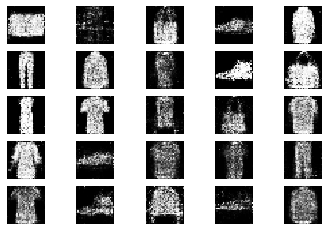

8201 [D loss: 0.619210, acc.: 65.62%] [G loss: 0.823067]
8202 [D loss: 0.661801, acc.: 60.94%] [G loss: 0.945787]
8203 [D loss: 0.600901, acc.: 70.31%] [G loss: 0.977601]
8204 [D loss: 0.672343, acc.: 51.56%] [G loss: 0.922639]
8205 [D loss: 0.670025, acc.: 56.25%] [G loss: 0.852369]
8206 [D loss: 0.636880, acc.: 60.94%] [G loss: 0.891258]
8207 [D loss: 0.627720, acc.: 62.50%] [G loss: 0.809640]
8208 [D loss: 0.680770, acc.: 56.25%] [G loss: 0.847587]
8209 [D loss: 0.644559, acc.: 64.06%] [G loss: 0.930126]
8210 [D loss: 0.692893, acc.: 56.25%] [G loss: 0.903079]
8211 [D loss: 0.678083, acc.: 60.94%] [G loss: 0.887721]
8212 [D loss: 0.657501, acc.: 62.50%] [G loss: 0.908848]
8213 [D loss: 0.739500, acc.: 50.00%] [G loss: 0.841257]
8214 [D loss: 0.655783, acc.: 62.50%] [G loss: 0.852146]
8215 [D loss: 0.702044, acc.: 51.56%] [G loss: 0.918586]
8216 [D loss: 0.683642, acc.: 57.81%] [G loss: 0.961702]
8217 [D loss: 0.659590, acc.: 62.50%] [G loss: 0.808902]
8218 [D loss: 0.600892, acc.: 7

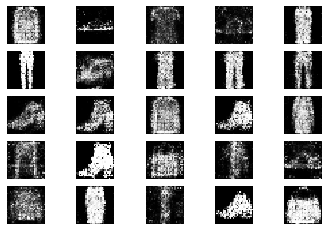

8401 [D loss: 0.624169, acc.: 71.88%] [G loss: 0.874482]
8402 [D loss: 0.648253, acc.: 65.62%] [G loss: 0.925431]
8403 [D loss: 0.613258, acc.: 67.19%] [G loss: 0.861170]
8404 [D loss: 0.666183, acc.: 54.69%] [G loss: 0.903465]
8405 [D loss: 0.659206, acc.: 60.94%] [G loss: 0.911555]
8406 [D loss: 0.676596, acc.: 53.12%] [G loss: 0.902433]
8407 [D loss: 0.595417, acc.: 71.88%] [G loss: 0.933067]
8408 [D loss: 0.598394, acc.: 67.19%] [G loss: 0.913127]
8409 [D loss: 0.676103, acc.: 54.69%] [G loss: 0.920227]
8410 [D loss: 0.605064, acc.: 65.62%] [G loss: 0.919460]
8411 [D loss: 0.621238, acc.: 67.19%] [G loss: 0.859064]
8412 [D loss: 0.602956, acc.: 67.19%] [G loss: 0.841555]
8413 [D loss: 0.578750, acc.: 68.75%] [G loss: 0.903186]
8414 [D loss: 0.604964, acc.: 62.50%] [G loss: 0.945533]
8415 [D loss: 0.564703, acc.: 76.56%] [G loss: 0.879464]
8416 [D loss: 0.628609, acc.: 60.94%] [G loss: 0.860616]
8417 [D loss: 0.621783, acc.: 67.19%] [G loss: 0.897924]
8418 [D loss: 0.622622, acc.: 6

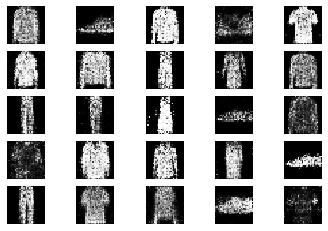

8601 [D loss: 0.622455, acc.: 64.06%] [G loss: 0.906714]
8602 [D loss: 0.587461, acc.: 71.88%] [G loss: 0.875559]
8603 [D loss: 0.615245, acc.: 62.50%] [G loss: 0.974878]
8604 [D loss: 0.596971, acc.: 73.44%] [G loss: 0.927089]
8605 [D loss: 0.694327, acc.: 56.25%] [G loss: 0.875467]
8606 [D loss: 0.708665, acc.: 65.62%] [G loss: 0.958699]
8607 [D loss: 0.707838, acc.: 54.69%] [G loss: 0.846929]
8608 [D loss: 0.614638, acc.: 67.19%] [G loss: 0.938606]
8609 [D loss: 0.678452, acc.: 51.56%] [G loss: 0.876532]
8610 [D loss: 0.650565, acc.: 67.19%] [G loss: 0.947055]
8611 [D loss: 0.591891, acc.: 68.75%] [G loss: 0.905182]
8612 [D loss: 0.639788, acc.: 65.62%] [G loss: 0.904892]
8613 [D loss: 0.655968, acc.: 57.81%] [G loss: 0.825549]
8614 [D loss: 0.612799, acc.: 62.50%] [G loss: 0.903218]
8615 [D loss: 0.703587, acc.: 62.50%] [G loss: 0.812820]
8616 [D loss: 0.671805, acc.: 57.81%] [G loss: 0.997762]
8617 [D loss: 0.593843, acc.: 70.31%] [G loss: 0.984103]
8618 [D loss: 0.634504, acc.: 7

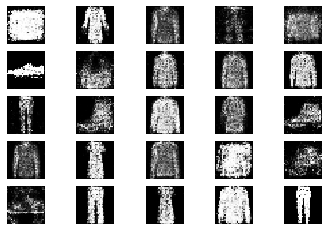

8801 [D loss: 0.633132, acc.: 67.19%] [G loss: 0.888174]
8802 [D loss: 0.665009, acc.: 56.25%] [G loss: 1.010464]
8803 [D loss: 0.664889, acc.: 62.50%] [G loss: 0.901820]
8804 [D loss: 0.707816, acc.: 51.56%] [G loss: 0.844661]
8805 [D loss: 0.621895, acc.: 62.50%] [G loss: 0.814727]
8806 [D loss: 0.693933, acc.: 50.00%] [G loss: 0.836628]
8807 [D loss: 0.657203, acc.: 60.94%] [G loss: 0.910382]
8808 [D loss: 0.614825, acc.: 64.06%] [G loss: 0.891924]
8809 [D loss: 0.622885, acc.: 65.62%] [G loss: 0.895123]
8810 [D loss: 0.666649, acc.: 64.06%] [G loss: 0.908653]
8811 [D loss: 0.636760, acc.: 65.62%] [G loss: 0.903905]
8812 [D loss: 0.585981, acc.: 68.75%] [G loss: 0.971545]
8813 [D loss: 0.676459, acc.: 50.00%] [G loss: 0.952969]
8814 [D loss: 0.640506, acc.: 60.94%] [G loss: 1.002602]
8815 [D loss: 0.661575, acc.: 60.94%] [G loss: 0.946254]
8816 [D loss: 0.609894, acc.: 64.06%] [G loss: 0.937127]
8817 [D loss: 0.625399, acc.: 62.50%] [G loss: 0.960797]
8818 [D loss: 0.663416, acc.: 6

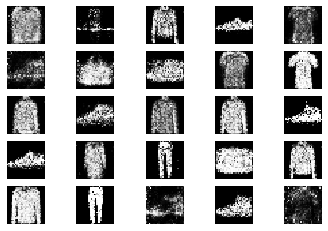

9001 [D loss: 0.637419, acc.: 68.75%] [G loss: 0.941624]
9002 [D loss: 0.633276, acc.: 53.12%] [G loss: 0.870167]
9003 [D loss: 0.668006, acc.: 60.94%] [G loss: 0.889360]
9004 [D loss: 0.657761, acc.: 64.06%] [G loss: 0.861198]
9005 [D loss: 0.643681, acc.: 60.94%] [G loss: 0.887595]
9006 [D loss: 0.713133, acc.: 54.69%] [G loss: 0.781300]
9007 [D loss: 0.680476, acc.: 53.12%] [G loss: 0.811627]
9008 [D loss: 0.716803, acc.: 54.69%] [G loss: 0.864478]
9009 [D loss: 0.681484, acc.: 57.81%] [G loss: 0.864409]
9010 [D loss: 0.663015, acc.: 57.81%] [G loss: 0.866739]
9011 [D loss: 0.664134, acc.: 67.19%] [G loss: 0.960649]
9012 [D loss: 0.723315, acc.: 54.69%] [G loss: 0.809902]
9013 [D loss: 0.617473, acc.: 68.75%] [G loss: 0.952633]
9014 [D loss: 0.613811, acc.: 59.38%] [G loss: 0.854045]
9015 [D loss: 0.638125, acc.: 67.19%] [G loss: 0.918531]
9016 [D loss: 0.646707, acc.: 60.94%] [G loss: 0.852251]
9017 [D loss: 0.643173, acc.: 60.94%] [G loss: 0.840081]
9018 [D loss: 0.643645, acc.: 6

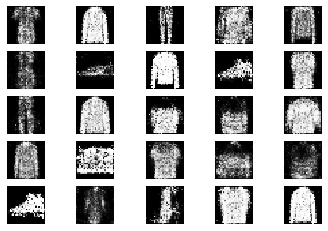

9201 [D loss: 0.648336, acc.: 65.62%] [G loss: 0.851289]
9202 [D loss: 0.669978, acc.: 62.50%] [G loss: 0.911334]
9203 [D loss: 0.639291, acc.: 57.81%] [G loss: 0.839007]
9204 [D loss: 0.683017, acc.: 57.81%] [G loss: 0.877908]
9205 [D loss: 0.658528, acc.: 62.50%] [G loss: 0.768740]
9206 [D loss: 0.693015, acc.: 57.81%] [G loss: 0.837776]
9207 [D loss: 0.668734, acc.: 56.25%] [G loss: 0.887685]
9208 [D loss: 0.675804, acc.: 62.50%] [G loss: 0.901223]
9209 [D loss: 0.721681, acc.: 46.88%] [G loss: 0.948753]
9210 [D loss: 0.643463, acc.: 67.19%] [G loss: 0.870403]
9211 [D loss: 0.703876, acc.: 48.44%] [G loss: 0.845813]
9212 [D loss: 0.697883, acc.: 56.25%] [G loss: 0.911871]
9213 [D loss: 0.675257, acc.: 51.56%] [G loss: 0.885407]
9214 [D loss: 0.635290, acc.: 59.38%] [G loss: 0.807153]
9215 [D loss: 0.611190, acc.: 71.88%] [G loss: 0.848087]
9216 [D loss: 0.622277, acc.: 67.19%] [G loss: 0.809437]
9217 [D loss: 0.669035, acc.: 64.06%] [G loss: 0.854079]
9218 [D loss: 0.634179, acc.: 6

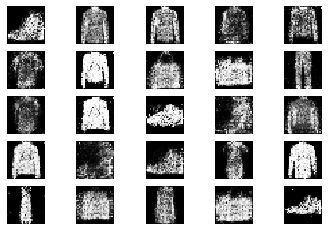

9401 [D loss: 0.649446, acc.: 62.50%] [G loss: 0.851627]
9402 [D loss: 0.676100, acc.: 53.12%] [G loss: 0.912247]
9403 [D loss: 0.639706, acc.: 64.06%] [G loss: 0.939860]
9404 [D loss: 0.633737, acc.: 67.19%] [G loss: 0.920616]
9405 [D loss: 0.710116, acc.: 56.25%] [G loss: 0.950152]
9406 [D loss: 0.575432, acc.: 76.56%] [G loss: 1.000198]
9407 [D loss: 0.748322, acc.: 45.31%] [G loss: 0.927873]
9408 [D loss: 0.656207, acc.: 64.06%] [G loss: 0.865048]
9409 [D loss: 0.694160, acc.: 51.56%] [G loss: 0.850691]
9410 [D loss: 0.651013, acc.: 65.62%] [G loss: 0.917684]
9411 [D loss: 0.626892, acc.: 67.19%] [G loss: 0.877951]
9412 [D loss: 0.612369, acc.: 70.31%] [G loss: 0.938479]
9413 [D loss: 0.682009, acc.: 54.69%] [G loss: 0.934763]
9414 [D loss: 0.733136, acc.: 48.44%] [G loss: 0.945582]
9415 [D loss: 0.601131, acc.: 70.31%] [G loss: 0.809865]
9416 [D loss: 0.723285, acc.: 50.00%] [G loss: 0.865955]
9417 [D loss: 0.643744, acc.: 65.62%] [G loss: 0.868750]
9418 [D loss: 0.688552, acc.: 5

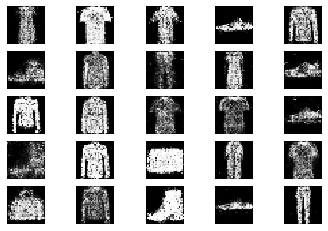

9601 [D loss: 0.704414, acc.: 43.75%] [G loss: 0.852645]
9602 [D loss: 0.647194, acc.: 53.12%] [G loss: 0.908931]
9603 [D loss: 0.643279, acc.: 62.50%] [G loss: 0.869291]
9604 [D loss: 0.656326, acc.: 62.50%] [G loss: 0.874462]
9605 [D loss: 0.623760, acc.: 70.31%] [G loss: 0.927916]
9606 [D loss: 0.677845, acc.: 54.69%] [G loss: 0.910828]
9607 [D loss: 0.711702, acc.: 48.44%] [G loss: 0.927484]
9608 [D loss: 0.708106, acc.: 53.12%] [G loss: 0.905974]
9609 [D loss: 0.676328, acc.: 56.25%] [G loss: 0.911732]
9610 [D loss: 0.698664, acc.: 57.81%] [G loss: 0.865357]
9611 [D loss: 0.570293, acc.: 70.31%] [G loss: 0.846065]
9612 [D loss: 0.595450, acc.: 67.19%] [G loss: 0.867420]
9613 [D loss: 0.668622, acc.: 67.19%] [G loss: 0.919324]
9614 [D loss: 0.682148, acc.: 67.19%] [G loss: 1.008718]
9615 [D loss: 0.664435, acc.: 59.38%] [G loss: 0.900631]
9616 [D loss: 0.639942, acc.: 59.38%] [G loss: 0.870219]
9617 [D loss: 0.647919, acc.: 60.94%] [G loss: 0.899186]
9618 [D loss: 0.603786, acc.: 6

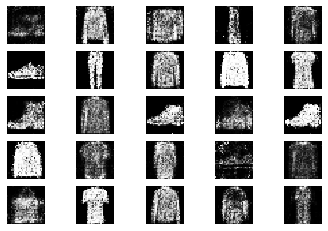

9801 [D loss: 0.616649, acc.: 68.75%] [G loss: 0.801302]
9802 [D loss: 0.703560, acc.: 53.12%] [G loss: 0.963485]
9803 [D loss: 0.671087, acc.: 51.56%] [G loss: 0.801183]
9804 [D loss: 0.679224, acc.: 60.94%] [G loss: 0.866296]
9805 [D loss: 0.724843, acc.: 53.12%] [G loss: 0.845847]
9806 [D loss: 0.668566, acc.: 54.69%] [G loss: 0.899035]
9807 [D loss: 0.673975, acc.: 54.69%] [G loss: 0.830218]
9808 [D loss: 0.684150, acc.: 56.25%] [G loss: 0.885304]
9809 [D loss: 0.709323, acc.: 46.88%] [G loss: 0.826056]
9810 [D loss: 0.693986, acc.: 60.94%] [G loss: 0.828903]
9811 [D loss: 0.597837, acc.: 65.62%] [G loss: 0.845079]
9812 [D loss: 0.657461, acc.: 60.94%] [G loss: 0.896713]
9813 [D loss: 0.666900, acc.: 64.06%] [G loss: 0.937642]
9814 [D loss: 0.646472, acc.: 60.94%] [G loss: 0.905127]
9815 [D loss: 0.593897, acc.: 65.62%] [G loss: 0.878384]
9816 [D loss: 0.620947, acc.: 68.75%] [G loss: 0.820341]
9817 [D loss: 0.628271, acc.: 67.19%] [G loss: 0.976049]
9818 [D loss: 0.615863, acc.: 6

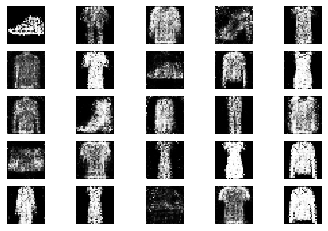

10001 [D loss: 0.700698, acc.: 56.25%] [G loss: 0.874239]
10002 [D loss: 0.678270, acc.: 59.38%] [G loss: 0.892046]
10003 [D loss: 0.666208, acc.: 57.81%] [G loss: 0.975592]
10004 [D loss: 0.680860, acc.: 56.25%] [G loss: 0.944545]
10005 [D loss: 0.625960, acc.: 60.94%] [G loss: 0.889428]
10006 [D loss: 0.646189, acc.: 67.19%] [G loss: 0.889861]
10007 [D loss: 0.697425, acc.: 50.00%] [G loss: 0.888544]
10008 [D loss: 0.615003, acc.: 68.75%] [G loss: 0.948567]
10009 [D loss: 0.648762, acc.: 56.25%] [G loss: 0.770774]
10010 [D loss: 0.661263, acc.: 59.38%] [G loss: 0.831402]
10011 [D loss: 0.609596, acc.: 68.75%] [G loss: 0.868125]
10012 [D loss: 0.701175, acc.: 54.69%] [G loss: 0.873902]
10013 [D loss: 0.648574, acc.: 65.62%] [G loss: 0.901564]
10014 [D loss: 0.676009, acc.: 59.38%] [G loss: 0.842249]
10015 [D loss: 0.562439, acc.: 79.69%] [G loss: 0.904418]
10016 [D loss: 0.630800, acc.: 59.38%] [G loss: 0.860957]
10017 [D loss: 0.662091, acc.: 65.62%] [G loss: 0.840470]
10018 [D loss:

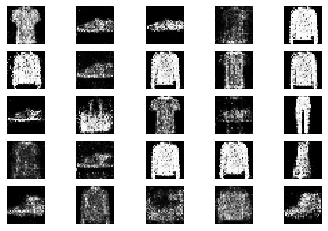

10201 [D loss: 0.613116, acc.: 64.06%] [G loss: 0.886601]
10202 [D loss: 0.619603, acc.: 70.31%] [G loss: 0.827363]
10203 [D loss: 0.598618, acc.: 65.62%] [G loss: 0.864453]
10204 [D loss: 0.648932, acc.: 62.50%] [G loss: 0.811890]
10205 [D loss: 0.672740, acc.: 65.62%] [G loss: 0.805598]
10206 [D loss: 0.636779, acc.: 67.19%] [G loss: 0.911914]
10207 [D loss: 0.674028, acc.: 57.81%] [G loss: 0.915609]
10208 [D loss: 0.637504, acc.: 68.75%] [G loss: 0.985973]
10209 [D loss: 0.580816, acc.: 70.31%] [G loss: 0.936610]
10210 [D loss: 0.734000, acc.: 46.88%] [G loss: 0.875502]
10211 [D loss: 0.608032, acc.: 67.19%] [G loss: 0.873547]
10212 [D loss: 0.601621, acc.: 67.19%] [G loss: 0.847116]
10213 [D loss: 0.672117, acc.: 54.69%] [G loss: 0.845902]
10214 [D loss: 0.685040, acc.: 53.12%] [G loss: 0.997752]
10215 [D loss: 0.687627, acc.: 62.50%] [G loss: 0.967921]
10216 [D loss: 0.658994, acc.: 60.94%] [G loss: 0.999793]
10217 [D loss: 0.607477, acc.: 68.75%] [G loss: 0.901049]
10218 [D loss:

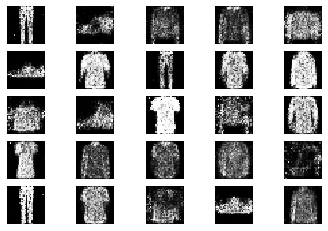

10401 [D loss: 0.608395, acc.: 68.75%] [G loss: 0.897484]
10402 [D loss: 0.659132, acc.: 67.19%] [G loss: 0.904227]
10403 [D loss: 0.649203, acc.: 62.50%] [G loss: 0.832633]
10404 [D loss: 0.709204, acc.: 53.12%] [G loss: 0.891407]
10405 [D loss: 0.668434, acc.: 57.81%] [G loss: 0.841702]
10406 [D loss: 0.639020, acc.: 65.62%] [G loss: 1.004742]
10407 [D loss: 0.669783, acc.: 60.94%] [G loss: 0.934106]
10408 [D loss: 0.665034, acc.: 64.06%] [G loss: 0.882716]
10409 [D loss: 0.608213, acc.: 68.75%] [G loss: 0.885894]
10410 [D loss: 0.691747, acc.: 59.38%] [G loss: 0.896543]
10411 [D loss: 0.675667, acc.: 50.00%] [G loss: 0.844621]
10412 [D loss: 0.681554, acc.: 56.25%] [G loss: 0.832926]
10413 [D loss: 0.658961, acc.: 56.25%] [G loss: 0.843400]
10414 [D loss: 0.606571, acc.: 73.44%] [G loss: 0.850472]
10415 [D loss: 0.656026, acc.: 59.38%] [G loss: 0.882812]
10416 [D loss: 0.660312, acc.: 65.62%] [G loss: 0.870503]
10417 [D loss: 0.596415, acc.: 71.88%] [G loss: 0.845996]
10418 [D loss:

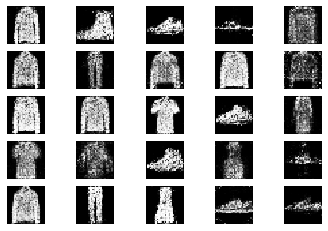

10601 [D loss: 0.639957, acc.: 64.06%] [G loss: 0.901728]
10602 [D loss: 0.685460, acc.: 59.38%] [G loss: 0.955893]
10603 [D loss: 0.658434, acc.: 56.25%] [G loss: 0.956138]
10604 [D loss: 0.650737, acc.: 67.19%] [G loss: 0.948922]
10605 [D loss: 0.701835, acc.: 59.38%] [G loss: 0.911346]
10606 [D loss: 0.614639, acc.: 67.19%] [G loss: 0.868342]
10607 [D loss: 0.708365, acc.: 53.12%] [G loss: 0.926425]
10608 [D loss: 0.660047, acc.: 64.06%] [G loss: 0.837191]
10609 [D loss: 0.647291, acc.: 62.50%] [G loss: 0.884981]
10610 [D loss: 0.614791, acc.: 67.19%] [G loss: 0.841991]
10611 [D loss: 0.642441, acc.: 62.50%] [G loss: 0.908227]
10612 [D loss: 0.662698, acc.: 62.50%] [G loss: 0.864127]
10613 [D loss: 0.641164, acc.: 59.38%] [G loss: 0.926706]
10614 [D loss: 0.667710, acc.: 56.25%] [G loss: 0.881101]
10615 [D loss: 0.665975, acc.: 53.12%] [G loss: 0.902519]
10616 [D loss: 0.642231, acc.: 64.06%] [G loss: 0.945340]
10617 [D loss: 0.664135, acc.: 64.06%] [G loss: 0.947921]
10618 [D loss:

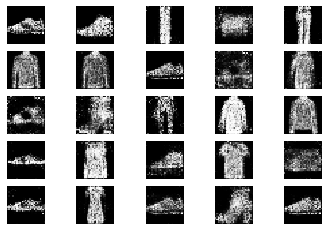

10801 [D loss: 0.646515, acc.: 60.94%] [G loss: 0.816902]
10802 [D loss: 0.629839, acc.: 67.19%] [G loss: 0.916578]
10803 [D loss: 0.693329, acc.: 53.12%] [G loss: 0.853101]
10804 [D loss: 0.693743, acc.: 51.56%] [G loss: 0.871035]
10805 [D loss: 0.668945, acc.: 60.94%] [G loss: 0.919260]
10806 [D loss: 0.659261, acc.: 60.94%] [G loss: 0.958944]
10807 [D loss: 0.708852, acc.: 53.12%] [G loss: 0.808554]
10808 [D loss: 0.729466, acc.: 50.00%] [G loss: 0.887973]
10809 [D loss: 0.659044, acc.: 59.38%] [G loss: 0.925636]
10810 [D loss: 0.625722, acc.: 65.62%] [G loss: 0.888834]
10811 [D loss: 0.631231, acc.: 65.62%] [G loss: 0.894855]
10812 [D loss: 0.594342, acc.: 70.31%] [G loss: 0.908982]
10813 [D loss: 0.601824, acc.: 68.75%] [G loss: 0.893255]
10814 [D loss: 0.688206, acc.: 62.50%] [G loss: 0.922238]
10815 [D loss: 0.679254, acc.: 57.81%] [G loss: 0.972812]
10816 [D loss: 0.701260, acc.: 46.88%] [G loss: 0.904875]
10817 [D loss: 0.598609, acc.: 67.19%] [G loss: 0.946692]
10818 [D loss:

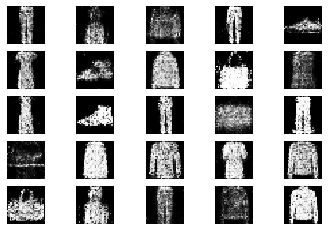

11001 [D loss: 0.644844, acc.: 67.19%] [G loss: 0.861441]
11002 [D loss: 0.655557, acc.: 65.62%] [G loss: 0.901964]
11003 [D loss: 0.678098, acc.: 65.62%] [G loss: 0.858853]
11004 [D loss: 0.648624, acc.: 65.62%] [G loss: 0.802138]
11005 [D loss: 0.564155, acc.: 76.56%] [G loss: 0.932962]
11006 [D loss: 0.634051, acc.: 65.62%] [G loss: 0.867618]
11007 [D loss: 0.696837, acc.: 56.25%] [G loss: 0.890878]
11008 [D loss: 0.670942, acc.: 65.62%] [G loss: 0.913925]
11009 [D loss: 0.630737, acc.: 64.06%] [G loss: 0.870697]
11010 [D loss: 0.711629, acc.: 43.75%] [G loss: 0.925990]
11011 [D loss: 0.706370, acc.: 56.25%] [G loss: 0.902110]
11012 [D loss: 0.708364, acc.: 50.00%] [G loss: 0.863968]
11013 [D loss: 0.673109, acc.: 57.81%] [G loss: 0.810072]
11014 [D loss: 0.706008, acc.: 53.12%] [G loss: 0.803002]
11015 [D loss: 0.619481, acc.: 65.62%] [G loss: 0.958295]
11016 [D loss: 0.695718, acc.: 54.69%] [G loss: 0.877967]
11017 [D loss: 0.714955, acc.: 51.56%] [G loss: 0.865832]
11018 [D loss:

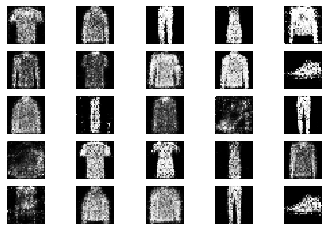

11201 [D loss: 0.700772, acc.: 57.81%] [G loss: 0.870223]
11202 [D loss: 0.638104, acc.: 65.62%] [G loss: 0.866419]
11203 [D loss: 0.662052, acc.: 62.50%] [G loss: 0.863011]
11204 [D loss: 0.699636, acc.: 57.81%] [G loss: 0.936133]
11205 [D loss: 0.653407, acc.: 70.31%] [G loss: 0.908480]
11206 [D loss: 0.686652, acc.: 53.12%] [G loss: 0.865450]
11207 [D loss: 0.690120, acc.: 62.50%] [G loss: 0.872741]
11208 [D loss: 0.696902, acc.: 56.25%] [G loss: 0.890822]
11209 [D loss: 0.677347, acc.: 57.81%] [G loss: 0.883082]
11210 [D loss: 0.672719, acc.: 57.81%] [G loss: 0.954109]
11211 [D loss: 0.683928, acc.: 50.00%] [G loss: 0.864354]
11212 [D loss: 0.623854, acc.: 62.50%] [G loss: 0.850372]
11213 [D loss: 0.635357, acc.: 59.38%] [G loss: 0.903000]
11214 [D loss: 0.606418, acc.: 70.31%] [G loss: 0.851037]
11215 [D loss: 0.659196, acc.: 56.25%] [G loss: 0.841586]
11216 [D loss: 0.714069, acc.: 45.31%] [G loss: 0.923826]
11217 [D loss: 0.747162, acc.: 48.44%] [G loss: 0.864841]
11218 [D loss:

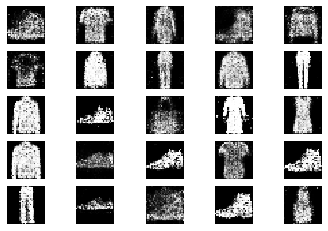

11401 [D loss: 0.672067, acc.: 53.12%] [G loss: 0.803165]
11402 [D loss: 0.704854, acc.: 51.56%] [G loss: 0.849076]
11403 [D loss: 0.700038, acc.: 54.69%] [G loss: 0.940041]
11404 [D loss: 0.658783, acc.: 60.94%] [G loss: 0.886799]
11405 [D loss: 0.694865, acc.: 51.56%] [G loss: 0.790825]
11406 [D loss: 0.693191, acc.: 60.94%] [G loss: 0.811621]
11407 [D loss: 0.649640, acc.: 59.38%] [G loss: 0.906395]
11408 [D loss: 0.675774, acc.: 57.81%] [G loss: 0.883304]
11409 [D loss: 0.654833, acc.: 57.81%] [G loss: 0.884632]
11410 [D loss: 0.626454, acc.: 62.50%] [G loss: 0.844995]
11411 [D loss: 0.665586, acc.: 59.38%] [G loss: 0.862608]
11412 [D loss: 0.680649, acc.: 53.12%] [G loss: 0.897315]
11413 [D loss: 0.683217, acc.: 65.62%] [G loss: 0.866467]
11414 [D loss: 0.672948, acc.: 60.94%] [G loss: 0.904742]
11415 [D loss: 0.646876, acc.: 65.62%] [G loss: 0.905886]
11416 [D loss: 0.679217, acc.: 60.94%] [G loss: 1.057621]
11417 [D loss: 0.736184, acc.: 48.44%] [G loss: 0.875555]
11418 [D loss:

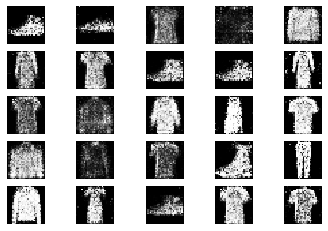

11601 [D loss: 0.618131, acc.: 67.19%] [G loss: 0.888032]
11602 [D loss: 0.656383, acc.: 64.06%] [G loss: 0.829095]
11603 [D loss: 0.614984, acc.: 70.31%] [G loss: 0.938681]
11604 [D loss: 0.666739, acc.: 64.06%] [G loss: 0.910386]
11605 [D loss: 0.669670, acc.: 60.94%] [G loss: 0.847470]
11606 [D loss: 0.596104, acc.: 67.19%] [G loss: 0.898287]
11607 [D loss: 0.640010, acc.: 59.38%] [G loss: 0.911347]
11608 [D loss: 0.622349, acc.: 70.31%] [G loss: 0.929311]
11609 [D loss: 0.631887, acc.: 59.38%] [G loss: 0.916938]
11610 [D loss: 0.637193, acc.: 60.94%] [G loss: 0.950608]
11611 [D loss: 0.713922, acc.: 50.00%] [G loss: 0.927038]
11612 [D loss: 0.652261, acc.: 62.50%] [G loss: 0.808419]
11613 [D loss: 0.688210, acc.: 56.25%] [G loss: 0.826450]
11614 [D loss: 0.686993, acc.: 60.94%] [G loss: 0.808059]
11615 [D loss: 0.622528, acc.: 62.50%] [G loss: 0.954719]
11616 [D loss: 0.663269, acc.: 57.81%] [G loss: 0.988852]
11617 [D loss: 0.626587, acc.: 64.06%] [G loss: 0.928924]
11618 [D loss:

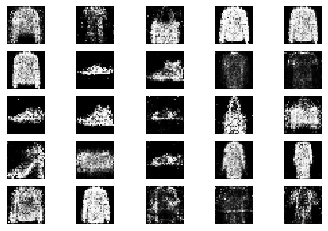

11801 [D loss: 0.624821, acc.: 64.06%] [G loss: 0.846318]
11802 [D loss: 0.713434, acc.: 59.38%] [G loss: 0.827654]
11803 [D loss: 0.623280, acc.: 67.19%] [G loss: 0.902096]
11804 [D loss: 0.685810, acc.: 51.56%] [G loss: 0.940106]
11805 [D loss: 0.737820, acc.: 53.12%] [G loss: 0.867858]
11806 [D loss: 0.637553, acc.: 65.62%] [G loss: 0.953774]
11807 [D loss: 0.653253, acc.: 62.50%] [G loss: 1.003992]
11808 [D loss: 0.692039, acc.: 59.38%] [G loss: 0.890920]
11809 [D loss: 0.639590, acc.: 64.06%] [G loss: 0.933182]
11810 [D loss: 0.653729, acc.: 59.38%] [G loss: 0.886251]
11811 [D loss: 0.618286, acc.: 67.19%] [G loss: 0.891901]
11812 [D loss: 0.650689, acc.: 64.06%] [G loss: 0.813316]
11813 [D loss: 0.646597, acc.: 65.62%] [G loss: 0.918911]
11814 [D loss: 0.712290, acc.: 53.12%] [G loss: 0.899438]
11815 [D loss: 0.627202, acc.: 57.81%] [G loss: 0.846810]
11816 [D loss: 0.679016, acc.: 62.50%] [G loss: 0.840969]
11817 [D loss: 0.669734, acc.: 64.06%] [G loss: 0.844175]
11818 [D loss:

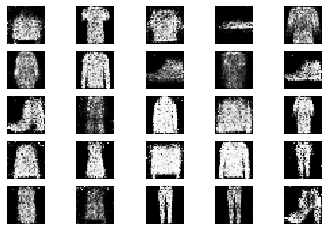

12001 [D loss: 0.728439, acc.: 51.56%] [G loss: 0.839447]
12002 [D loss: 0.670430, acc.: 62.50%] [G loss: 0.905423]
12003 [D loss: 0.677609, acc.: 53.12%] [G loss: 0.851136]
12004 [D loss: 0.670426, acc.: 57.81%] [G loss: 0.843100]
12005 [D loss: 0.608074, acc.: 73.44%] [G loss: 0.863705]
12006 [D loss: 0.624423, acc.: 64.06%] [G loss: 0.882391]
12007 [D loss: 0.643810, acc.: 62.50%] [G loss: 0.786336]
12008 [D loss: 0.614378, acc.: 68.75%] [G loss: 0.818690]
12009 [D loss: 0.600985, acc.: 68.75%] [G loss: 0.900479]
12010 [D loss: 0.683140, acc.: 56.25%] [G loss: 0.853501]
12011 [D loss: 0.655681, acc.: 59.38%] [G loss: 0.841718]
12012 [D loss: 0.612336, acc.: 67.19%] [G loss: 0.881680]
12013 [D loss: 0.715181, acc.: 46.88%] [G loss: 0.826781]
12014 [D loss: 0.680258, acc.: 57.81%] [G loss: 0.876025]
12015 [D loss: 0.603938, acc.: 73.44%] [G loss: 0.831220]
12016 [D loss: 0.757698, acc.: 48.44%] [G loss: 0.881083]
12017 [D loss: 0.635315, acc.: 59.38%] [G loss: 0.796771]
12018 [D loss:

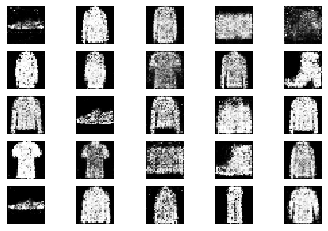

12201 [D loss: 0.668397, acc.: 65.62%] [G loss: 0.848296]
12202 [D loss: 0.708444, acc.: 53.12%] [G loss: 0.948830]
12203 [D loss: 0.598162, acc.: 70.31%] [G loss: 0.890600]
12204 [D loss: 0.670325, acc.: 62.50%] [G loss: 0.902398]
12205 [D loss: 0.667110, acc.: 56.25%] [G loss: 0.913125]
12206 [D loss: 0.671814, acc.: 59.38%] [G loss: 0.824024]
12207 [D loss: 0.653507, acc.: 59.38%] [G loss: 0.930742]
12208 [D loss: 0.659224, acc.: 62.50%] [G loss: 0.901035]
12209 [D loss: 0.673822, acc.: 57.81%] [G loss: 0.844360]
12210 [D loss: 0.654134, acc.: 56.25%] [G loss: 0.918812]
12211 [D loss: 0.652124, acc.: 57.81%] [G loss: 0.794491]
12212 [D loss: 0.603876, acc.: 73.44%] [G loss: 0.852068]
12213 [D loss: 0.684394, acc.: 68.75%] [G loss: 0.857927]
12214 [D loss: 0.681174, acc.: 64.06%] [G loss: 0.812293]
12215 [D loss: 0.747085, acc.: 53.12%] [G loss: 0.920802]
12216 [D loss: 0.704378, acc.: 51.56%] [G loss: 0.941345]
12217 [D loss: 0.637214, acc.: 62.50%] [G loss: 0.852731]
12218 [D loss:

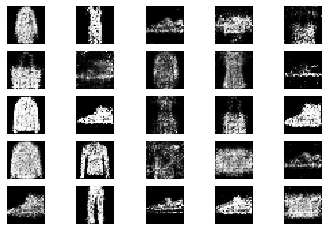

12401 [D loss: 0.697235, acc.: 54.69%] [G loss: 0.871153]
12402 [D loss: 0.657150, acc.: 59.38%] [G loss: 0.846286]
12403 [D loss: 0.680594, acc.: 62.50%] [G loss: 0.948037]
12404 [D loss: 0.641039, acc.: 68.75%] [G loss: 0.814933]
12405 [D loss: 0.671734, acc.: 51.56%] [G loss: 0.925961]
12406 [D loss: 0.724808, acc.: 50.00%] [G loss: 0.794384]
12407 [D loss: 0.673286, acc.: 57.81%] [G loss: 0.881698]
12408 [D loss: 0.648753, acc.: 59.38%] [G loss: 0.977625]
12409 [D loss: 0.675981, acc.: 60.94%] [G loss: 0.858444]
12410 [D loss: 0.634477, acc.: 56.25%] [G loss: 0.824278]
12411 [D loss: 0.669522, acc.: 64.06%] [G loss: 0.807429]
12412 [D loss: 0.695801, acc.: 59.38%] [G loss: 0.822838]
12413 [D loss: 0.633550, acc.: 62.50%] [G loss: 0.879140]
12414 [D loss: 0.676670, acc.: 56.25%] [G loss: 0.941878]
12415 [D loss: 0.693375, acc.: 60.94%] [G loss: 0.885621]
12416 [D loss: 0.631409, acc.: 65.62%] [G loss: 0.914557]
12417 [D loss: 0.659328, acc.: 64.06%] [G loss: 0.892800]
12418 [D loss:

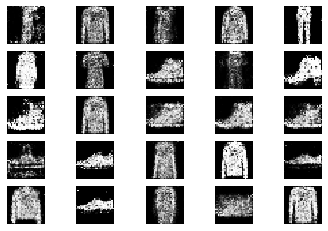

12601 [D loss: 0.621338, acc.: 71.88%] [G loss: 0.918020]
12602 [D loss: 0.643121, acc.: 60.94%] [G loss: 0.858286]
12603 [D loss: 0.737556, acc.: 46.88%] [G loss: 0.869442]
12604 [D loss: 0.645746, acc.: 70.31%] [G loss: 0.845656]
12605 [D loss: 0.616098, acc.: 71.88%] [G loss: 0.880240]
12606 [D loss: 0.675575, acc.: 60.94%] [G loss: 0.787575]
12607 [D loss: 0.600477, acc.: 68.75%] [G loss: 0.819825]
12608 [D loss: 0.607577, acc.: 68.75%] [G loss: 0.847979]
12609 [D loss: 0.651771, acc.: 60.94%] [G loss: 0.852846]
12610 [D loss: 0.635429, acc.: 62.50%] [G loss: 0.830011]
12611 [D loss: 0.725973, acc.: 57.81%] [G loss: 0.958425]
12612 [D loss: 0.597964, acc.: 71.88%] [G loss: 0.894478]
12613 [D loss: 0.599672, acc.: 67.19%] [G loss: 0.901939]
12614 [D loss: 0.676838, acc.: 59.38%] [G loss: 0.918296]
12615 [D loss: 0.646994, acc.: 59.38%] [G loss: 0.941307]
12616 [D loss: 0.697312, acc.: 48.44%] [G loss: 0.896352]
12617 [D loss: 0.656493, acc.: 64.06%] [G loss: 0.883796]
12618 [D loss:

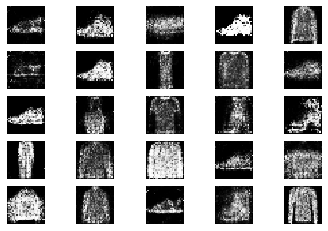

12801 [D loss: 0.668870, acc.: 62.50%] [G loss: 0.912579]
12802 [D loss: 0.627217, acc.: 67.19%] [G loss: 0.915432]
12803 [D loss: 0.596092, acc.: 73.44%] [G loss: 0.836101]
12804 [D loss: 0.648479, acc.: 64.06%] [G loss: 0.896998]
12805 [D loss: 0.677531, acc.: 53.12%] [G loss: 0.934548]
12806 [D loss: 0.662350, acc.: 62.50%] [G loss: 0.852715]
12807 [D loss: 0.644295, acc.: 60.94%] [G loss: 0.899383]
12808 [D loss: 0.621933, acc.: 67.19%] [G loss: 0.891249]
12809 [D loss: 0.701457, acc.: 56.25%] [G loss: 0.895021]
12810 [D loss: 0.658838, acc.: 54.69%] [G loss: 0.844996]
12811 [D loss: 0.623432, acc.: 67.19%] [G loss: 0.951935]
12812 [D loss: 0.613923, acc.: 71.88%] [G loss: 0.995290]
12813 [D loss: 0.595567, acc.: 70.31%] [G loss: 0.962233]
12814 [D loss: 0.686619, acc.: 53.12%] [G loss: 0.954753]
12815 [D loss: 0.706779, acc.: 53.12%] [G loss: 0.923160]
12816 [D loss: 0.634678, acc.: 62.50%] [G loss: 0.838143]
12817 [D loss: 0.639300, acc.: 59.38%] [G loss: 0.923212]
12818 [D loss:

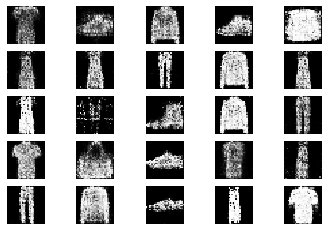

13001 [D loss: 0.680342, acc.: 57.81%] [G loss: 0.875643]
13002 [D loss: 0.707750, acc.: 54.69%] [G loss: 0.881463]
13003 [D loss: 0.716166, acc.: 54.69%] [G loss: 0.926372]
13004 [D loss: 0.704991, acc.: 48.44%] [G loss: 0.828925]
13005 [D loss: 0.598479, acc.: 67.19%] [G loss: 0.883870]
13006 [D loss: 0.698838, acc.: 54.69%] [G loss: 0.844057]
13007 [D loss: 0.643541, acc.: 60.94%] [G loss: 0.871780]
13008 [D loss: 0.618808, acc.: 65.62%] [G loss: 0.899694]
13009 [D loss: 0.698022, acc.: 53.12%] [G loss: 0.964100]
13010 [D loss: 0.627716, acc.: 59.38%] [G loss: 0.967827]
13011 [D loss: 0.608463, acc.: 64.06%] [G loss: 0.906446]
13012 [D loss: 0.662836, acc.: 54.69%] [G loss: 0.893001]
13013 [D loss: 0.637453, acc.: 64.06%] [G loss: 1.006373]
13014 [D loss: 0.689101, acc.: 57.81%] [G loss: 0.905399]
13015 [D loss: 0.644368, acc.: 62.50%] [G loss: 0.960079]
13016 [D loss: 0.645914, acc.: 64.06%] [G loss: 0.891285]
13017 [D loss: 0.644121, acc.: 60.94%] [G loss: 0.870366]
13018 [D loss:

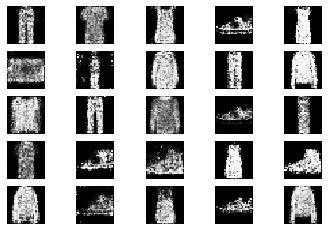

13201 [D loss: 0.649637, acc.: 60.94%] [G loss: 0.882970]
13202 [D loss: 0.664239, acc.: 67.19%] [G loss: 0.784457]
13203 [D loss: 0.689613, acc.: 60.94%] [G loss: 0.857596]
13204 [D loss: 0.708453, acc.: 48.44%] [G loss: 0.757480]
13205 [D loss: 0.702996, acc.: 56.25%] [G loss: 0.811302]
13206 [D loss: 0.683668, acc.: 62.50%] [G loss: 0.930436]
13207 [D loss: 0.699651, acc.: 62.50%] [G loss: 0.956879]
13208 [D loss: 0.674638, acc.: 64.06%] [G loss: 0.972031]
13209 [D loss: 0.713745, acc.: 56.25%] [G loss: 0.834803]
13210 [D loss: 0.633078, acc.: 62.50%] [G loss: 0.793292]
13211 [D loss: 0.649293, acc.: 60.94%] [G loss: 0.823552]
13212 [D loss: 0.673066, acc.: 57.81%] [G loss: 0.907127]
13213 [D loss: 0.693463, acc.: 51.56%] [G loss: 0.829348]
13214 [D loss: 0.715398, acc.: 43.75%] [G loss: 0.793810]
13215 [D loss: 0.675672, acc.: 57.81%] [G loss: 0.833119]
13216 [D loss: 0.673671, acc.: 56.25%] [G loss: 0.879671]
13217 [D loss: 0.686881, acc.: 56.25%] [G loss: 0.866039]
13218 [D loss:

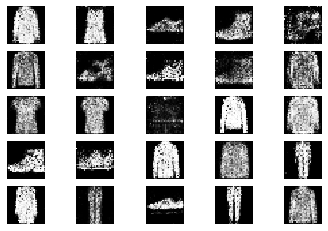

13401 [D loss: 0.665978, acc.: 59.38%] [G loss: 0.865111]
13402 [D loss: 0.698347, acc.: 51.56%] [G loss: 0.869131]
13403 [D loss: 0.684932, acc.: 51.56%] [G loss: 0.887692]
13404 [D loss: 0.640192, acc.: 60.94%] [G loss: 0.911046]
13405 [D loss: 0.649262, acc.: 60.94%] [G loss: 0.838369]
13406 [D loss: 0.755878, acc.: 43.75%] [G loss: 0.879920]
13407 [D loss: 0.668098, acc.: 57.81%] [G loss: 0.866939]
13408 [D loss: 0.668919, acc.: 64.06%] [G loss: 0.945825]
13409 [D loss: 0.653747, acc.: 57.81%] [G loss: 0.830701]
13410 [D loss: 0.657193, acc.: 57.81%] [G loss: 0.809789]
13411 [D loss: 0.640034, acc.: 60.94%] [G loss: 0.865178]
13412 [D loss: 0.637920, acc.: 64.06%] [G loss: 0.931167]
13413 [D loss: 0.722151, acc.: 53.12%] [G loss: 0.897574]
13414 [D loss: 0.611982, acc.: 71.88%] [G loss: 0.852714]
13415 [D loss: 0.591695, acc.: 76.56%] [G loss: 0.930432]
13416 [D loss: 0.710974, acc.: 56.25%] [G loss: 0.922629]
13417 [D loss: 0.707850, acc.: 51.56%] [G loss: 0.957948]
13418 [D loss:

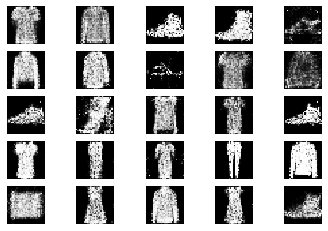

13601 [D loss: 0.637795, acc.: 64.06%] [G loss: 0.906532]
13602 [D loss: 0.617809, acc.: 62.50%] [G loss: 0.973257]
13603 [D loss: 0.705675, acc.: 51.56%] [G loss: 0.918596]
13604 [D loss: 0.629422, acc.: 68.75%] [G loss: 0.910168]
13605 [D loss: 0.707354, acc.: 60.94%] [G loss: 0.899341]
13606 [D loss: 0.685461, acc.: 56.25%] [G loss: 0.937880]
13607 [D loss: 0.657179, acc.: 65.62%] [G loss: 0.870088]
13608 [D loss: 0.655647, acc.: 64.06%] [G loss: 0.933262]
13609 [D loss: 0.648532, acc.: 60.94%] [G loss: 0.835831]
13610 [D loss: 0.633965, acc.: 64.06%] [G loss: 0.907331]
13611 [D loss: 0.598087, acc.: 68.75%] [G loss: 0.874120]
13612 [D loss: 0.575261, acc.: 70.31%] [G loss: 1.001562]
13613 [D loss: 0.729765, acc.: 54.69%] [G loss: 0.946016]
13614 [D loss: 0.573423, acc.: 73.44%] [G loss: 0.885263]
13615 [D loss: 0.594562, acc.: 65.62%] [G loss: 0.857888]
13616 [D loss: 0.592736, acc.: 70.31%] [G loss: 0.878579]
13617 [D loss: 0.646905, acc.: 59.38%] [G loss: 0.972498]
13618 [D loss:

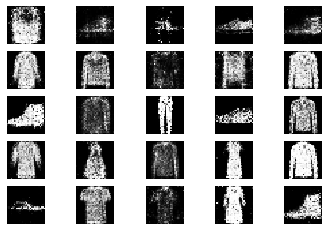

13801 [D loss: 0.741586, acc.: 48.44%] [G loss: 0.918814]
13802 [D loss: 0.642150, acc.: 62.50%] [G loss: 0.924804]
13803 [D loss: 0.650534, acc.: 67.19%] [G loss: 0.926099]
13804 [D loss: 0.660500, acc.: 59.38%] [G loss: 0.802871]
13805 [D loss: 0.694991, acc.: 59.38%] [G loss: 0.939624]
13806 [D loss: 0.658286, acc.: 62.50%] [G loss: 0.878271]
13807 [D loss: 0.682252, acc.: 57.81%] [G loss: 0.804702]
13808 [D loss: 0.683481, acc.: 62.50%] [G loss: 0.836117]
13809 [D loss: 0.707489, acc.: 53.12%] [G loss: 0.829105]
13810 [D loss: 0.631935, acc.: 64.06%] [G loss: 0.877266]
13811 [D loss: 0.681035, acc.: 54.69%] [G loss: 0.926251]
13812 [D loss: 0.627959, acc.: 73.44%] [G loss: 0.931477]
13813 [D loss: 0.659792, acc.: 65.62%] [G loss: 0.847071]
13814 [D loss: 0.632976, acc.: 64.06%] [G loss: 0.940392]
13815 [D loss: 0.666542, acc.: 56.25%] [G loss: 0.831144]
13816 [D loss: 0.595818, acc.: 70.31%] [G loss: 0.871855]
13817 [D loss: 0.647965, acc.: 59.38%] [G loss: 0.902596]
13818 [D loss:

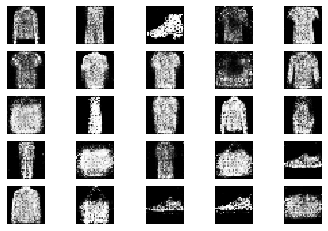

14001 [D loss: 0.620070, acc.: 64.06%] [G loss: 0.886952]
14002 [D loss: 0.640062, acc.: 59.38%] [G loss: 0.879664]
14003 [D loss: 0.673680, acc.: 54.69%] [G loss: 0.909573]
14004 [D loss: 0.608591, acc.: 70.31%] [G loss: 0.916416]
14005 [D loss: 0.632998, acc.: 62.50%] [G loss: 0.910646]
14006 [D loss: 0.658662, acc.: 57.81%] [G loss: 0.894816]
14007 [D loss: 0.675098, acc.: 60.94%] [G loss: 0.912114]
14008 [D loss: 0.709792, acc.: 60.94%] [G loss: 0.887314]
14009 [D loss: 0.738593, acc.: 50.00%] [G loss: 0.888779]
14010 [D loss: 0.694790, acc.: 54.69%] [G loss: 0.896033]
14011 [D loss: 0.649056, acc.: 64.06%] [G loss: 0.869354]
14012 [D loss: 0.700903, acc.: 48.44%] [G loss: 0.865587]
14013 [D loss: 0.737773, acc.: 45.31%] [G loss: 0.850411]
14014 [D loss: 0.673144, acc.: 56.25%] [G loss: 0.898169]
14015 [D loss: 0.714854, acc.: 43.75%] [G loss: 0.923619]
14016 [D loss: 0.611096, acc.: 67.19%] [G loss: 0.836014]
14017 [D loss: 0.631873, acc.: 60.94%] [G loss: 0.918718]
14018 [D loss:

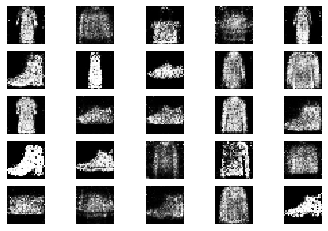

14201 [D loss: 0.688981, acc.: 54.69%] [G loss: 0.846401]
14202 [D loss: 0.590172, acc.: 65.62%] [G loss: 0.921261]
14203 [D loss: 0.690410, acc.: 51.56%] [G loss: 0.889751]
14204 [D loss: 0.642891, acc.: 68.75%] [G loss: 0.835541]
14205 [D loss: 0.686675, acc.: 51.56%] [G loss: 0.882918]
14206 [D loss: 0.671159, acc.: 56.25%] [G loss: 0.911860]
14207 [D loss: 0.648959, acc.: 64.06%] [G loss: 0.938420]
14208 [D loss: 0.655398, acc.: 59.38%] [G loss: 0.895542]
14209 [D loss: 0.656443, acc.: 62.50%] [G loss: 0.961426]
14210 [D loss: 0.625608, acc.: 71.88%] [G loss: 0.850229]
14211 [D loss: 0.708219, acc.: 53.12%] [G loss: 0.863717]
14212 [D loss: 0.644251, acc.: 65.62%] [G loss: 0.824515]
14213 [D loss: 0.626025, acc.: 67.19%] [G loss: 0.905208]
14214 [D loss: 0.666963, acc.: 57.81%] [G loss: 0.960522]
14215 [D loss: 0.651259, acc.: 56.25%] [G loss: 0.836429]
14216 [D loss: 0.745542, acc.: 46.88%] [G loss: 0.867016]
14217 [D loss: 0.719368, acc.: 46.88%] [G loss: 0.809229]
14218 [D loss:

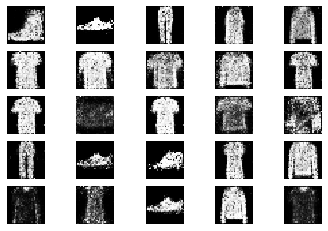

14401 [D loss: 0.610044, acc.: 60.94%] [G loss: 0.835738]
14402 [D loss: 0.668117, acc.: 64.06%] [G loss: 0.860475]
14403 [D loss: 0.736586, acc.: 53.12%] [G loss: 0.796751]
14404 [D loss: 0.650441, acc.: 62.50%] [G loss: 0.764154]
14405 [D loss: 0.655208, acc.: 62.50%] [G loss: 0.909631]
14406 [D loss: 0.621851, acc.: 62.50%] [G loss: 0.815069]
14407 [D loss: 0.653827, acc.: 64.06%] [G loss: 0.915283]
14408 [D loss: 0.659796, acc.: 60.94%] [G loss: 0.858458]
14409 [D loss: 0.574631, acc.: 73.44%] [G loss: 0.952428]
14410 [D loss: 0.599902, acc.: 68.75%] [G loss: 0.940452]
14411 [D loss: 0.716568, acc.: 56.25%] [G loss: 0.922432]
14412 [D loss: 0.708754, acc.: 56.25%] [G loss: 0.973474]
14413 [D loss: 0.675960, acc.: 57.81%] [G loss: 0.879643]
14414 [D loss: 0.604563, acc.: 71.88%] [G loss: 0.903405]
14415 [D loss: 0.633857, acc.: 65.62%] [G loss: 0.881327]
14416 [D loss: 0.633381, acc.: 70.31%] [G loss: 0.866734]
14417 [D loss: 0.662803, acc.: 62.50%] [G loss: 0.919371]
14418 [D loss:

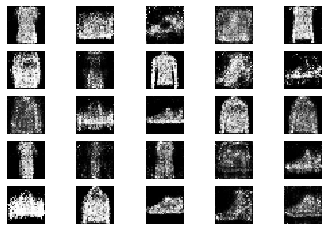

14601 [D loss: 0.692405, acc.: 46.88%] [G loss: 0.927466]
14602 [D loss: 0.637026, acc.: 62.50%] [G loss: 0.907397]
14603 [D loss: 0.723553, acc.: 45.31%] [G loss: 0.909652]
14604 [D loss: 0.675091, acc.: 51.56%] [G loss: 0.786142]
14605 [D loss: 0.634705, acc.: 68.75%] [G loss: 0.895647]
14606 [D loss: 0.664524, acc.: 59.38%] [G loss: 0.911766]
14607 [D loss: 0.676073, acc.: 56.25%] [G loss: 0.879825]
14608 [D loss: 0.668228, acc.: 57.81%] [G loss: 0.812351]
14609 [D loss: 0.665240, acc.: 59.38%] [G loss: 0.868908]
14610 [D loss: 0.699503, acc.: 53.12%] [G loss: 0.860001]
14611 [D loss: 0.669819, acc.: 57.81%] [G loss: 0.936017]
14612 [D loss: 0.625107, acc.: 60.94%] [G loss: 0.876301]
14613 [D loss: 0.636418, acc.: 60.94%] [G loss: 0.919845]
14614 [D loss: 0.644323, acc.: 73.44%] [G loss: 0.913105]
14615 [D loss: 0.706665, acc.: 57.81%] [G loss: 0.826025]
14616 [D loss: 0.649262, acc.: 62.50%] [G loss: 0.956103]
14617 [D loss: 0.609311, acc.: 70.31%] [G loss: 0.914698]
14618 [D loss:

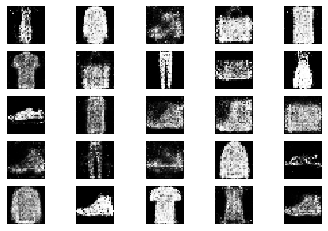

14801 [D loss: 0.659412, acc.: 54.69%] [G loss: 0.832052]
14802 [D loss: 0.610119, acc.: 70.31%] [G loss: 0.855939]
14803 [D loss: 0.682406, acc.: 51.56%] [G loss: 0.787593]
14804 [D loss: 0.601529, acc.: 68.75%] [G loss: 0.883830]
14805 [D loss: 0.700311, acc.: 54.69%] [G loss: 0.891559]
14806 [D loss: 0.672302, acc.: 60.94%] [G loss: 0.868568]
14807 [D loss: 0.675168, acc.: 60.94%] [G loss: 0.909189]
14808 [D loss: 0.657504, acc.: 60.94%] [G loss: 0.900839]
14809 [D loss: 0.657898, acc.: 64.06%] [G loss: 0.950440]
14810 [D loss: 0.666306, acc.: 57.81%] [G loss: 0.868885]
14811 [D loss: 0.664913, acc.: 53.12%] [G loss: 0.954069]
14812 [D loss: 0.670136, acc.: 59.38%] [G loss: 0.942382]
14813 [D loss: 0.602244, acc.: 70.31%] [G loss: 0.819956]
14814 [D loss: 0.635487, acc.: 68.75%] [G loss: 0.820063]
14815 [D loss: 0.584107, acc.: 76.56%] [G loss: 0.874545]
14816 [D loss: 0.654043, acc.: 57.81%] [G loss: 0.906661]
14817 [D loss: 0.696395, acc.: 48.44%] [G loss: 0.864869]
14818 [D loss:

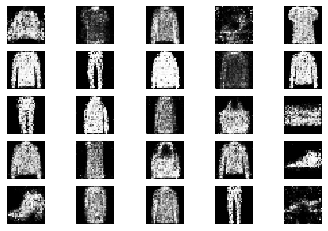

15001 [D loss: 0.613032, acc.: 60.94%] [G loss: 0.866926]
15002 [D loss: 0.627276, acc.: 65.62%] [G loss: 0.974434]
15003 [D loss: 0.683813, acc.: 59.38%] [G loss: 0.922563]
15004 [D loss: 0.649817, acc.: 65.62%] [G loss: 0.949458]
15005 [D loss: 0.707847, acc.: 53.12%] [G loss: 0.963143]
15006 [D loss: 0.653407, acc.: 54.69%] [G loss: 0.814071]
15007 [D loss: 0.639785, acc.: 67.19%] [G loss: 0.835999]
15008 [D loss: 0.638082, acc.: 64.06%] [G loss: 0.889896]
15009 [D loss: 0.643626, acc.: 65.62%] [G loss: 0.948883]
15010 [D loss: 0.600777, acc.: 67.19%] [G loss: 0.893159]
15011 [D loss: 0.744164, acc.: 53.12%] [G loss: 0.922210]
15012 [D loss: 0.725737, acc.: 53.12%] [G loss: 0.944943]
15013 [D loss: 0.650899, acc.: 56.25%] [G loss: 0.850727]
15014 [D loss: 0.641362, acc.: 60.94%] [G loss: 0.970133]
15015 [D loss: 0.612944, acc.: 68.75%] [G loss: 0.922606]
15016 [D loss: 0.610621, acc.: 65.62%] [G loss: 0.907582]
15017 [D loss: 0.626695, acc.: 62.50%] [G loss: 0.947124]
15018 [D loss:

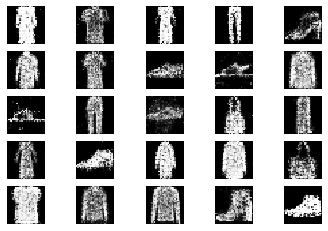

15201 [D loss: 0.683780, acc.: 54.69%] [G loss: 0.950229]
15202 [D loss: 0.629068, acc.: 64.06%] [G loss: 0.918084]
15203 [D loss: 0.594393, acc.: 70.31%] [G loss: 0.888561]
15204 [D loss: 0.643460, acc.: 64.06%] [G loss: 0.950533]
15205 [D loss: 0.636673, acc.: 56.25%] [G loss: 0.856029]
15206 [D loss: 0.650752, acc.: 56.25%] [G loss: 0.974506]
15207 [D loss: 0.638659, acc.: 68.75%] [G loss: 0.909372]
15208 [D loss: 0.642226, acc.: 60.94%] [G loss: 0.910282]
15209 [D loss: 0.648614, acc.: 57.81%] [G loss: 0.974085]
15210 [D loss: 0.591667, acc.: 70.31%] [G loss: 0.940107]
15211 [D loss: 0.677081, acc.: 53.12%] [G loss: 0.959601]
15212 [D loss: 0.647907, acc.: 64.06%] [G loss: 0.986447]
15213 [D loss: 0.686297, acc.: 46.88%] [G loss: 0.899488]
15214 [D loss: 0.646707, acc.: 67.19%] [G loss: 0.939661]
15215 [D loss: 0.641649, acc.: 62.50%] [G loss: 0.979789]
15216 [D loss: 0.575743, acc.: 71.88%] [G loss: 1.007330]
15217 [D loss: 0.639156, acc.: 64.06%] [G loss: 0.894782]
15218 [D loss:

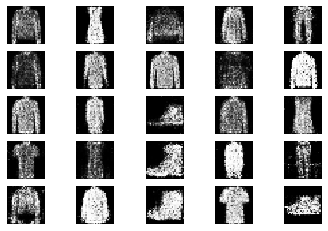

15401 [D loss: 0.697721, acc.: 48.44%] [G loss: 0.928698]
15402 [D loss: 0.646799, acc.: 67.19%] [G loss: 0.893237]
15403 [D loss: 0.657312, acc.: 59.38%] [G loss: 0.871832]
15404 [D loss: 0.654877, acc.: 59.38%] [G loss: 0.872534]
15405 [D loss: 0.663954, acc.: 65.62%] [G loss: 0.861052]
15406 [D loss: 0.662486, acc.: 56.25%] [G loss: 0.839616]
15407 [D loss: 0.690001, acc.: 57.81%] [G loss: 0.870917]
15408 [D loss: 0.657812, acc.: 59.38%] [G loss: 0.910295]
15409 [D loss: 0.669757, acc.: 59.38%] [G loss: 0.914394]
15410 [D loss: 0.677061, acc.: 54.69%] [G loss: 0.914926]
15411 [D loss: 0.645310, acc.: 65.62%] [G loss: 1.001147]
15412 [D loss: 0.664038, acc.: 57.81%] [G loss: 0.973118]
15413 [D loss: 0.676788, acc.: 62.50%] [G loss: 0.907049]
15414 [D loss: 0.697724, acc.: 54.69%] [G loss: 0.958323]
15415 [D loss: 0.619340, acc.: 60.94%] [G loss: 0.869476]
15416 [D loss: 0.636535, acc.: 62.50%] [G loss: 0.893532]
15417 [D loss: 0.679616, acc.: 59.38%] [G loss: 0.938448]
15418 [D loss:

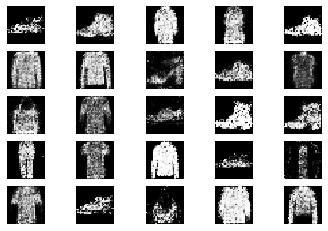

15601 [D loss: 0.656510, acc.: 60.94%] [G loss: 0.845145]
15602 [D loss: 0.655379, acc.: 54.69%] [G loss: 0.900869]
15603 [D loss: 0.672888, acc.: 59.38%] [G loss: 0.868170]
15604 [D loss: 0.693636, acc.: 53.12%] [G loss: 0.964461]
15605 [D loss: 0.643129, acc.: 64.06%] [G loss: 1.000113]
15606 [D loss: 0.646834, acc.: 59.38%] [G loss: 0.943109]
15607 [D loss: 0.626694, acc.: 65.62%] [G loss: 0.958107]
15608 [D loss: 0.724736, acc.: 57.81%] [G loss: 0.835229]
15609 [D loss: 0.653263, acc.: 68.75%] [G loss: 0.883182]
15610 [D loss: 0.687457, acc.: 53.12%] [G loss: 0.901573]
15611 [D loss: 0.663980, acc.: 51.56%] [G loss: 0.926650]
15612 [D loss: 0.627758, acc.: 60.94%] [G loss: 1.007060]
15613 [D loss: 0.676226, acc.: 62.50%] [G loss: 0.919960]
15614 [D loss: 0.726268, acc.: 45.31%] [G loss: 0.902001]
15615 [D loss: 0.702052, acc.: 56.25%] [G loss: 0.798213]
15616 [D loss: 0.663511, acc.: 64.06%] [G loss: 0.891590]
15617 [D loss: 0.631238, acc.: 68.75%] [G loss: 0.926089]
15618 [D loss:

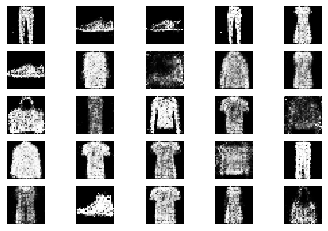

15801 [D loss: 0.691687, acc.: 54.69%] [G loss: 0.931513]
15802 [D loss: 0.577108, acc.: 71.88%] [G loss: 1.006716]
15803 [D loss: 0.640509, acc.: 57.81%] [G loss: 0.932348]
15804 [D loss: 0.698133, acc.: 57.81%] [G loss: 0.966985]
15805 [D loss: 0.655674, acc.: 65.62%] [G loss: 1.047353]
15806 [D loss: 0.628586, acc.: 67.19%] [G loss: 0.857734]
15807 [D loss: 0.640065, acc.: 64.06%] [G loss: 0.925786]
15808 [D loss: 0.696327, acc.: 54.69%] [G loss: 0.893487]
15809 [D loss: 0.626767, acc.: 62.50%] [G loss: 0.913043]
15810 [D loss: 0.657002, acc.: 57.81%] [G loss: 0.926630]
15811 [D loss: 0.629902, acc.: 62.50%] [G loss: 0.941037]
15812 [D loss: 0.654679, acc.: 60.94%] [G loss: 0.936508]
15813 [D loss: 0.639155, acc.: 64.06%] [G loss: 0.907289]
15814 [D loss: 0.684382, acc.: 53.12%] [G loss: 0.892426]
15815 [D loss: 0.624029, acc.: 68.75%] [G loss: 0.904348]
15816 [D loss: 0.636306, acc.: 70.31%] [G loss: 0.897677]
15817 [D loss: 0.649149, acc.: 57.81%] [G loss: 0.896163]
15818 [D loss:

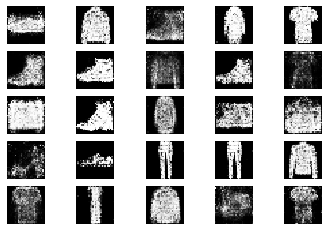

16001 [D loss: 0.683435, acc.: 53.12%] [G loss: 0.881711]
16002 [D loss: 0.634965, acc.: 57.81%] [G loss: 0.927122]
16003 [D loss: 0.639319, acc.: 67.19%] [G loss: 0.854755]
16004 [D loss: 0.599875, acc.: 60.94%] [G loss: 0.836157]
16005 [D loss: 0.679828, acc.: 60.94%] [G loss: 0.860702]
16006 [D loss: 0.661277, acc.: 54.69%] [G loss: 0.921561]
16007 [D loss: 0.644954, acc.: 60.94%] [G loss: 0.924580]
16008 [D loss: 0.648898, acc.: 64.06%] [G loss: 0.905577]
16009 [D loss: 0.646190, acc.: 65.62%] [G loss: 0.924378]
16010 [D loss: 0.658494, acc.: 56.25%] [G loss: 0.929610]
16011 [D loss: 0.629870, acc.: 67.19%] [G loss: 0.876862]
16012 [D loss: 0.712326, acc.: 59.38%] [G loss: 0.937377]
16013 [D loss: 0.653636, acc.: 56.25%] [G loss: 1.042882]
16014 [D loss: 0.675001, acc.: 62.50%] [G loss: 0.959406]
16015 [D loss: 0.707665, acc.: 50.00%] [G loss: 0.879359]
16016 [D loss: 0.650789, acc.: 60.94%] [G loss: 0.930237]
16017 [D loss: 0.654126, acc.: 59.38%] [G loss: 0.873596]
16018 [D loss:

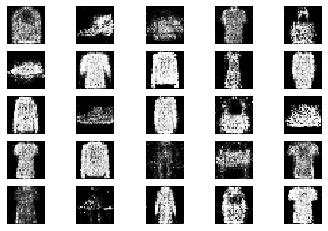

16201 [D loss: 0.603965, acc.: 70.31%] [G loss: 1.042668]
16202 [D loss: 0.731736, acc.: 50.00%] [G loss: 0.940975]
16203 [D loss: 0.602275, acc.: 68.75%] [G loss: 0.928251]
16204 [D loss: 0.650637, acc.: 65.62%] [G loss: 0.901404]
16205 [D loss: 0.707379, acc.: 57.81%] [G loss: 0.955140]
16206 [D loss: 0.600997, acc.: 62.50%] [G loss: 0.918151]
16207 [D loss: 0.673115, acc.: 56.25%] [G loss: 0.896589]
16208 [D loss: 0.628477, acc.: 62.50%] [G loss: 0.891008]
16209 [D loss: 0.644476, acc.: 65.62%] [G loss: 0.875053]
16210 [D loss: 0.656487, acc.: 62.50%] [G loss: 0.843633]
16211 [D loss: 0.647268, acc.: 65.62%] [G loss: 0.808208]
16212 [D loss: 0.670882, acc.: 59.38%] [G loss: 0.956050]
16213 [D loss: 0.628064, acc.: 64.06%] [G loss: 0.858355]
16214 [D loss: 0.625913, acc.: 71.88%] [G loss: 0.907259]
16215 [D loss: 0.671931, acc.: 62.50%] [G loss: 0.905206]
16216 [D loss: 0.694548, acc.: 50.00%] [G loss: 0.891865]
16217 [D loss: 0.624185, acc.: 59.38%] [G loss: 0.945758]
16218 [D loss:

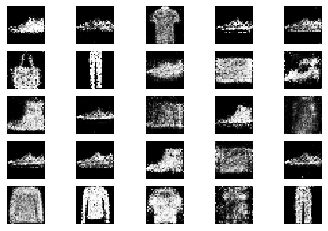

16401 [D loss: 0.612029, acc.: 68.75%] [G loss: 0.916081]
16402 [D loss: 0.641256, acc.: 59.38%] [G loss: 0.966695]
16403 [D loss: 0.644154, acc.: 64.06%] [G loss: 0.929352]
16404 [D loss: 0.633586, acc.: 67.19%] [G loss: 0.970787]
16405 [D loss: 0.770715, acc.: 42.19%] [G loss: 0.924188]
16406 [D loss: 0.655286, acc.: 57.81%] [G loss: 0.933323]
16407 [D loss: 0.646357, acc.: 62.50%] [G loss: 0.910477]
16408 [D loss: 0.626402, acc.: 71.88%] [G loss: 0.955191]
16409 [D loss: 0.702668, acc.: 56.25%] [G loss: 0.890339]
16410 [D loss: 0.722202, acc.: 46.88%] [G loss: 0.852724]
16411 [D loss: 0.654991, acc.: 56.25%] [G loss: 0.941438]
16412 [D loss: 0.703690, acc.: 56.25%] [G loss: 0.897570]
16413 [D loss: 0.625485, acc.: 68.75%] [G loss: 0.945908]
16414 [D loss: 0.668329, acc.: 59.38%] [G loss: 0.923793]
16415 [D loss: 0.723848, acc.: 48.44%] [G loss: 0.919798]
16416 [D loss: 0.683905, acc.: 64.06%] [G loss: 0.945787]
16417 [D loss: 0.670696, acc.: 57.81%] [G loss: 0.882906]
16418 [D loss:

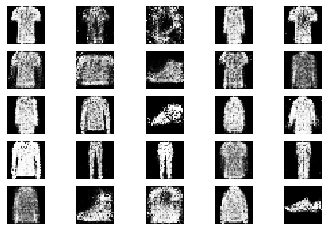

16601 [D loss: 0.660800, acc.: 54.69%] [G loss: 0.900412]
16602 [D loss: 0.650468, acc.: 65.62%] [G loss: 0.913624]
16603 [D loss: 0.631359, acc.: 73.44%] [G loss: 0.878984]
16604 [D loss: 0.629508, acc.: 70.31%] [G loss: 0.825135]
16605 [D loss: 0.733412, acc.: 42.19%] [G loss: 0.866510]
16606 [D loss: 0.686713, acc.: 50.00%] [G loss: 0.960710]
16607 [D loss: 0.605198, acc.: 65.62%] [G loss: 0.923308]
16608 [D loss: 0.657191, acc.: 57.81%] [G loss: 0.918718]
16609 [D loss: 0.624044, acc.: 62.50%] [G loss: 0.932164]
16610 [D loss: 0.639459, acc.: 59.38%] [G loss: 0.883538]
16611 [D loss: 0.686568, acc.: 57.81%] [G loss: 0.866683]
16612 [D loss: 0.632875, acc.: 64.06%] [G loss: 0.872778]
16613 [D loss: 0.692323, acc.: 56.25%] [G loss: 0.906226]
16614 [D loss: 0.582878, acc.: 71.88%] [G loss: 0.860733]
16615 [D loss: 0.635557, acc.: 64.06%] [G loss: 0.879985]
16616 [D loss: 0.642506, acc.: 56.25%] [G loss: 0.827069]
16617 [D loss: 0.663233, acc.: 62.50%] [G loss: 0.867515]
16618 [D loss:

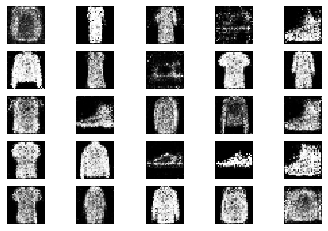

16801 [D loss: 0.660812, acc.: 65.62%] [G loss: 0.888532]
16802 [D loss: 0.666043, acc.: 70.31%] [G loss: 0.999267]
16803 [D loss: 0.630972, acc.: 60.94%] [G loss: 0.961654]
16804 [D loss: 0.708041, acc.: 53.12%] [G loss: 0.891661]
16805 [D loss: 0.679047, acc.: 60.94%] [G loss: 0.945979]
16806 [D loss: 0.646709, acc.: 64.06%] [G loss: 0.870993]
16807 [D loss: 0.690124, acc.: 57.81%] [G loss: 0.764868]
16808 [D loss: 0.651641, acc.: 64.06%] [G loss: 0.856635]
16809 [D loss: 0.709097, acc.: 48.44%] [G loss: 0.850229]
16810 [D loss: 0.643940, acc.: 67.19%] [G loss: 0.906459]
16811 [D loss: 0.640402, acc.: 60.94%] [G loss: 0.904627]
16812 [D loss: 0.610001, acc.: 70.31%] [G loss: 0.974584]
16813 [D loss: 0.663249, acc.: 59.38%] [G loss: 0.942858]
16814 [D loss: 0.646677, acc.: 64.06%] [G loss: 0.966544]
16815 [D loss: 0.675714, acc.: 60.94%] [G loss: 0.937811]
16816 [D loss: 0.626879, acc.: 65.62%] [G loss: 0.888502]
16817 [D loss: 0.694382, acc.: 54.69%] [G loss: 0.887803]
16818 [D loss:

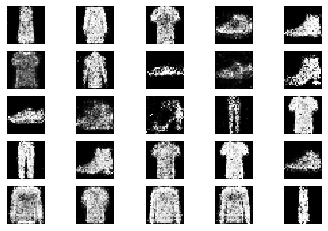

17001 [D loss: 0.653543, acc.: 64.06%] [G loss: 0.902920]
17002 [D loss: 0.655818, acc.: 65.62%] [G loss: 0.943002]
17003 [D loss: 0.659443, acc.: 57.81%] [G loss: 0.885835]
17004 [D loss: 0.636868, acc.: 65.62%] [G loss: 0.928691]
17005 [D loss: 0.651796, acc.: 65.62%] [G loss: 0.898007]
17006 [D loss: 0.658023, acc.: 59.38%] [G loss: 0.905161]
17007 [D loss: 0.714980, acc.: 53.12%] [G loss: 1.007805]
17008 [D loss: 0.655191, acc.: 62.50%] [G loss: 0.928534]
17009 [D loss: 0.674520, acc.: 54.69%] [G loss: 0.952448]
17010 [D loss: 0.666067, acc.: 57.81%] [G loss: 0.943755]
17011 [D loss: 0.652561, acc.: 64.06%] [G loss: 0.945975]
17012 [D loss: 0.686185, acc.: 65.62%] [G loss: 0.946474]
17013 [D loss: 0.725677, acc.: 51.56%] [G loss: 0.868165]
17014 [D loss: 0.569961, acc.: 73.44%] [G loss: 0.950426]
17015 [D loss: 0.668980, acc.: 59.38%] [G loss: 0.951700]
17016 [D loss: 0.608679, acc.: 60.94%] [G loss: 1.043112]
17017 [D loss: 0.583162, acc.: 71.88%] [G loss: 0.958751]
17018 [D loss:

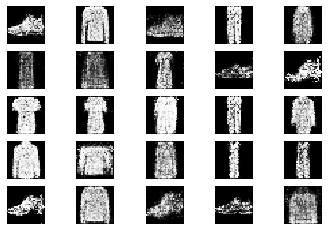

17201 [D loss: 0.574315, acc.: 71.88%] [G loss: 0.921353]
17202 [D loss: 0.618815, acc.: 67.19%] [G loss: 1.010493]
17203 [D loss: 0.656672, acc.: 60.94%] [G loss: 0.991876]
17204 [D loss: 0.618781, acc.: 59.38%] [G loss: 0.942632]
17205 [D loss: 0.619158, acc.: 62.50%] [G loss: 0.945866]
17206 [D loss: 0.658396, acc.: 62.50%] [G loss: 0.897849]
17207 [D loss: 0.585606, acc.: 68.75%] [G loss: 0.901265]
17208 [D loss: 0.710191, acc.: 53.12%] [G loss: 0.859103]
17209 [D loss: 0.616223, acc.: 67.19%] [G loss: 0.934938]
17210 [D loss: 0.706197, acc.: 59.38%] [G loss: 0.939772]
17211 [D loss: 0.687654, acc.: 60.94%] [G loss: 0.958322]
17212 [D loss: 0.714139, acc.: 50.00%] [G loss: 0.903893]
17213 [D loss: 0.668877, acc.: 59.38%] [G loss: 0.968695]
17214 [D loss: 0.603643, acc.: 70.31%] [G loss: 0.907069]
17215 [D loss: 0.657130, acc.: 64.06%] [G loss: 0.877108]
17216 [D loss: 0.719889, acc.: 53.12%] [G loss: 0.968598]
17217 [D loss: 0.605269, acc.: 73.44%] [G loss: 0.946614]
17218 [D loss:

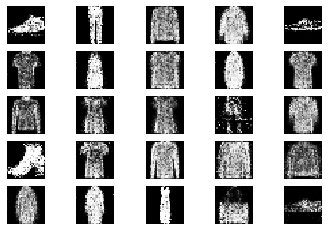

17401 [D loss: 0.624001, acc.: 70.31%] [G loss: 0.871554]
17402 [D loss: 0.700534, acc.: 53.12%] [G loss: 0.900549]
17403 [D loss: 0.643415, acc.: 67.19%] [G loss: 0.886577]
17404 [D loss: 0.594147, acc.: 65.62%] [G loss: 0.847909]
17405 [D loss: 0.680145, acc.: 59.38%] [G loss: 0.950365]
17406 [D loss: 0.638470, acc.: 57.81%] [G loss: 0.904203]
17407 [D loss: 0.687127, acc.: 54.69%] [G loss: 0.916257]
17408 [D loss: 0.581576, acc.: 68.75%] [G loss: 0.957357]
17409 [D loss: 0.663787, acc.: 60.94%] [G loss: 0.881374]
17410 [D loss: 0.652496, acc.: 60.94%] [G loss: 0.816932]
17411 [D loss: 0.646794, acc.: 62.50%] [G loss: 0.912706]
17412 [D loss: 0.685234, acc.: 56.25%] [G loss: 0.897196]
17413 [D loss: 0.621609, acc.: 67.19%] [G loss: 0.859191]
17414 [D loss: 0.621955, acc.: 67.19%] [G loss: 0.977214]
17415 [D loss: 0.669618, acc.: 56.25%] [G loss: 0.892080]
17416 [D loss: 0.662084, acc.: 54.69%] [G loss: 0.899340]
17417 [D loss: 0.597359, acc.: 65.62%] [G loss: 0.991319]
17418 [D loss:

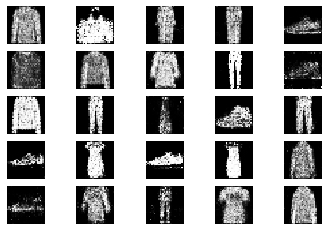

17601 [D loss: 0.619141, acc.: 65.62%] [G loss: 1.048903]
17602 [D loss: 0.548213, acc.: 75.00%] [G loss: 0.961864]
17603 [D loss: 0.668952, acc.: 60.94%] [G loss: 0.991597]
17604 [D loss: 0.658329, acc.: 57.81%] [G loss: 1.028847]
17605 [D loss: 0.691333, acc.: 56.25%] [G loss: 0.972152]
17606 [D loss: 0.648989, acc.: 62.50%] [G loss: 0.896892]
17607 [D loss: 0.607888, acc.: 70.31%] [G loss: 0.914000]
17608 [D loss: 0.665154, acc.: 54.69%] [G loss: 0.936099]
17609 [D loss: 0.653853, acc.: 60.94%] [G loss: 0.929671]
17610 [D loss: 0.686044, acc.: 54.69%] [G loss: 0.839581]
17611 [D loss: 0.672067, acc.: 56.25%] [G loss: 0.919093]
17612 [D loss: 0.642733, acc.: 60.94%] [G loss: 0.918846]
17613 [D loss: 0.596161, acc.: 70.31%] [G loss: 0.925510]
17614 [D loss: 0.659776, acc.: 57.81%] [G loss: 0.923915]
17615 [D loss: 0.597361, acc.: 70.31%] [G loss: 0.917975]
17616 [D loss: 0.609941, acc.: 62.50%] [G loss: 0.984569]
17617 [D loss: 0.685602, acc.: 59.38%] [G loss: 0.921053]
17618 [D loss:

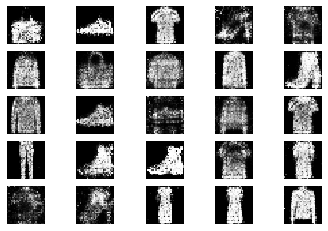

17801 [D loss: 0.646040, acc.: 59.38%] [G loss: 0.934344]
17802 [D loss: 0.680861, acc.: 57.81%] [G loss: 0.854113]
17803 [D loss: 0.656200, acc.: 60.94%] [G loss: 0.965494]
17804 [D loss: 0.668958, acc.: 60.94%] [G loss: 0.955501]
17805 [D loss: 0.675620, acc.: 59.38%] [G loss: 0.892601]
17806 [D loss: 0.671640, acc.: 59.38%] [G loss: 0.960680]
17807 [D loss: 0.639702, acc.: 59.38%] [G loss: 0.922221]
17808 [D loss: 0.577939, acc.: 71.88%] [G loss: 0.971573]
17809 [D loss: 0.688380, acc.: 57.81%] [G loss: 0.910823]
17810 [D loss: 0.672457, acc.: 57.81%] [G loss: 0.823277]
17811 [D loss: 0.665507, acc.: 65.62%] [G loss: 0.926043]
17812 [D loss: 0.633524, acc.: 68.75%] [G loss: 0.964073]
17813 [D loss: 0.609942, acc.: 75.00%] [G loss: 0.825253]
17814 [D loss: 0.604747, acc.: 64.06%] [G loss: 0.884152]
17815 [D loss: 0.676054, acc.: 56.25%] [G loss: 0.865028]
17816 [D loss: 0.689229, acc.: 57.81%] [G loss: 0.814389]
17817 [D loss: 0.665755, acc.: 50.00%] [G loss: 0.854124]
17818 [D loss:

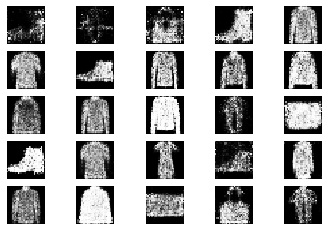

18001 [D loss: 0.653855, acc.: 59.38%] [G loss: 0.851304]
18002 [D loss: 0.670630, acc.: 56.25%] [G loss: 0.787254]
18003 [D loss: 0.703766, acc.: 59.38%] [G loss: 0.893327]
18004 [D loss: 0.626718, acc.: 68.75%] [G loss: 0.908377]
18005 [D loss: 0.638975, acc.: 64.06%] [G loss: 0.889363]
18006 [D loss: 0.645544, acc.: 67.19%] [G loss: 0.958057]
18007 [D loss: 0.630979, acc.: 56.25%] [G loss: 0.939404]
18008 [D loss: 0.664869, acc.: 64.06%] [G loss: 0.946752]
18009 [D loss: 0.641957, acc.: 60.94%] [G loss: 0.863507]
18010 [D loss: 0.613879, acc.: 62.50%] [G loss: 0.925266]
18011 [D loss: 0.657819, acc.: 59.38%] [G loss: 0.951341]
18012 [D loss: 0.666187, acc.: 50.00%] [G loss: 0.986723]
18013 [D loss: 0.627669, acc.: 67.19%] [G loss: 0.952168]
18014 [D loss: 0.573708, acc.: 68.75%] [G loss: 0.828911]
18015 [D loss: 0.668537, acc.: 56.25%] [G loss: 0.895571]
18016 [D loss: 0.637393, acc.: 60.94%] [G loss: 0.972668]
18017 [D loss: 0.678312, acc.: 54.69%] [G loss: 0.860965]
18018 [D loss:

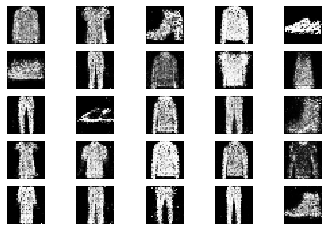

18201 [D loss: 0.630423, acc.: 64.06%] [G loss: 0.836148]
18202 [D loss: 0.608719, acc.: 67.19%] [G loss: 0.948815]
18203 [D loss: 0.702308, acc.: 56.25%] [G loss: 0.927498]
18204 [D loss: 0.625480, acc.: 62.50%] [G loss: 0.942054]
18205 [D loss: 0.670683, acc.: 62.50%] [G loss: 0.915424]
18206 [D loss: 0.638722, acc.: 59.38%] [G loss: 0.984324]
18207 [D loss: 0.613144, acc.: 68.75%] [G loss: 0.943091]
18208 [D loss: 0.628530, acc.: 62.50%] [G loss: 0.908836]
18209 [D loss: 0.580210, acc.: 71.88%] [G loss: 0.893565]
18210 [D loss: 0.593475, acc.: 70.31%] [G loss: 0.925430]
18211 [D loss: 0.619948, acc.: 62.50%] [G loss: 0.959796]
18212 [D loss: 0.705696, acc.: 59.38%] [G loss: 0.917697]
18213 [D loss: 0.634085, acc.: 65.62%] [G loss: 0.807208]
18214 [D loss: 0.659763, acc.: 57.81%] [G loss: 0.848938]
18215 [D loss: 0.579928, acc.: 73.44%] [G loss: 0.961660]
18216 [D loss: 0.629422, acc.: 64.06%] [G loss: 0.933930]
18217 [D loss: 0.680046, acc.: 56.25%] [G loss: 0.935781]
18218 [D loss:

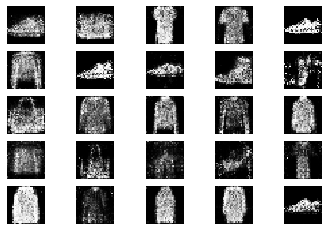

18401 [D loss: 0.666889, acc.: 56.25%] [G loss: 0.864343]
18402 [D loss: 0.589379, acc.: 70.31%] [G loss: 0.793718]
18403 [D loss: 0.690971, acc.: 53.12%] [G loss: 0.781619]
18404 [D loss: 0.626635, acc.: 64.06%] [G loss: 0.857231]
18405 [D loss: 0.688059, acc.: 62.50%] [G loss: 0.775074]
18406 [D loss: 0.609411, acc.: 71.88%] [G loss: 0.870114]
18407 [D loss: 0.675436, acc.: 67.19%] [G loss: 0.913904]
18408 [D loss: 0.617157, acc.: 71.88%] [G loss: 0.858047]
18409 [D loss: 0.739641, acc.: 50.00%] [G loss: 0.843053]
18410 [D loss: 0.696551, acc.: 54.69%] [G loss: 0.906646]
18411 [D loss: 0.639361, acc.: 64.06%] [G loss: 0.902048]
18412 [D loss: 0.655371, acc.: 65.62%] [G loss: 0.953733]
18413 [D loss: 0.598489, acc.: 71.88%] [G loss: 0.874574]
18414 [D loss: 0.616507, acc.: 67.19%] [G loss: 0.841154]
18415 [D loss: 0.626314, acc.: 62.50%] [G loss: 1.040224]
18416 [D loss: 0.577000, acc.: 73.44%] [G loss: 0.895684]
18417 [D loss: 0.651180, acc.: 59.38%] [G loss: 0.973631]
18418 [D loss:

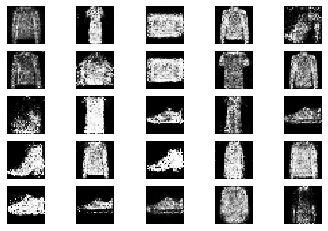

18601 [D loss: 0.669671, acc.: 59.38%] [G loss: 0.798514]
18602 [D loss: 0.719232, acc.: 48.44%] [G loss: 0.869219]
18603 [D loss: 0.667613, acc.: 56.25%] [G loss: 0.907613]
18604 [D loss: 0.673056, acc.: 54.69%] [G loss: 0.821655]
18605 [D loss: 0.650896, acc.: 67.19%] [G loss: 0.927886]
18606 [D loss: 0.637604, acc.: 64.06%] [G loss: 0.823822]
18607 [D loss: 0.646979, acc.: 70.31%] [G loss: 0.878474]
18608 [D loss: 0.661300, acc.: 57.81%] [G loss: 0.798968]
18609 [D loss: 0.682168, acc.: 54.69%] [G loss: 0.813151]
18610 [D loss: 0.648435, acc.: 67.19%] [G loss: 0.805635]
18611 [D loss: 0.664169, acc.: 57.81%] [G loss: 0.916573]
18612 [D loss: 0.657855, acc.: 56.25%] [G loss: 0.891348]
18613 [D loss: 0.671252, acc.: 54.69%] [G loss: 0.917104]
18614 [D loss: 0.656629, acc.: 62.50%] [G loss: 0.877871]
18615 [D loss: 0.623599, acc.: 60.94%] [G loss: 0.914034]
18616 [D loss: 0.640408, acc.: 70.31%] [G loss: 0.947406]
18617 [D loss: 0.585072, acc.: 68.75%] [G loss: 0.945502]
18618 [D loss:

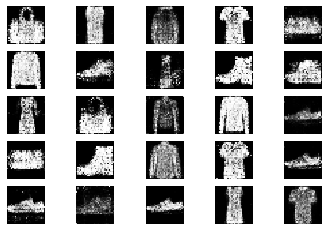

18801 [D loss: 0.577813, acc.: 71.88%] [G loss: 0.937304]
18802 [D loss: 0.648668, acc.: 62.50%] [G loss: 0.946556]
18803 [D loss: 0.725224, acc.: 54.69%] [G loss: 0.791610]
18804 [D loss: 0.664173, acc.: 59.38%] [G loss: 0.821902]
18805 [D loss: 0.701674, acc.: 54.69%] [G loss: 0.879492]
18806 [D loss: 0.611621, acc.: 67.19%] [G loss: 0.900112]
18807 [D loss: 0.695695, acc.: 54.69%] [G loss: 0.948914]
18808 [D loss: 0.568621, acc.: 79.69%] [G loss: 0.976301]
18809 [D loss: 0.651411, acc.: 59.38%] [G loss: 0.933392]
18810 [D loss: 0.733069, acc.: 51.56%] [G loss: 0.994074]
18811 [D loss: 0.700285, acc.: 51.56%] [G loss: 0.881878]
18812 [D loss: 0.659664, acc.: 57.81%] [G loss: 0.835252]
18813 [D loss: 0.642369, acc.: 60.94%] [G loss: 0.871769]
18814 [D loss: 0.676526, acc.: 56.25%] [G loss: 0.848083]
18815 [D loss: 0.648135, acc.: 62.50%] [G loss: 0.929077]
18816 [D loss: 0.635800, acc.: 60.94%] [G loss: 0.885165]
18817 [D loss: 0.671843, acc.: 54.69%] [G loss: 0.899595]
18818 [D loss:

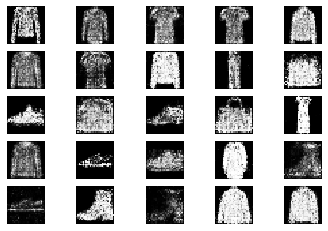

19001 [D loss: 0.591402, acc.: 73.44%] [G loss: 0.854198]
19002 [D loss: 0.623705, acc.: 68.75%] [G loss: 0.883319]
19003 [D loss: 0.720765, acc.: 50.00%] [G loss: 0.958494]
19004 [D loss: 0.662694, acc.: 57.81%] [G loss: 0.909588]
19005 [D loss: 0.694922, acc.: 53.12%] [G loss: 0.874504]
19006 [D loss: 0.650658, acc.: 62.50%] [G loss: 0.951796]
19007 [D loss: 0.658079, acc.: 56.25%] [G loss: 0.884538]
19008 [D loss: 0.740947, acc.: 43.75%] [G loss: 0.972176]
19009 [D loss: 0.608088, acc.: 78.12%] [G loss: 0.974233]
19010 [D loss: 0.649102, acc.: 62.50%] [G loss: 1.002972]
19011 [D loss: 0.632565, acc.: 64.06%] [G loss: 0.965835]
19012 [D loss: 0.617364, acc.: 64.06%] [G loss: 0.951868]
19013 [D loss: 0.647772, acc.: 59.38%] [G loss: 0.984515]
19014 [D loss: 0.643506, acc.: 62.50%] [G loss: 1.011341]
19015 [D loss: 0.654400, acc.: 65.62%] [G loss: 0.814055]
19016 [D loss: 0.641067, acc.: 57.81%] [G loss: 0.921931]
19017 [D loss: 0.638271, acc.: 68.75%] [G loss: 0.983979]
19018 [D loss:

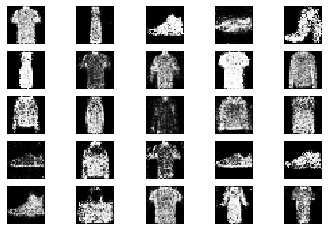

19201 [D loss: 0.602949, acc.: 64.06%] [G loss: 0.951640]
19202 [D loss: 0.609689, acc.: 65.62%] [G loss: 0.824699]
19203 [D loss: 0.589426, acc.: 71.88%] [G loss: 0.883309]
19204 [D loss: 0.639903, acc.: 64.06%] [G loss: 0.815370]
19205 [D loss: 0.670769, acc.: 62.50%] [G loss: 0.881052]
19206 [D loss: 0.567458, acc.: 75.00%] [G loss: 0.854865]
19207 [D loss: 0.691548, acc.: 54.69%] [G loss: 0.881218]
19208 [D loss: 0.641161, acc.: 60.94%] [G loss: 1.026588]
19209 [D loss: 0.637011, acc.: 59.38%] [G loss: 0.982327]
19210 [D loss: 0.681975, acc.: 54.69%] [G loss: 0.956054]
19211 [D loss: 0.730957, acc.: 50.00%] [G loss: 0.821338]
19212 [D loss: 0.736050, acc.: 51.56%] [G loss: 0.898506]
19213 [D loss: 0.633715, acc.: 68.75%] [G loss: 0.865502]
19214 [D loss: 0.611089, acc.: 64.06%] [G loss: 0.944934]
19215 [D loss: 0.623586, acc.: 70.31%] [G loss: 0.981266]
19216 [D loss: 0.701038, acc.: 57.81%] [G loss: 0.914027]
19217 [D loss: 0.584866, acc.: 67.19%] [G loss: 0.925354]
19218 [D loss:

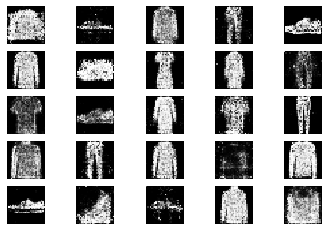

19401 [D loss: 0.616104, acc.: 68.75%] [G loss: 0.922774]
19402 [D loss: 0.684717, acc.: 54.69%] [G loss: 0.915136]
19403 [D loss: 0.611843, acc.: 68.75%] [G loss: 0.900089]
19404 [D loss: 0.694732, acc.: 60.94%] [G loss: 0.949313]
19405 [D loss: 0.618451, acc.: 62.50%] [G loss: 0.955342]
19406 [D loss: 0.657694, acc.: 64.06%] [G loss: 1.023578]
19407 [D loss: 0.656064, acc.: 64.06%] [G loss: 0.872770]
19408 [D loss: 0.718827, acc.: 48.44%] [G loss: 0.891188]
19409 [D loss: 0.641785, acc.: 56.25%] [G loss: 0.929784]
19410 [D loss: 0.623872, acc.: 59.38%] [G loss: 0.919150]
19411 [D loss: 0.629864, acc.: 67.19%] [G loss: 0.934075]
19412 [D loss: 0.664213, acc.: 65.62%] [G loss: 0.882494]
19413 [D loss: 0.621905, acc.: 67.19%] [G loss: 0.889772]
19414 [D loss: 0.579672, acc.: 75.00%] [G loss: 0.957482]
19415 [D loss: 0.684247, acc.: 54.69%] [G loss: 0.967566]
19416 [D loss: 0.640821, acc.: 57.81%] [G loss: 1.036912]
19417 [D loss: 0.622113, acc.: 65.62%] [G loss: 0.999755]
19418 [D loss:

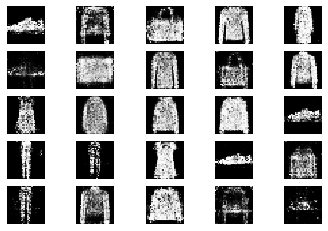

19601 [D loss: 0.643008, acc.: 65.62%] [G loss: 0.923320]
19602 [D loss: 0.664474, acc.: 67.19%] [G loss: 0.992950]
19603 [D loss: 0.580576, acc.: 71.88%] [G loss: 0.952095]
19604 [D loss: 0.626655, acc.: 64.06%] [G loss: 0.996181]
19605 [D loss: 0.706466, acc.: 57.81%] [G loss: 0.915852]
19606 [D loss: 0.607880, acc.: 65.62%] [G loss: 0.914309]
19607 [D loss: 0.705279, acc.: 50.00%] [G loss: 0.895560]
19608 [D loss: 0.658453, acc.: 60.94%] [G loss: 0.897516]
19609 [D loss: 0.697758, acc.: 57.81%] [G loss: 0.934751]
19610 [D loss: 0.694043, acc.: 56.25%] [G loss: 0.857208]
19611 [D loss: 0.617351, acc.: 70.31%] [G loss: 0.914938]
19612 [D loss: 0.677770, acc.: 56.25%] [G loss: 0.922685]
19613 [D loss: 0.592963, acc.: 70.31%] [G loss: 0.964424]
19614 [D loss: 0.651517, acc.: 59.38%] [G loss: 0.928056]
19615 [D loss: 0.672871, acc.: 50.00%] [G loss: 0.882484]
19616 [D loss: 0.595459, acc.: 65.62%] [G loss: 0.858314]
19617 [D loss: 0.652998, acc.: 50.00%] [G loss: 0.930403]
19618 [D loss:

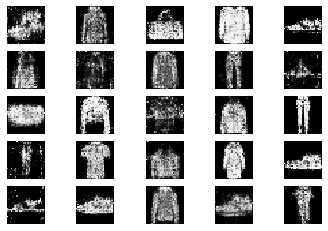

19801 [D loss: 0.694577, acc.: 59.38%] [G loss: 0.917620]
19802 [D loss: 0.610559, acc.: 73.44%] [G loss: 0.914052]
19803 [D loss: 0.609309, acc.: 65.62%] [G loss: 0.901414]
19804 [D loss: 0.693970, acc.: 57.81%] [G loss: 0.928510]
19805 [D loss: 0.627090, acc.: 59.38%] [G loss: 1.002941]
19806 [D loss: 0.620503, acc.: 65.62%] [G loss: 0.888295]
19807 [D loss: 0.644311, acc.: 64.06%] [G loss: 0.883911]
19808 [D loss: 0.607891, acc.: 71.88%] [G loss: 1.047768]
19809 [D loss: 0.644736, acc.: 62.50%] [G loss: 0.999578]
19810 [D loss: 0.674532, acc.: 54.69%] [G loss: 0.952362]
19811 [D loss: 0.600955, acc.: 70.31%] [G loss: 0.969894]
19812 [D loss: 0.630323, acc.: 62.50%] [G loss: 1.008575]
19813 [D loss: 0.638167, acc.: 65.62%] [G loss: 0.881475]
19814 [D loss: 0.640892, acc.: 60.94%] [G loss: 0.872464]
19815 [D loss: 0.677761, acc.: 56.25%] [G loss: 0.877468]
19816 [D loss: 0.631473, acc.: 62.50%] [G loss: 0.833491]
19817 [D loss: 0.689241, acc.: 56.25%] [G loss: 0.851687]
19818 [D loss:

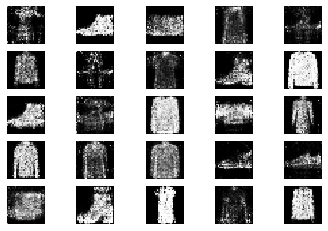

20001 [D loss: 0.679221, acc.: 56.25%] [G loss: 0.934807]
20002 [D loss: 0.635178, acc.: 62.50%] [G loss: 0.857052]
20003 [D loss: 0.627925, acc.: 68.75%] [G loss: 0.917814]
20004 [D loss: 0.657826, acc.: 59.38%] [G loss: 0.933676]
20005 [D loss: 0.680415, acc.: 57.81%] [G loss: 0.938869]
20006 [D loss: 0.663343, acc.: 56.25%] [G loss: 0.975388]
20007 [D loss: 0.705727, acc.: 48.44%] [G loss: 0.893887]
20008 [D loss: 0.621126, acc.: 68.75%] [G loss: 0.975875]
20009 [D loss: 0.701597, acc.: 53.12%] [G loss: 0.824919]
20010 [D loss: 0.650795, acc.: 60.94%] [G loss: 0.971910]
20011 [D loss: 0.652936, acc.: 60.94%] [G loss: 0.868027]
20012 [D loss: 0.607409, acc.: 70.31%] [G loss: 0.941347]
20013 [D loss: 0.680262, acc.: 59.38%] [G loss: 0.944343]
20014 [D loss: 0.627501, acc.: 64.06%] [G loss: 0.952802]
20015 [D loss: 0.671350, acc.: 57.81%] [G loss: 0.950838]
20016 [D loss: 0.682983, acc.: 64.06%] [G loss: 0.884573]
20017 [D loss: 0.706166, acc.: 51.56%] [G loss: 0.861641]
20018 [D loss:

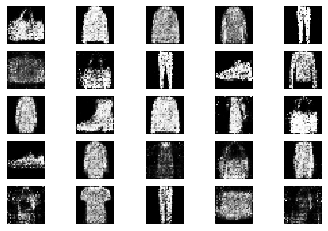

20201 [D loss: 0.624060, acc.: 65.62%] [G loss: 0.997281]
20202 [D loss: 0.605940, acc.: 67.19%] [G loss: 0.957189]
20203 [D loss: 0.690223, acc.: 57.81%] [G loss: 0.874049]
20204 [D loss: 0.662527, acc.: 56.25%] [G loss: 0.872720]
20205 [D loss: 0.675220, acc.: 54.69%] [G loss: 0.840811]
20206 [D loss: 0.612594, acc.: 68.75%] [G loss: 0.829231]
20207 [D loss: 0.611710, acc.: 64.06%] [G loss: 0.893023]
20208 [D loss: 0.634192, acc.: 62.50%] [G loss: 0.902474]
20209 [D loss: 0.673283, acc.: 60.94%] [G loss: 0.840810]
20210 [D loss: 0.617436, acc.: 62.50%] [G loss: 0.871048]
20211 [D loss: 0.676131, acc.: 56.25%] [G loss: 0.804449]
20212 [D loss: 0.661615, acc.: 64.06%] [G loss: 0.912732]
20213 [D loss: 0.626537, acc.: 68.75%] [G loss: 0.936753]
20214 [D loss: 0.661491, acc.: 64.06%] [G loss: 0.977818]
20215 [D loss: 0.616416, acc.: 64.06%] [G loss: 0.864763]
20216 [D loss: 0.679994, acc.: 56.25%] [G loss: 0.881808]
20217 [D loss: 0.652533, acc.: 62.50%] [G loss: 0.930682]
20218 [D loss:

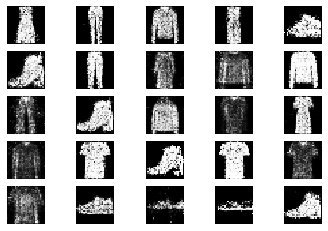

20401 [D loss: 0.744965, acc.: 43.75%] [G loss: 0.899184]
20402 [D loss: 0.613536, acc.: 68.75%] [G loss: 0.899233]
20403 [D loss: 0.695246, acc.: 48.44%] [G loss: 0.961000]
20404 [D loss: 0.691805, acc.: 53.12%] [G loss: 0.885710]
20405 [D loss: 0.624551, acc.: 71.88%] [G loss: 0.830311]
20406 [D loss: 0.651610, acc.: 57.81%] [G loss: 0.832453]
20407 [D loss: 0.641879, acc.: 62.50%] [G loss: 0.888058]
20408 [D loss: 0.673998, acc.: 56.25%] [G loss: 0.893487]
20409 [D loss: 0.688102, acc.: 57.81%] [G loss: 0.814399]
20410 [D loss: 0.632296, acc.: 62.50%] [G loss: 0.905663]
20411 [D loss: 0.656918, acc.: 56.25%] [G loss: 0.880165]
20412 [D loss: 0.664164, acc.: 56.25%] [G loss: 0.858075]
20413 [D loss: 0.692647, acc.: 57.81%] [G loss: 0.908603]
20414 [D loss: 0.654948, acc.: 64.06%] [G loss: 0.822906]
20415 [D loss: 0.761635, acc.: 50.00%] [G loss: 0.852050]
20416 [D loss: 0.613976, acc.: 67.19%] [G loss: 0.854639]
20417 [D loss: 0.701632, acc.: 57.81%] [G loss: 0.910676]
20418 [D loss:

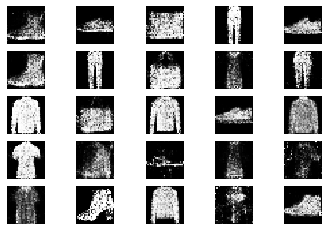

20601 [D loss: 0.656107, acc.: 62.50%] [G loss: 0.867285]
20602 [D loss: 0.681817, acc.: 60.94%] [G loss: 0.868911]
20603 [D loss: 0.608777, acc.: 67.19%] [G loss: 0.965450]
20604 [D loss: 0.602774, acc.: 68.75%] [G loss: 0.969631]
20605 [D loss: 0.618661, acc.: 64.06%] [G loss: 0.931253]
20606 [D loss: 0.672006, acc.: 50.00%] [G loss: 0.841205]
20607 [D loss: 0.645948, acc.: 62.50%] [G loss: 0.884873]
20608 [D loss: 0.754813, acc.: 53.12%] [G loss: 0.890928]
20609 [D loss: 0.668656, acc.: 54.69%] [G loss: 0.861555]
20610 [D loss: 0.616852, acc.: 65.62%] [G loss: 0.911399]
20611 [D loss: 0.656341, acc.: 57.81%] [G loss: 0.851256]
20612 [D loss: 0.655518, acc.: 57.81%] [G loss: 0.825025]
20613 [D loss: 0.664429, acc.: 56.25%] [G loss: 0.863184]
20614 [D loss: 0.682505, acc.: 60.94%] [G loss: 0.918360]
20615 [D loss: 0.592533, acc.: 71.88%] [G loss: 0.846753]
20616 [D loss: 0.649223, acc.: 59.38%] [G loss: 0.902595]
20617 [D loss: 0.649749, acc.: 60.94%] [G loss: 0.904245]
20618 [D loss:

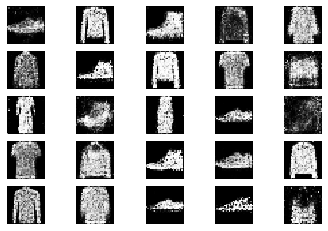

20801 [D loss: 0.744328, acc.: 50.00%] [G loss: 0.918288]
20802 [D loss: 0.732272, acc.: 54.69%] [G loss: 0.907484]
20803 [D loss: 0.588469, acc.: 71.88%] [G loss: 0.874982]
20804 [D loss: 0.624891, acc.: 65.62%] [G loss: 0.865573]
20805 [D loss: 0.645734, acc.: 51.56%] [G loss: 0.905670]
20806 [D loss: 0.686835, acc.: 56.25%] [G loss: 0.899608]
20807 [D loss: 0.666058, acc.: 60.94%] [G loss: 0.909717]
20808 [D loss: 0.642947, acc.: 64.06%] [G loss: 0.818786]
20809 [D loss: 0.601575, acc.: 70.31%] [G loss: 0.936264]
20810 [D loss: 0.684241, acc.: 54.69%] [G loss: 0.930711]
20811 [D loss: 0.684094, acc.: 62.50%] [G loss: 0.876422]
20812 [D loss: 0.604142, acc.: 68.75%] [G loss: 0.975788]
20813 [D loss: 0.612419, acc.: 64.06%] [G loss: 0.917481]
20814 [D loss: 0.688122, acc.: 57.81%] [G loss: 0.915921]
20815 [D loss: 0.721053, acc.: 53.12%] [G loss: 0.872300]
20816 [D loss: 0.732066, acc.: 48.44%] [G loss: 0.859243]
20817 [D loss: 0.666020, acc.: 64.06%] [G loss: 0.831455]
20818 [D loss:

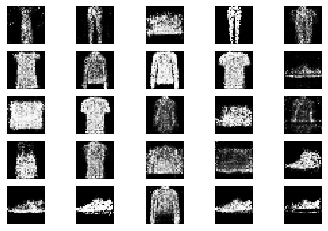

21001 [D loss: 0.657980, acc.: 57.81%] [G loss: 0.944123]
21002 [D loss: 0.659668, acc.: 57.81%] [G loss: 0.896386]
21003 [D loss: 0.651587, acc.: 64.06%] [G loss: 0.918266]
21004 [D loss: 0.585689, acc.: 73.44%] [G loss: 0.951610]
21005 [D loss: 0.612869, acc.: 70.31%] [G loss: 0.859288]
21006 [D loss: 0.634998, acc.: 70.31%] [G loss: 0.952445]
21007 [D loss: 0.592959, acc.: 73.44%] [G loss: 0.893384]
21008 [D loss: 0.610773, acc.: 78.12%] [G loss: 0.833705]
21009 [D loss: 0.692924, acc.: 59.38%] [G loss: 0.891221]
21010 [D loss: 0.656229, acc.: 54.69%] [G loss: 0.857925]
21011 [D loss: 0.701558, acc.: 50.00%] [G loss: 0.884405]
21012 [D loss: 0.662188, acc.: 57.81%] [G loss: 0.833686]
21013 [D loss: 0.641766, acc.: 67.19%] [G loss: 0.898328]
21014 [D loss: 0.650419, acc.: 71.88%] [G loss: 0.952083]
21015 [D loss: 0.663957, acc.: 54.69%] [G loss: 0.943655]
21016 [D loss: 0.618475, acc.: 71.88%] [G loss: 0.911166]
21017 [D loss: 0.579709, acc.: 73.44%] [G loss: 0.922236]
21018 [D loss:

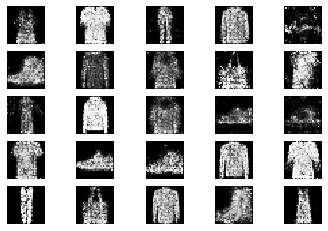

21201 [D loss: 0.649504, acc.: 60.94%] [G loss: 0.922149]
21202 [D loss: 0.595728, acc.: 64.06%] [G loss: 0.936728]
21203 [D loss: 0.580512, acc.: 70.31%] [G loss: 0.945659]
21204 [D loss: 0.616417, acc.: 68.75%] [G loss: 0.912970]
21205 [D loss: 0.626448, acc.: 67.19%] [G loss: 0.931608]
21206 [D loss: 0.654083, acc.: 54.69%] [G loss: 0.952327]
21207 [D loss: 0.681656, acc.: 64.06%] [G loss: 0.891493]
21208 [D loss: 0.650213, acc.: 60.94%] [G loss: 0.965626]
21209 [D loss: 0.701992, acc.: 53.12%] [G loss: 0.842208]
21210 [D loss: 0.642406, acc.: 67.19%] [G loss: 0.948877]
21211 [D loss: 0.668989, acc.: 53.12%] [G loss: 0.942448]
21212 [D loss: 0.719022, acc.: 53.12%] [G loss: 0.941308]
21213 [D loss: 0.583894, acc.: 68.75%] [G loss: 0.943534]
21214 [D loss: 0.743822, acc.: 45.31%] [G loss: 0.884353]
21215 [D loss: 0.670524, acc.: 64.06%] [G loss: 0.902255]
21216 [D loss: 0.651637, acc.: 62.50%] [G loss: 0.986483]
21217 [D loss: 0.596405, acc.: 70.31%] [G loss: 0.969102]
21218 [D loss:

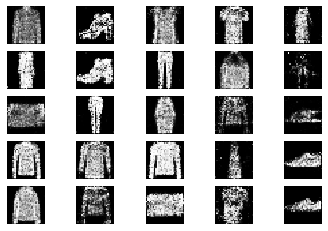

21401 [D loss: 0.645443, acc.: 67.19%] [G loss: 0.936783]
21402 [D loss: 0.602374, acc.: 68.75%] [G loss: 0.858530]
21403 [D loss: 0.563582, acc.: 68.75%] [G loss: 1.003728]
21404 [D loss: 0.702844, acc.: 62.50%] [G loss: 0.897744]
21405 [D loss: 0.608416, acc.: 59.38%] [G loss: 0.924726]
21406 [D loss: 0.637909, acc.: 64.06%] [G loss: 0.908974]
21407 [D loss: 0.633231, acc.: 71.88%] [G loss: 0.917027]
21408 [D loss: 0.671338, acc.: 59.38%] [G loss: 0.864912]
21409 [D loss: 0.703921, acc.: 60.94%] [G loss: 0.914769]
21410 [D loss: 0.651336, acc.: 68.75%] [G loss: 0.956869]
21411 [D loss: 0.655884, acc.: 64.06%] [G loss: 0.879333]
21412 [D loss: 0.621421, acc.: 62.50%] [G loss: 0.986337]
21413 [D loss: 0.596884, acc.: 73.44%] [G loss: 0.953003]
21414 [D loss: 0.614521, acc.: 65.62%] [G loss: 0.976400]
21415 [D loss: 0.688648, acc.: 57.81%] [G loss: 0.982387]
21416 [D loss: 0.636304, acc.: 65.62%] [G loss: 0.962953]
21417 [D loss: 0.668769, acc.: 59.38%] [G loss: 0.965436]
21418 [D loss:

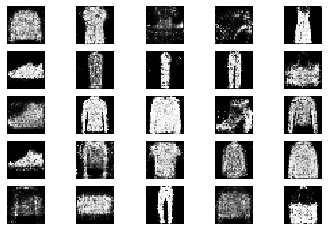

21601 [D loss: 0.623919, acc.: 64.06%] [G loss: 0.849682]
21602 [D loss: 0.664479, acc.: 65.62%] [G loss: 0.879161]
21603 [D loss: 0.668521, acc.: 56.25%] [G loss: 0.913355]
21604 [D loss: 0.666911, acc.: 60.94%] [G loss: 0.954580]
21605 [D loss: 0.609418, acc.: 60.94%] [G loss: 0.889907]
21606 [D loss: 0.662538, acc.: 59.38%] [G loss: 0.924124]
21607 [D loss: 0.680350, acc.: 54.69%] [G loss: 0.912537]
21608 [D loss: 0.712059, acc.: 51.56%] [G loss: 0.751278]
21609 [D loss: 0.612948, acc.: 64.06%] [G loss: 0.891051]
21610 [D loss: 0.628697, acc.: 67.19%] [G loss: 0.901570]
21611 [D loss: 0.618762, acc.: 62.50%] [G loss: 0.953963]
21612 [D loss: 0.611953, acc.: 68.75%] [G loss: 0.975878]
21613 [D loss: 0.649189, acc.: 64.06%] [G loss: 0.933637]
21614 [D loss: 0.639868, acc.: 59.38%] [G loss: 0.927740]
21615 [D loss: 0.675559, acc.: 56.25%] [G loss: 0.870309]
21616 [D loss: 0.614042, acc.: 71.88%] [G loss: 0.908469]
21617 [D loss: 0.628856, acc.: 60.94%] [G loss: 0.931932]
21618 [D loss:

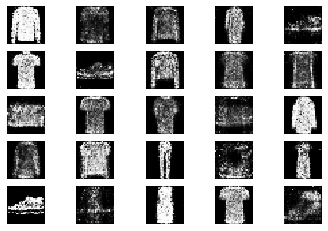

21801 [D loss: 0.668480, acc.: 62.50%] [G loss: 0.937279]
21802 [D loss: 0.666481, acc.: 65.62%] [G loss: 0.838177]
21803 [D loss: 0.646103, acc.: 59.38%] [G loss: 0.966558]
21804 [D loss: 0.551238, acc.: 75.00%] [G loss: 0.919463]
21805 [D loss: 0.651953, acc.: 54.69%] [G loss: 0.855496]
21806 [D loss: 0.575985, acc.: 67.19%] [G loss: 0.854066]
21807 [D loss: 0.648914, acc.: 54.69%] [G loss: 0.990144]
21808 [D loss: 0.638996, acc.: 60.94%] [G loss: 0.885336]
21809 [D loss: 0.644767, acc.: 60.94%] [G loss: 0.992821]
21810 [D loss: 0.617884, acc.: 65.62%] [G loss: 0.931489]
21811 [D loss: 0.593484, acc.: 71.88%] [G loss: 0.900797]
21812 [D loss: 0.623456, acc.: 68.75%] [G loss: 0.894826]
21813 [D loss: 0.635656, acc.: 62.50%] [G loss: 0.959717]
21814 [D loss: 0.661141, acc.: 62.50%] [G loss: 0.919956]
21815 [D loss: 0.663565, acc.: 60.94%] [G loss: 0.874203]
21816 [D loss: 0.621057, acc.: 65.62%] [G loss: 0.949209]
21817 [D loss: 0.646173, acc.: 67.19%] [G loss: 0.945914]
21818 [D loss:

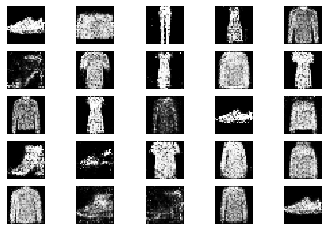

22001 [D loss: 0.697311, acc.: 56.25%] [G loss: 0.922659]
22002 [D loss: 0.638947, acc.: 65.62%] [G loss: 0.798895]
22003 [D loss: 0.692627, acc.: 53.12%] [G loss: 0.935426]
22004 [D loss: 0.694157, acc.: 56.25%] [G loss: 0.889085]
22005 [D loss: 0.661011, acc.: 54.69%] [G loss: 0.872178]
22006 [D loss: 0.593847, acc.: 70.31%] [G loss: 0.949935]
22007 [D loss: 0.625473, acc.: 68.75%] [G loss: 0.819854]
22008 [D loss: 0.661695, acc.: 57.81%] [G loss: 0.814287]
22009 [D loss: 0.664588, acc.: 60.94%] [G loss: 0.872583]
22010 [D loss: 0.678456, acc.: 54.69%] [G loss: 0.932066]
22011 [D loss: 0.689775, acc.: 64.06%] [G loss: 0.843080]
22012 [D loss: 0.674944, acc.: 57.81%] [G loss: 0.882700]
22013 [D loss: 0.578552, acc.: 71.88%] [G loss: 0.898538]
22014 [D loss: 0.649240, acc.: 57.81%] [G loss: 0.868129]
22015 [D loss: 0.668258, acc.: 56.25%] [G loss: 0.829083]
22016 [D loss: 0.638413, acc.: 60.94%] [G loss: 0.859890]
22017 [D loss: 0.663790, acc.: 60.94%] [G loss: 0.887511]
22018 [D loss:

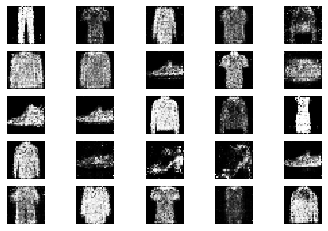

22201 [D loss: 0.612951, acc.: 64.06%] [G loss: 0.813191]
22202 [D loss: 0.690554, acc.: 56.25%] [G loss: 0.882147]
22203 [D loss: 0.638142, acc.: 67.19%] [G loss: 0.906432]
22204 [D loss: 0.577372, acc.: 70.31%] [G loss: 0.944862]
22205 [D loss: 0.633372, acc.: 60.94%] [G loss: 0.960725]
22206 [D loss: 0.593517, acc.: 68.75%] [G loss: 0.942299]
22207 [D loss: 0.696474, acc.: 57.81%] [G loss: 0.948512]
22208 [D loss: 0.612302, acc.: 64.06%] [G loss: 0.912604]
22209 [D loss: 0.701054, acc.: 59.38%] [G loss: 0.841451]
22210 [D loss: 0.714951, acc.: 48.44%] [G loss: 0.901435]
22211 [D loss: 0.625789, acc.: 62.50%] [G loss: 0.900176]
22212 [D loss: 0.640473, acc.: 65.62%] [G loss: 0.898270]
22213 [D loss: 0.646825, acc.: 64.06%] [G loss: 0.842532]
22214 [D loss: 0.687507, acc.: 57.81%] [G loss: 0.979974]
22215 [D loss: 0.612852, acc.: 70.31%] [G loss: 0.970782]
22216 [D loss: 0.665967, acc.: 56.25%] [G loss: 0.998519]
22217 [D loss: 0.692937, acc.: 51.56%] [G loss: 0.923159]
22218 [D loss:

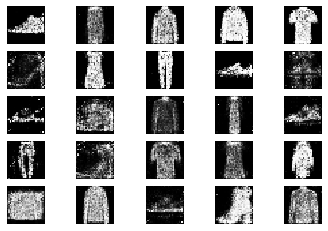

22401 [D loss: 0.621196, acc.: 59.38%] [G loss: 0.850133]
22402 [D loss: 0.577194, acc.: 71.88%] [G loss: 0.969690]
22403 [D loss: 0.573163, acc.: 75.00%] [G loss: 0.916294]
22404 [D loss: 0.661705, acc.: 62.50%] [G loss: 0.960987]
22405 [D loss: 0.626480, acc.: 62.50%] [G loss: 0.948778]
22406 [D loss: 0.655506, acc.: 65.62%] [G loss: 0.955840]
22407 [D loss: 0.659979, acc.: 64.06%] [G loss: 0.950638]
22408 [D loss: 0.605315, acc.: 68.75%] [G loss: 1.045440]
22409 [D loss: 0.625869, acc.: 67.19%] [G loss: 0.982924]
22410 [D loss: 0.614505, acc.: 64.06%] [G loss: 0.887359]
22411 [D loss: 0.582077, acc.: 67.19%] [G loss: 0.905330]
22412 [D loss: 0.644050, acc.: 60.94%] [G loss: 0.900126]
22413 [D loss: 0.697110, acc.: 54.69%] [G loss: 0.848409]
22414 [D loss: 0.607151, acc.: 70.31%] [G loss: 0.791228]
22415 [D loss: 0.647568, acc.: 60.94%] [G loss: 0.819876]
22416 [D loss: 0.683529, acc.: 59.38%] [G loss: 0.856842]
22417 [D loss: 0.605024, acc.: 62.50%] [G loss: 0.883681]
22418 [D loss:

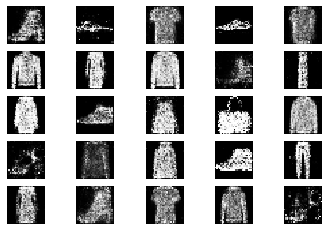

22601 [D loss: 0.661708, acc.: 67.19%] [G loss: 0.899878]
22602 [D loss: 0.645403, acc.: 62.50%] [G loss: 0.916603]
22603 [D loss: 0.653874, acc.: 51.56%] [G loss: 0.853920]
22604 [D loss: 0.701900, acc.: 53.12%] [G loss: 0.857168]
22605 [D loss: 0.686848, acc.: 53.12%] [G loss: 0.882073]
22606 [D loss: 0.651905, acc.: 59.38%] [G loss: 0.974180]
22607 [D loss: 0.688747, acc.: 56.25%] [G loss: 0.918049]
22608 [D loss: 0.629791, acc.: 62.50%] [G loss: 0.882890]
22609 [D loss: 0.578967, acc.: 67.19%] [G loss: 1.002414]
22610 [D loss: 0.642725, acc.: 67.19%] [G loss: 1.005823]
22611 [D loss: 0.640757, acc.: 57.81%] [G loss: 0.956706]
22612 [D loss: 0.611503, acc.: 70.31%] [G loss: 1.002532]
22613 [D loss: 0.620098, acc.: 64.06%] [G loss: 0.953013]
22614 [D loss: 0.661734, acc.: 68.75%] [G loss: 0.929742]
22615 [D loss: 0.637567, acc.: 67.19%] [G loss: 0.890379]
22616 [D loss: 0.649952, acc.: 53.12%] [G loss: 0.862935]
22617 [D loss: 0.637845, acc.: 65.62%] [G loss: 0.922290]
22618 [D loss:

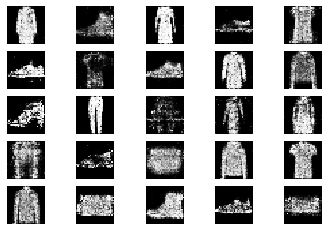

22801 [D loss: 0.685357, acc.: 57.81%] [G loss: 0.925603]
22802 [D loss: 0.642427, acc.: 67.19%] [G loss: 0.827604]
22803 [D loss: 0.618931, acc.: 71.88%] [G loss: 0.891201]
22804 [D loss: 0.606924, acc.: 68.75%] [G loss: 0.894446]
22805 [D loss: 0.577231, acc.: 78.12%] [G loss: 0.820890]
22806 [D loss: 0.651844, acc.: 59.38%] [G loss: 0.950825]
22807 [D loss: 0.654319, acc.: 67.19%] [G loss: 0.926244]
22808 [D loss: 0.691976, acc.: 51.56%] [G loss: 0.990857]
22809 [D loss: 0.678324, acc.: 54.69%] [G loss: 0.820584]
22810 [D loss: 0.630924, acc.: 60.94%] [G loss: 1.001910]
22811 [D loss: 0.618929, acc.: 71.88%] [G loss: 0.926897]
22812 [D loss: 0.655167, acc.: 64.06%] [G loss: 0.898933]
22813 [D loss: 0.597643, acc.: 65.62%] [G loss: 0.912971]
22814 [D loss: 0.627348, acc.: 65.62%] [G loss: 0.918939]
22815 [D loss: 0.652154, acc.: 59.38%] [G loss: 0.893524]
22816 [D loss: 0.706414, acc.: 57.81%] [G loss: 0.933172]
22817 [D loss: 0.631176, acc.: 60.94%] [G loss: 0.996073]
22818 [D loss:

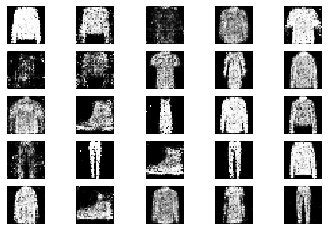

23001 [D loss: 0.685519, acc.: 64.06%] [G loss: 0.966510]
23002 [D loss: 0.666744, acc.: 54.69%] [G loss: 0.984751]
23003 [D loss: 0.630139, acc.: 60.94%] [G loss: 1.023096]
23004 [D loss: 0.591131, acc.: 67.19%] [G loss: 0.918548]
23005 [D loss: 0.626889, acc.: 68.75%] [G loss: 0.870089]
23006 [D loss: 0.659904, acc.: 59.38%] [G loss: 0.881237]
23007 [D loss: 0.605948, acc.: 67.19%] [G loss: 0.846817]
23008 [D loss: 0.658600, acc.: 65.62%] [G loss: 0.926643]
23009 [D loss: 0.705058, acc.: 57.81%] [G loss: 0.880807]
23010 [D loss: 0.576502, acc.: 75.00%] [G loss: 0.963965]
23011 [D loss: 0.672891, acc.: 57.81%] [G loss: 0.852238]
23012 [D loss: 0.610175, acc.: 68.75%] [G loss: 1.001094]
23013 [D loss: 0.616858, acc.: 68.75%] [G loss: 1.050965]
23014 [D loss: 0.616039, acc.: 67.19%] [G loss: 0.889314]
23015 [D loss: 0.646852, acc.: 65.62%] [G loss: 0.924453]
23016 [D loss: 0.609101, acc.: 71.88%] [G loss: 0.823260]
23017 [D loss: 0.717964, acc.: 53.12%] [G loss: 0.820467]
23018 [D loss:

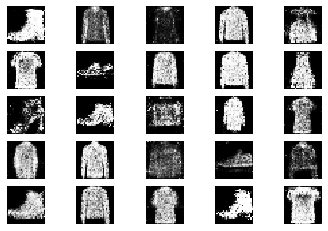

23201 [D loss: 0.694844, acc.: 51.56%] [G loss: 0.943159]
23202 [D loss: 0.652273, acc.: 59.38%] [G loss: 0.875895]
23203 [D loss: 0.677508, acc.: 60.94%] [G loss: 0.981750]
23204 [D loss: 0.703217, acc.: 50.00%] [G loss: 0.961262]
23205 [D loss: 0.703728, acc.: 54.69%] [G loss: 0.936230]
23206 [D loss: 0.665760, acc.: 57.81%] [G loss: 0.927264]
23207 [D loss: 0.729511, acc.: 53.12%] [G loss: 1.132812]
23208 [D loss: 0.597203, acc.: 68.75%] [G loss: 0.984336]
23209 [D loss: 0.692114, acc.: 51.56%] [G loss: 0.977201]
23210 [D loss: 0.589752, acc.: 75.00%] [G loss: 0.889769]
23211 [D loss: 0.648300, acc.: 59.38%] [G loss: 0.850006]
23212 [D loss: 0.616160, acc.: 67.19%] [G loss: 0.919041]
23213 [D loss: 0.629888, acc.: 71.88%] [G loss: 0.926776]
23214 [D loss: 0.676966, acc.: 56.25%] [G loss: 0.954418]
23215 [D loss: 0.607455, acc.: 64.06%] [G loss: 0.907306]
23216 [D loss: 0.673160, acc.: 59.38%] [G loss: 0.975940]
23217 [D loss: 0.621682, acc.: 62.50%] [G loss: 0.947829]
23218 [D loss:

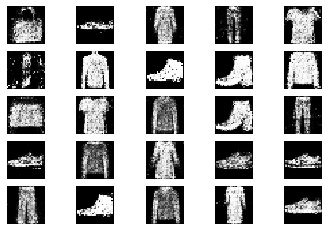

23401 [D loss: 0.697947, acc.: 57.81%] [G loss: 0.892289]
23402 [D loss: 0.627050, acc.: 65.62%] [G loss: 0.868246]
23403 [D loss: 0.664743, acc.: 53.12%] [G loss: 0.837194]
23404 [D loss: 0.668409, acc.: 56.25%] [G loss: 0.941848]
23405 [D loss: 0.645320, acc.: 67.19%] [G loss: 1.034765]
23406 [D loss: 0.674823, acc.: 64.06%] [G loss: 0.939260]
23407 [D loss: 0.680768, acc.: 51.56%] [G loss: 0.939933]
23408 [D loss: 0.610996, acc.: 65.62%] [G loss: 0.913012]
23409 [D loss: 0.586624, acc.: 70.31%] [G loss: 0.942780]
23410 [D loss: 0.632793, acc.: 60.94%] [G loss: 0.885745]
23411 [D loss: 0.699626, acc.: 53.12%] [G loss: 0.925251]
23412 [D loss: 0.739467, acc.: 54.69%] [G loss: 0.901632]
23413 [D loss: 0.643357, acc.: 53.12%] [G loss: 0.932492]
23414 [D loss: 0.686873, acc.: 56.25%] [G loss: 0.833911]
23415 [D loss: 0.642899, acc.: 64.06%] [G loss: 0.847578]
23416 [D loss: 0.701819, acc.: 59.38%] [G loss: 0.852921]
23417 [D loss: 0.575463, acc.: 73.44%] [G loss: 0.914826]
23418 [D loss:

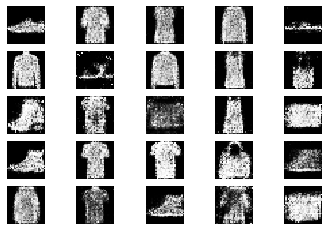

23601 [D loss: 0.639615, acc.: 60.94%] [G loss: 0.941617]
23602 [D loss: 0.749459, acc.: 46.88%] [G loss: 0.927763]
23603 [D loss: 0.662446, acc.: 60.94%] [G loss: 0.881405]
23604 [D loss: 0.667738, acc.: 64.06%] [G loss: 0.908684]
23605 [D loss: 0.736425, acc.: 42.19%] [G loss: 0.975240]
23606 [D loss: 0.644143, acc.: 59.38%] [G loss: 0.985059]
23607 [D loss: 0.688415, acc.: 50.00%] [G loss: 0.960573]
23608 [D loss: 0.643804, acc.: 67.19%] [G loss: 0.892102]
23609 [D loss: 0.653328, acc.: 59.38%] [G loss: 0.907239]
23610 [D loss: 0.596178, acc.: 71.88%] [G loss: 0.877209]
23611 [D loss: 0.645659, acc.: 59.38%] [G loss: 0.895971]
23612 [D loss: 0.681861, acc.: 54.69%] [G loss: 0.853575]
23613 [D loss: 0.644036, acc.: 62.50%] [G loss: 0.842900]
23614 [D loss: 0.664383, acc.: 60.94%] [G loss: 0.811658]
23615 [D loss: 0.664412, acc.: 64.06%] [G loss: 0.923440]
23616 [D loss: 0.563597, acc.: 71.88%] [G loss: 0.882642]
23617 [D loss: 0.644081, acc.: 59.38%] [G loss: 0.884483]
23618 [D loss:

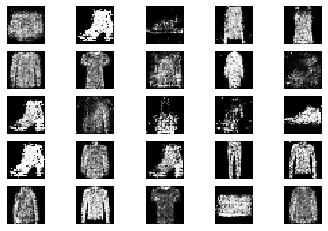

23801 [D loss: 0.637099, acc.: 68.75%] [G loss: 0.925005]
23802 [D loss: 0.582734, acc.: 65.62%] [G loss: 1.041376]
23803 [D loss: 0.737240, acc.: 51.56%] [G loss: 0.874487]
23804 [D loss: 0.644856, acc.: 67.19%] [G loss: 0.980016]
23805 [D loss: 0.626151, acc.: 67.19%] [G loss: 0.884107]
23806 [D loss: 0.628147, acc.: 59.38%] [G loss: 0.874844]
23807 [D loss: 0.660577, acc.: 59.38%] [G loss: 0.911447]
23808 [D loss: 0.652802, acc.: 60.94%] [G loss: 0.867804]
23809 [D loss: 0.717212, acc.: 51.56%] [G loss: 0.931513]
23810 [D loss: 0.674099, acc.: 54.69%] [G loss: 0.856660]
23811 [D loss: 0.665550, acc.: 53.12%] [G loss: 0.880013]
23812 [D loss: 0.625817, acc.: 68.75%] [G loss: 0.982099]
23813 [D loss: 0.640674, acc.: 60.94%] [G loss: 1.001835]
23814 [D loss: 0.621417, acc.: 65.62%] [G loss: 0.976617]
23815 [D loss: 0.636691, acc.: 64.06%] [G loss: 0.884702]
23816 [D loss: 0.615994, acc.: 70.31%] [G loss: 0.932499]
23817 [D loss: 0.623880, acc.: 65.62%] [G loss: 0.995704]
23818 [D loss:

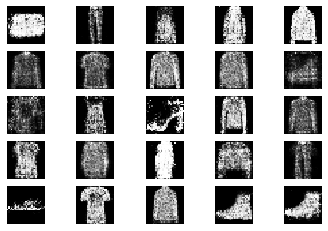

24001 [D loss: 0.619196, acc.: 73.44%] [G loss: 0.906538]
24002 [D loss: 0.727164, acc.: 50.00%] [G loss: 0.909455]
24003 [D loss: 0.644553, acc.: 64.06%] [G loss: 0.874379]
24004 [D loss: 0.621761, acc.: 62.50%] [G loss: 0.904650]
24005 [D loss: 0.644652, acc.: 62.50%] [G loss: 0.819117]
24006 [D loss: 0.631332, acc.: 57.81%] [G loss: 0.991427]
24007 [D loss: 0.650935, acc.: 60.94%] [G loss: 0.975309]
24008 [D loss: 0.582234, acc.: 70.31%] [G loss: 0.905182]
24009 [D loss: 0.715421, acc.: 57.81%] [G loss: 0.857367]
24010 [D loss: 0.657871, acc.: 56.25%] [G loss: 0.822588]
24011 [D loss: 0.627757, acc.: 62.50%] [G loss: 0.823750]
24012 [D loss: 0.680203, acc.: 54.69%] [G loss: 0.849207]
24013 [D loss: 0.646144, acc.: 57.81%] [G loss: 1.011710]
24014 [D loss: 0.676126, acc.: 57.81%] [G loss: 0.982389]
24015 [D loss: 0.649371, acc.: 67.19%] [G loss: 0.934362]
24016 [D loss: 0.677745, acc.: 57.81%] [G loss: 0.892930]
24017 [D loss: 0.636679, acc.: 65.62%] [G loss: 0.935820]
24018 [D loss:

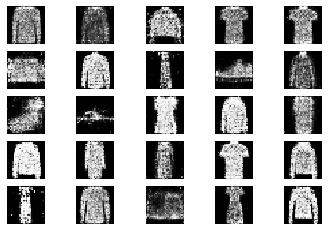

24201 [D loss: 0.653966, acc.: 64.06%] [G loss: 0.897450]
24202 [D loss: 0.635499, acc.: 68.75%] [G loss: 0.887391]
24203 [D loss: 0.661429, acc.: 59.38%] [G loss: 0.838626]
24204 [D loss: 0.618944, acc.: 68.75%] [G loss: 0.886938]
24205 [D loss: 0.672394, acc.: 60.94%] [G loss: 0.896551]
24206 [D loss: 0.665828, acc.: 62.50%] [G loss: 0.955339]
24207 [D loss: 0.653231, acc.: 62.50%] [G loss: 0.897272]
24208 [D loss: 0.590217, acc.: 68.75%] [G loss: 0.869565]
24209 [D loss: 0.640900, acc.: 62.50%] [G loss: 0.857426]
24210 [D loss: 0.623079, acc.: 70.31%] [G loss: 0.925207]
24211 [D loss: 0.702525, acc.: 57.81%] [G loss: 0.827952]
24212 [D loss: 0.657622, acc.: 62.50%] [G loss: 0.903771]
24213 [D loss: 0.666721, acc.: 50.00%] [G loss: 0.910951]
24214 [D loss: 0.694295, acc.: 50.00%] [G loss: 0.970188]
24215 [D loss: 0.663232, acc.: 57.81%] [G loss: 0.959485]
24216 [D loss: 0.661917, acc.: 57.81%] [G loss: 1.023914]
24217 [D loss: 0.775014, acc.: 45.31%] [G loss: 0.922988]
24218 [D loss:

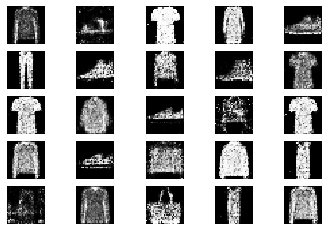

24401 [D loss: 0.634171, acc.: 60.94%] [G loss: 0.949364]
24402 [D loss: 0.607544, acc.: 68.75%] [G loss: 0.989435]
24403 [D loss: 0.688298, acc.: 53.12%] [G loss: 0.886463]
24404 [D loss: 0.608359, acc.: 68.75%] [G loss: 0.948311]
24405 [D loss: 0.598667, acc.: 71.88%] [G loss: 0.930806]
24406 [D loss: 0.625729, acc.: 67.19%] [G loss: 0.975931]
24407 [D loss: 0.593298, acc.: 75.00%] [G loss: 0.966097]
24408 [D loss: 0.697970, acc.: 56.25%] [G loss: 0.898151]
24409 [D loss: 0.553143, acc.: 76.56%] [G loss: 0.903289]
24410 [D loss: 0.690981, acc.: 56.25%] [G loss: 0.889010]
24411 [D loss: 0.657575, acc.: 57.81%] [G loss: 0.936921]
24412 [D loss: 0.600338, acc.: 65.62%] [G loss: 0.899040]
24413 [D loss: 0.663128, acc.: 64.06%] [G loss: 0.819198]
24414 [D loss: 0.643441, acc.: 60.94%] [G loss: 0.865105]
24415 [D loss: 0.654154, acc.: 67.19%] [G loss: 0.892905]
24416 [D loss: 0.636771, acc.: 67.19%] [G loss: 0.789296]
24417 [D loss: 0.653973, acc.: 64.06%] [G loss: 0.842399]
24418 [D loss:

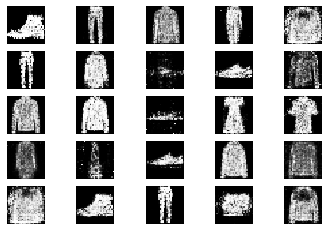

24601 [D loss: 0.680512, acc.: 53.12%] [G loss: 0.911475]
24602 [D loss: 0.621670, acc.: 60.94%] [G loss: 0.956831]
24603 [D loss: 0.638216, acc.: 67.19%] [G loss: 0.857318]
24604 [D loss: 0.651620, acc.: 57.81%] [G loss: 0.896231]
24605 [D loss: 0.641243, acc.: 67.19%] [G loss: 0.973689]
24606 [D loss: 0.606678, acc.: 73.44%] [G loss: 0.887770]
24607 [D loss: 0.659004, acc.: 67.19%] [G loss: 0.887016]
24608 [D loss: 0.629835, acc.: 59.38%] [G loss: 0.970283]
24609 [D loss: 0.738028, acc.: 53.12%] [G loss: 0.907889]
24610 [D loss: 0.647671, acc.: 54.69%] [G loss: 0.861505]
24611 [D loss: 0.622367, acc.: 65.62%] [G loss: 0.895236]
24612 [D loss: 0.659345, acc.: 62.50%] [G loss: 0.859064]
24613 [D loss: 0.626836, acc.: 64.06%] [G loss: 0.988963]
24614 [D loss: 0.671130, acc.: 62.50%] [G loss: 0.956212]
24615 [D loss: 0.603441, acc.: 70.31%] [G loss: 0.895352]
24616 [D loss: 0.632142, acc.: 62.50%] [G loss: 0.971010]
24617 [D loss: 0.643820, acc.: 60.94%] [G loss: 1.009050]
24618 [D loss:

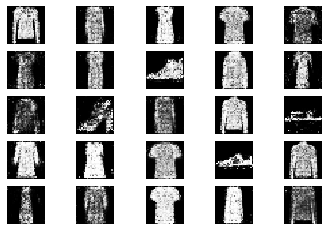

24801 [D loss: 0.615860, acc.: 62.50%] [G loss: 0.905300]
24802 [D loss: 0.618621, acc.: 71.88%] [G loss: 0.869192]
24803 [D loss: 0.557774, acc.: 73.44%] [G loss: 0.928877]
24804 [D loss: 0.673528, acc.: 53.12%] [G loss: 0.885071]
24805 [D loss: 0.635021, acc.: 60.94%] [G loss: 0.954000]
24806 [D loss: 0.641765, acc.: 59.38%] [G loss: 0.966611]
24807 [D loss: 0.681052, acc.: 59.38%] [G loss: 0.967882]
24808 [D loss: 0.647056, acc.: 64.06%] [G loss: 0.922563]
24809 [D loss: 0.622198, acc.: 73.44%] [G loss: 0.902040]
24810 [D loss: 0.638433, acc.: 64.06%] [G loss: 0.857776]
24811 [D loss: 0.670415, acc.: 64.06%] [G loss: 0.819168]
24812 [D loss: 0.600868, acc.: 64.06%] [G loss: 0.958656]
24813 [D loss: 0.608723, acc.: 65.62%] [G loss: 0.916393]
24814 [D loss: 0.733178, acc.: 53.12%] [G loss: 0.922044]
24815 [D loss: 0.618666, acc.: 62.50%] [G loss: 0.977772]
24816 [D loss: 0.711077, acc.: 57.81%] [G loss: 0.970744]
24817 [D loss: 0.583816, acc.: 71.88%] [G loss: 0.939495]
24818 [D loss:

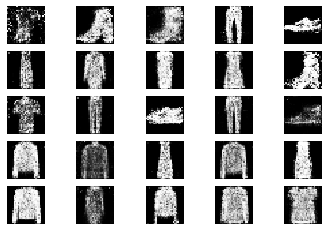

25001 [D loss: 0.558192, acc.: 75.00%] [G loss: 0.967484]
25002 [D loss: 0.700831, acc.: 54.69%] [G loss: 0.912519]
25003 [D loss: 0.641392, acc.: 59.38%] [G loss: 0.973135]
25004 [D loss: 0.655457, acc.: 57.81%] [G loss: 0.968663]
25005 [D loss: 0.631759, acc.: 65.62%] [G loss: 1.006934]
25006 [D loss: 0.649528, acc.: 62.50%] [G loss: 0.979628]
25007 [D loss: 0.626809, acc.: 62.50%] [G loss: 0.861757]
25008 [D loss: 0.647256, acc.: 65.62%] [G loss: 0.821243]
25009 [D loss: 0.589108, acc.: 73.44%] [G loss: 0.888031]
25010 [D loss: 0.645360, acc.: 62.50%] [G loss: 0.964557]
25011 [D loss: 0.584824, acc.: 73.44%] [G loss: 0.990965]
25012 [D loss: 0.612569, acc.: 68.75%] [G loss: 0.996901]
25013 [D loss: 0.673805, acc.: 54.69%] [G loss: 1.015389]
25014 [D loss: 0.591512, acc.: 62.50%] [G loss: 1.077003]
25015 [D loss: 0.652812, acc.: 57.81%] [G loss: 1.082360]
25016 [D loss: 0.726737, acc.: 56.25%] [G loss: 1.142000]
25017 [D loss: 0.632218, acc.: 65.62%] [G loss: 0.939118]
25018 [D loss:

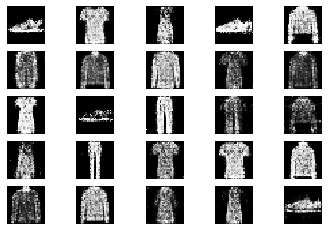

25201 [D loss: 0.650132, acc.: 60.94%] [G loss: 0.961138]
25202 [D loss: 0.591684, acc.: 68.75%] [G loss: 0.891215]
25203 [D loss: 0.674242, acc.: 59.38%] [G loss: 0.965590]
25204 [D loss: 0.602606, acc.: 65.62%] [G loss: 0.858347]
25205 [D loss: 0.685724, acc.: 54.69%] [G loss: 0.937789]
25206 [D loss: 0.659073, acc.: 59.38%] [G loss: 0.919084]
25207 [D loss: 0.657080, acc.: 57.81%] [G loss: 0.850072]
25208 [D loss: 0.658802, acc.: 59.38%] [G loss: 0.834990]
25209 [D loss: 0.687486, acc.: 51.56%] [G loss: 0.889599]
25210 [D loss: 0.700257, acc.: 56.25%] [G loss: 0.879454]
25211 [D loss: 0.588070, acc.: 68.75%] [G loss: 0.937209]
25212 [D loss: 0.692933, acc.: 56.25%] [G loss: 0.894149]
25213 [D loss: 0.582057, acc.: 68.75%] [G loss: 0.975377]
25214 [D loss: 0.642637, acc.: 62.50%] [G loss: 0.924701]
25215 [D loss: 0.619951, acc.: 59.38%] [G loss: 0.861424]
25216 [D loss: 0.660359, acc.: 56.25%] [G loss: 0.906913]
25217 [D loss: 0.676882, acc.: 59.38%] [G loss: 0.857910]
25218 [D loss:

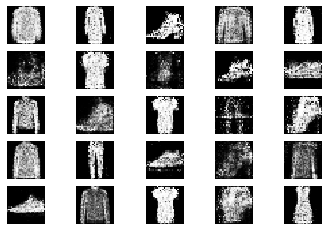

25401 [D loss: 0.631118, acc.: 62.50%] [G loss: 0.822991]
25402 [D loss: 0.609240, acc.: 59.38%] [G loss: 0.781061]
25403 [D loss: 0.698750, acc.: 46.88%] [G loss: 0.938632]
25404 [D loss: 0.670825, acc.: 53.12%] [G loss: 0.934662]
25405 [D loss: 0.657874, acc.: 62.50%] [G loss: 0.906457]
25406 [D loss: 0.645447, acc.: 62.50%] [G loss: 0.985678]
25407 [D loss: 0.626086, acc.: 67.19%] [G loss: 0.867574]
25408 [D loss: 0.660929, acc.: 62.50%] [G loss: 0.863737]
25409 [D loss: 0.638845, acc.: 62.50%] [G loss: 0.905382]
25410 [D loss: 0.614837, acc.: 64.06%] [G loss: 0.967716]
25411 [D loss: 0.630183, acc.: 59.38%] [G loss: 0.940672]
25412 [D loss: 0.643520, acc.: 70.31%] [G loss: 1.004306]
25413 [D loss: 0.584312, acc.: 71.88%] [G loss: 1.084753]
25414 [D loss: 0.627359, acc.: 64.06%] [G loss: 0.923163]
25415 [D loss: 0.689804, acc.: 60.94%] [G loss: 1.053895]
25416 [D loss: 0.567316, acc.: 71.88%] [G loss: 0.970517]
25417 [D loss: 0.663240, acc.: 56.25%] [G loss: 0.947269]
25418 [D loss:

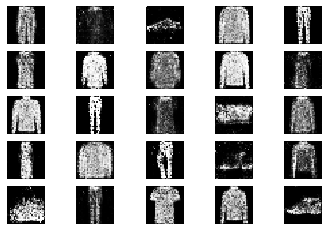

25601 [D loss: 0.650539, acc.: 62.50%] [G loss: 0.897492]
25602 [D loss: 0.673979, acc.: 56.25%] [G loss: 0.882271]
25603 [D loss: 0.677782, acc.: 56.25%] [G loss: 0.911788]
25604 [D loss: 0.588208, acc.: 68.75%] [G loss: 0.975119]
25605 [D loss: 0.657675, acc.: 67.19%] [G loss: 0.931562]
25606 [D loss: 0.646342, acc.: 56.25%] [G loss: 0.889527]
25607 [D loss: 0.610678, acc.: 67.19%] [G loss: 0.831897]
25608 [D loss: 0.692171, acc.: 56.25%] [G loss: 0.874421]
25609 [D loss: 0.585039, acc.: 68.75%] [G loss: 1.050599]
25610 [D loss: 0.617834, acc.: 62.50%] [G loss: 0.995897]
25611 [D loss: 0.695091, acc.: 54.69%] [G loss: 1.021264]
25612 [D loss: 0.637379, acc.: 62.50%] [G loss: 0.916724]
25613 [D loss: 0.634172, acc.: 67.19%] [G loss: 0.943041]
25614 [D loss: 0.672532, acc.: 57.81%] [G loss: 0.932604]
25615 [D loss: 0.717683, acc.: 53.12%] [G loss: 0.940471]
25616 [D loss: 0.683438, acc.: 53.12%] [G loss: 0.896860]
25617 [D loss: 0.641833, acc.: 64.06%] [G loss: 0.915203]
25618 [D loss:

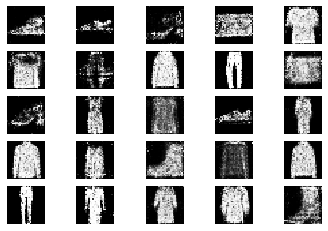

25801 [D loss: 0.658549, acc.: 59.38%] [G loss: 0.988297]
25802 [D loss: 0.635801, acc.: 59.38%] [G loss: 0.977520]
25803 [D loss: 0.632054, acc.: 62.50%] [G loss: 0.914224]
25804 [D loss: 0.707100, acc.: 57.81%] [G loss: 1.025692]
25805 [D loss: 0.648232, acc.: 57.81%] [G loss: 0.894168]
25806 [D loss: 0.629729, acc.: 62.50%] [G loss: 0.944460]
25807 [D loss: 0.661403, acc.: 59.38%] [G loss: 0.941922]
25808 [D loss: 0.667863, acc.: 54.69%] [G loss: 0.894488]
25809 [D loss: 0.585706, acc.: 68.75%] [G loss: 0.951876]
25810 [D loss: 0.679775, acc.: 57.81%] [G loss: 0.928371]
25811 [D loss: 0.652638, acc.: 57.81%] [G loss: 0.905815]
25812 [D loss: 0.691682, acc.: 56.25%] [G loss: 0.970311]
25813 [D loss: 0.626702, acc.: 68.75%] [G loss: 0.948127]
25814 [D loss: 0.643552, acc.: 62.50%] [G loss: 0.916088]
25815 [D loss: 0.629968, acc.: 62.50%] [G loss: 0.864112]
25816 [D loss: 0.668680, acc.: 60.94%] [G loss: 0.847431]
25817 [D loss: 0.659101, acc.: 56.25%] [G loss: 0.879668]
25818 [D loss:

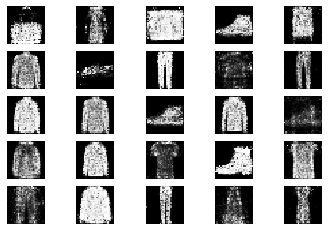

26001 [D loss: 0.656240, acc.: 57.81%] [G loss: 0.998166]
26002 [D loss: 0.710583, acc.: 54.69%] [G loss: 0.942016]
26003 [D loss: 0.626105, acc.: 62.50%] [G loss: 0.894222]
26004 [D loss: 0.564884, acc.: 71.88%] [G loss: 0.916681]
26005 [D loss: 0.619308, acc.: 59.38%] [G loss: 0.998768]
26006 [D loss: 0.716241, acc.: 51.56%] [G loss: 0.882402]
26007 [D loss: 0.699105, acc.: 60.94%] [G loss: 0.866551]
26008 [D loss: 0.570132, acc.: 70.31%] [G loss: 0.917619]
26009 [D loss: 0.596417, acc.: 67.19%] [G loss: 0.929528]
26010 [D loss: 0.724940, acc.: 60.94%] [G loss: 0.916794]
26011 [D loss: 0.629536, acc.: 70.31%] [G loss: 0.882326]
26012 [D loss: 0.644984, acc.: 56.25%] [G loss: 0.851896]
26013 [D loss: 0.691424, acc.: 54.69%] [G loss: 0.901120]
26014 [D loss: 0.705416, acc.: 50.00%] [G loss: 0.954317]
26015 [D loss: 0.644342, acc.: 64.06%] [G loss: 0.951587]
26016 [D loss: 0.647467, acc.: 59.38%] [G loss: 0.900507]
26017 [D loss: 0.659657, acc.: 57.81%] [G loss: 0.948336]
26018 [D loss:

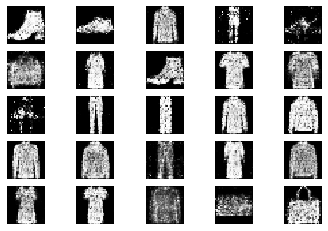

26201 [D loss: 0.578736, acc.: 67.19%] [G loss: 0.967781]
26202 [D loss: 0.631959, acc.: 71.88%] [G loss: 0.982844]
26203 [D loss: 0.687212, acc.: 56.25%] [G loss: 0.859669]
26204 [D loss: 0.648412, acc.: 62.50%] [G loss: 0.991606]
26205 [D loss: 0.639634, acc.: 56.25%] [G loss: 0.885094]
26206 [D loss: 0.600063, acc.: 65.62%] [G loss: 0.989943]
26207 [D loss: 0.664051, acc.: 65.62%] [G loss: 0.915313]
26208 [D loss: 0.609687, acc.: 64.06%] [G loss: 0.943884]
26209 [D loss: 0.701035, acc.: 57.81%] [G loss: 0.858431]
26210 [D loss: 0.748377, acc.: 51.56%] [G loss: 0.952091]
26211 [D loss: 0.612971, acc.: 57.81%] [G loss: 0.993707]
26212 [D loss: 0.616099, acc.: 70.31%] [G loss: 0.911849]
26213 [D loss: 0.624658, acc.: 64.06%] [G loss: 0.923012]
26214 [D loss: 0.738076, acc.: 56.25%] [G loss: 0.953038]
26215 [D loss: 0.671158, acc.: 54.69%] [G loss: 0.896987]
26216 [D loss: 0.728113, acc.: 51.56%] [G loss: 0.849173]
26217 [D loss: 0.600425, acc.: 67.19%] [G loss: 0.870321]
26218 [D loss:

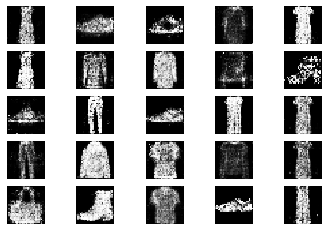

26401 [D loss: 0.613147, acc.: 65.62%] [G loss: 0.980143]
26402 [D loss: 0.639325, acc.: 62.50%] [G loss: 1.034754]
26403 [D loss: 0.652601, acc.: 60.94%] [G loss: 1.017865]
26404 [D loss: 0.613975, acc.: 67.19%] [G loss: 1.004820]
26405 [D loss: 0.556942, acc.: 79.69%] [G loss: 1.004208]
26406 [D loss: 0.617920, acc.: 70.31%] [G loss: 0.912594]
26407 [D loss: 0.660869, acc.: 56.25%] [G loss: 0.907375]
26408 [D loss: 0.625445, acc.: 59.38%] [G loss: 0.885085]
26409 [D loss: 0.689997, acc.: 60.94%] [G loss: 0.914351]
26410 [D loss: 0.651921, acc.: 64.06%] [G loss: 0.927248]
26411 [D loss: 0.700640, acc.: 56.25%] [G loss: 0.854891]
26412 [D loss: 0.675028, acc.: 51.56%] [G loss: 0.899232]
26413 [D loss: 0.629473, acc.: 62.50%] [G loss: 0.958264]
26414 [D loss: 0.672432, acc.: 68.75%] [G loss: 0.902517]
26415 [D loss: 0.615791, acc.: 67.19%] [G loss: 1.060979]
26416 [D loss: 0.629304, acc.: 67.19%] [G loss: 0.987928]
26417 [D loss: 0.633039, acc.: 68.75%] [G loss: 0.946016]
26418 [D loss:

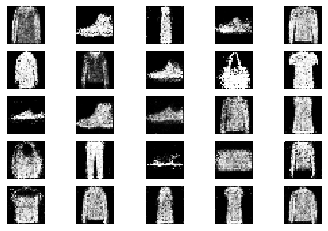

26601 [D loss: 0.677119, acc.: 51.56%] [G loss: 0.915801]
26602 [D loss: 0.701489, acc.: 57.81%] [G loss: 0.895442]
26603 [D loss: 0.620812, acc.: 65.62%] [G loss: 0.973930]
26604 [D loss: 0.623364, acc.: 65.62%] [G loss: 1.024264]
26605 [D loss: 0.610183, acc.: 68.75%] [G loss: 0.890972]
26606 [D loss: 0.662024, acc.: 59.38%] [G loss: 0.965433]
26607 [D loss: 0.685000, acc.: 54.69%] [G loss: 0.890711]
26608 [D loss: 0.670826, acc.: 62.50%] [G loss: 1.016480]
26609 [D loss: 0.582924, acc.: 71.88%] [G loss: 0.993828]
26610 [D loss: 0.687193, acc.: 56.25%] [G loss: 0.909120]
26611 [D loss: 0.626554, acc.: 64.06%] [G loss: 0.968706]
26612 [D loss: 0.642525, acc.: 67.19%] [G loss: 1.053748]
26613 [D loss: 0.635063, acc.: 68.75%] [G loss: 0.913965]
26614 [D loss: 0.666050, acc.: 59.38%] [G loss: 0.924790]
26615 [D loss: 0.736401, acc.: 59.38%] [G loss: 0.939529]
26616 [D loss: 0.608865, acc.: 75.00%] [G loss: 1.070080]
26617 [D loss: 0.635430, acc.: 59.38%] [G loss: 1.037789]
26618 [D loss:

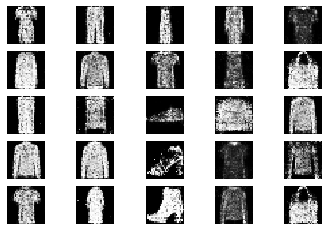

26801 [D loss: 0.617978, acc.: 70.31%] [G loss: 0.986880]
26802 [D loss: 0.718811, acc.: 51.56%] [G loss: 0.910509]
26803 [D loss: 0.592577, acc.: 60.94%] [G loss: 0.957585]
26804 [D loss: 0.662541, acc.: 59.38%] [G loss: 0.952948]
26805 [D loss: 0.569147, acc.: 76.56%] [G loss: 0.958171]
26806 [D loss: 0.605340, acc.: 65.62%] [G loss: 0.877261]
26807 [D loss: 0.645610, acc.: 56.25%] [G loss: 0.904446]
26808 [D loss: 0.612477, acc.: 60.94%] [G loss: 0.873980]
26809 [D loss: 0.691655, acc.: 53.12%] [G loss: 0.866719]
26810 [D loss: 0.709636, acc.: 50.00%] [G loss: 0.984766]
26811 [D loss: 0.650375, acc.: 65.62%] [G loss: 0.963554]
26812 [D loss: 0.694492, acc.: 60.94%] [G loss: 0.890469]
26813 [D loss: 0.643894, acc.: 64.06%] [G loss: 0.884753]
26814 [D loss: 0.720615, acc.: 54.69%] [G loss: 0.867153]
26815 [D loss: 0.590595, acc.: 68.75%] [G loss: 0.821668]
26816 [D loss: 0.627975, acc.: 60.94%] [G loss: 0.856639]
26817 [D loss: 0.649936, acc.: 57.81%] [G loss: 0.925306]
26818 [D loss:

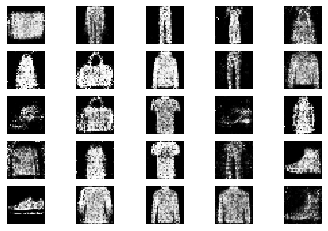

27001 [D loss: 0.605061, acc.: 71.88%] [G loss: 0.976906]
27002 [D loss: 0.618505, acc.: 62.50%] [G loss: 1.009003]
27003 [D loss: 0.708545, acc.: 57.81%] [G loss: 0.916201]
27004 [D loss: 0.643858, acc.: 59.38%] [G loss: 0.955408]
27005 [D loss: 0.659138, acc.: 57.81%] [G loss: 0.896946]
27006 [D loss: 0.619372, acc.: 68.75%] [G loss: 0.899714]
27007 [D loss: 0.634459, acc.: 60.94%] [G loss: 0.993037]
27008 [D loss: 0.693765, acc.: 57.81%] [G loss: 0.876453]
27009 [D loss: 0.621746, acc.: 62.50%] [G loss: 0.918568]
27010 [D loss: 0.685287, acc.: 59.38%] [G loss: 0.858750]
27011 [D loss: 0.650409, acc.: 65.62%] [G loss: 0.938716]
27012 [D loss: 0.594724, acc.: 68.75%] [G loss: 0.956396]
27013 [D loss: 0.718611, acc.: 48.44%] [G loss: 0.919904]
27014 [D loss: 0.604852, acc.: 62.50%] [G loss: 0.983385]
27015 [D loss: 0.615810, acc.: 70.31%] [G loss: 1.007334]
27016 [D loss: 0.639147, acc.: 65.62%] [G loss: 0.942277]
27017 [D loss: 0.563275, acc.: 70.31%] [G loss: 1.015046]
27018 [D loss:

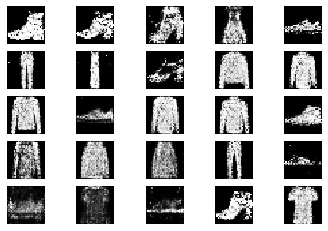

27201 [D loss: 0.667975, acc.: 56.25%] [G loss: 0.942532]
27202 [D loss: 0.631854, acc.: 59.38%] [G loss: 1.013577]
27203 [D loss: 0.636721, acc.: 62.50%] [G loss: 0.861857]
27204 [D loss: 0.623327, acc.: 68.75%] [G loss: 0.801305]
27205 [D loss: 0.691724, acc.: 56.25%] [G loss: 0.948770]
27206 [D loss: 0.703678, acc.: 57.81%] [G loss: 0.896199]
27207 [D loss: 0.656734, acc.: 62.50%] [G loss: 0.974853]
27208 [D loss: 0.609331, acc.: 64.06%] [G loss: 0.957819]
27209 [D loss: 0.631601, acc.: 64.06%] [G loss: 0.856244]
27210 [D loss: 0.681505, acc.: 56.25%] [G loss: 0.940039]
27211 [D loss: 0.641102, acc.: 57.81%] [G loss: 0.919509]
27212 [D loss: 0.618353, acc.: 62.50%] [G loss: 1.005067]
27213 [D loss: 0.612863, acc.: 64.06%] [G loss: 0.911981]
27214 [D loss: 0.651397, acc.: 56.25%] [G loss: 0.924311]
27215 [D loss: 0.648490, acc.: 68.75%] [G loss: 0.978337]
27216 [D loss: 0.601676, acc.: 64.06%] [G loss: 0.942874]
27217 [D loss: 0.609079, acc.: 67.19%] [G loss: 0.960377]
27218 [D loss:

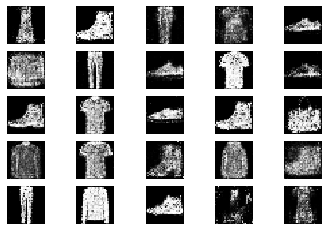

27401 [D loss: 0.643694, acc.: 67.19%] [G loss: 0.974830]
27402 [D loss: 0.571541, acc.: 67.19%] [G loss: 0.952583]
27403 [D loss: 0.666945, acc.: 54.69%] [G loss: 0.888317]
27404 [D loss: 0.643796, acc.: 68.75%] [G loss: 0.850530]
27405 [D loss: 0.706200, acc.: 56.25%] [G loss: 0.933576]
27406 [D loss: 0.615679, acc.: 67.19%] [G loss: 0.970948]
27407 [D loss: 0.668809, acc.: 57.81%] [G loss: 0.994537]
27408 [D loss: 0.727306, acc.: 59.38%] [G loss: 0.895314]
27409 [D loss: 0.624294, acc.: 67.19%] [G loss: 0.956920]
27410 [D loss: 0.592995, acc.: 68.75%] [G loss: 1.026538]
27411 [D loss: 0.620330, acc.: 62.50%] [G loss: 0.934150]
27412 [D loss: 0.616912, acc.: 67.19%] [G loss: 0.871305]
27413 [D loss: 0.618200, acc.: 68.75%] [G loss: 1.001307]
27414 [D loss: 0.609496, acc.: 67.19%] [G loss: 0.876006]
27415 [D loss: 0.769049, acc.: 46.88%] [G loss: 0.938537]
27416 [D loss: 0.666079, acc.: 59.38%] [G loss: 0.956261]
27417 [D loss: 0.542962, acc.: 79.69%] [G loss: 1.023255]
27418 [D loss:

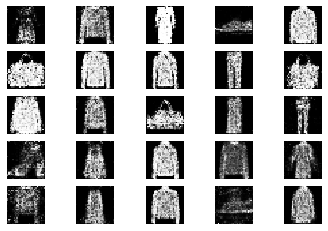

27601 [D loss: 0.639744, acc.: 70.31%] [G loss: 0.881543]
27602 [D loss: 0.742169, acc.: 56.25%] [G loss: 0.946911]
27603 [D loss: 0.644623, acc.: 60.94%] [G loss: 0.993533]
27604 [D loss: 0.654737, acc.: 60.94%] [G loss: 0.917495]
27605 [D loss: 0.668255, acc.: 64.06%] [G loss: 0.980740]
27606 [D loss: 0.613371, acc.: 67.19%] [G loss: 0.874157]
27607 [D loss: 0.671000, acc.: 60.94%] [G loss: 0.919631]
27608 [D loss: 0.617897, acc.: 62.50%] [G loss: 1.065808]
27609 [D loss: 0.585739, acc.: 70.31%] [G loss: 1.000226]
27610 [D loss: 0.658514, acc.: 57.81%] [G loss: 1.016837]
27611 [D loss: 0.691870, acc.: 56.25%] [G loss: 0.968786]
27612 [D loss: 0.613559, acc.: 65.62%] [G loss: 1.027037]
27613 [D loss: 0.590055, acc.: 68.75%] [G loss: 0.996495]
27614 [D loss: 0.631146, acc.: 65.62%] [G loss: 0.967038]
27615 [D loss: 0.661142, acc.: 56.25%] [G loss: 0.958877]
27616 [D loss: 0.672108, acc.: 57.81%] [G loss: 1.026911]
27617 [D loss: 0.635480, acc.: 60.94%] [G loss: 0.987340]
27618 [D loss:

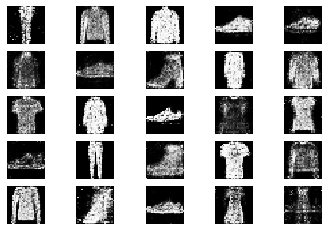

27801 [D loss: 0.606320, acc.: 64.06%] [G loss: 0.892384]
27802 [D loss: 0.619758, acc.: 65.62%] [G loss: 0.970197]
27803 [D loss: 0.637921, acc.: 64.06%] [G loss: 1.051215]
27804 [D loss: 0.603534, acc.: 65.62%] [G loss: 1.099432]
27805 [D loss: 0.617881, acc.: 65.62%] [G loss: 1.038648]
27806 [D loss: 0.635591, acc.: 70.31%] [G loss: 0.979475]
27807 [D loss: 0.614496, acc.: 64.06%] [G loss: 1.045419]
27808 [D loss: 0.611533, acc.: 68.75%] [G loss: 0.975498]
27809 [D loss: 0.640750, acc.: 62.50%] [G loss: 1.017808]
27810 [D loss: 0.706109, acc.: 54.69%] [G loss: 1.005956]
27811 [D loss: 0.695115, acc.: 54.69%] [G loss: 1.039947]
27812 [D loss: 0.675803, acc.: 57.81%] [G loss: 1.025589]
27813 [D loss: 0.646973, acc.: 62.50%] [G loss: 0.990517]
27814 [D loss: 0.682996, acc.: 48.44%] [G loss: 0.965536]
27815 [D loss: 0.613067, acc.: 64.06%] [G loss: 0.960881]
27816 [D loss: 0.683977, acc.: 53.12%] [G loss: 0.836682]
27817 [D loss: 0.661267, acc.: 60.94%] [G loss: 0.935444]
27818 [D loss:

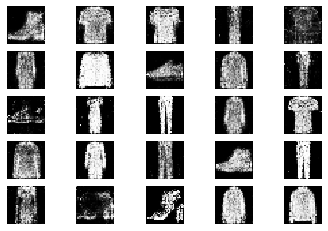

28001 [D loss: 0.571063, acc.: 67.19%] [G loss: 0.906749]
28002 [D loss: 0.549530, acc.: 85.94%] [G loss: 0.970904]
28003 [D loss: 0.609775, acc.: 73.44%] [G loss: 1.022355]
28004 [D loss: 0.563898, acc.: 65.62%] [G loss: 1.054305]
28005 [D loss: 0.598290, acc.: 68.75%] [G loss: 0.932541]
28006 [D loss: 0.604870, acc.: 73.44%] [G loss: 0.952372]
28007 [D loss: 0.687803, acc.: 59.38%] [G loss: 1.003444]
28008 [D loss: 0.632091, acc.: 60.94%] [G loss: 0.874445]
28009 [D loss: 0.611812, acc.: 67.19%] [G loss: 0.951854]
28010 [D loss: 0.644809, acc.: 60.94%] [G loss: 1.043652]
28011 [D loss: 0.612093, acc.: 67.19%] [G loss: 0.925061]
28012 [D loss: 0.625128, acc.: 62.50%] [G loss: 0.936945]
28013 [D loss: 0.671824, acc.: 45.31%] [G loss: 0.909817]
28014 [D loss: 0.640012, acc.: 67.19%] [G loss: 0.843763]
28015 [D loss: 0.629407, acc.: 60.94%] [G loss: 0.960822]
28016 [D loss: 0.665482, acc.: 62.50%] [G loss: 1.064249]
28017 [D loss: 0.644069, acc.: 64.06%] [G loss: 0.966380]
28018 [D loss:

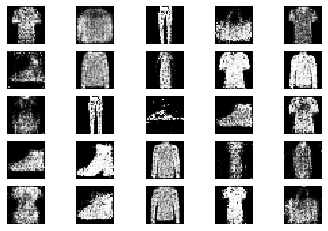

28201 [D loss: 0.658926, acc.: 62.50%] [G loss: 0.961630]
28202 [D loss: 0.695795, acc.: 56.25%] [G loss: 0.988861]
28203 [D loss: 0.697071, acc.: 64.06%] [G loss: 1.002644]
28204 [D loss: 0.672840, acc.: 64.06%] [G loss: 0.920534]
28205 [D loss: 0.659616, acc.: 67.19%] [G loss: 0.867089]
28206 [D loss: 0.632998, acc.: 60.94%] [G loss: 0.900792]
28207 [D loss: 0.611808, acc.: 64.06%] [G loss: 0.896458]
28208 [D loss: 0.702795, acc.: 53.12%] [G loss: 1.075922]
28209 [D loss: 0.671046, acc.: 56.25%] [G loss: 0.956342]
28210 [D loss: 0.615281, acc.: 65.62%] [G loss: 0.875207]
28211 [D loss: 0.627679, acc.: 62.50%] [G loss: 0.871921]
28212 [D loss: 0.633781, acc.: 65.62%] [G loss: 0.975261]
28213 [D loss: 0.577455, acc.: 70.31%] [G loss: 0.899215]
28214 [D loss: 0.619995, acc.: 65.62%] [G loss: 0.967759]
28215 [D loss: 0.644756, acc.: 59.38%] [G loss: 0.991556]
28216 [D loss: 0.711089, acc.: 54.69%] [G loss: 0.938417]
28217 [D loss: 0.601761, acc.: 67.19%] [G loss: 0.835349]
28218 [D loss:

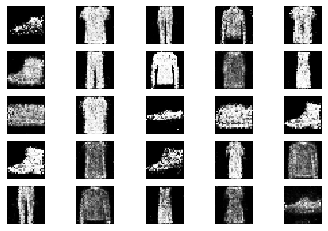

28401 [D loss: 0.637769, acc.: 62.50%] [G loss: 0.927991]
28402 [D loss: 0.605986, acc.: 70.31%] [G loss: 0.949783]
28403 [D loss: 0.649706, acc.: 60.94%] [G loss: 0.951325]
28404 [D loss: 0.578157, acc.: 70.31%] [G loss: 0.852798]
28405 [D loss: 0.646989, acc.: 53.12%] [G loss: 0.940069]
28406 [D loss: 0.622347, acc.: 60.94%] [G loss: 0.893925]
28407 [D loss: 0.692553, acc.: 50.00%] [G loss: 0.912196]
28408 [D loss: 0.626153, acc.: 67.19%] [G loss: 0.919813]
28409 [D loss: 0.642034, acc.: 57.81%] [G loss: 0.947596]
28410 [D loss: 0.639391, acc.: 64.06%] [G loss: 0.954057]
28411 [D loss: 0.580107, acc.: 70.31%] [G loss: 0.970299]
28412 [D loss: 0.623768, acc.: 65.62%] [G loss: 0.971218]
28413 [D loss: 0.638080, acc.: 65.62%] [G loss: 0.892839]
28414 [D loss: 0.573561, acc.: 70.31%] [G loss: 0.916507]
28415 [D loss: 0.688757, acc.: 50.00%] [G loss: 0.927225]
28416 [D loss: 0.654902, acc.: 56.25%] [G loss: 0.915868]
28417 [D loss: 0.604627, acc.: 65.62%] [G loss: 0.856736]
28418 [D loss:

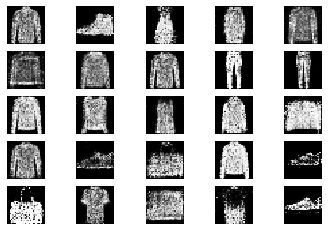

28601 [D loss: 0.697744, acc.: 54.69%] [G loss: 0.997717]
28602 [D loss: 0.611453, acc.: 62.50%] [G loss: 1.079712]
28603 [D loss: 0.685566, acc.: 64.06%] [G loss: 1.041877]
28604 [D loss: 0.700621, acc.: 56.25%] [G loss: 0.935329]
28605 [D loss: 0.618012, acc.: 59.38%] [G loss: 0.917717]
28606 [D loss: 0.604372, acc.: 67.19%] [G loss: 0.919623]
28607 [D loss: 0.672198, acc.: 62.50%] [G loss: 0.922833]
28608 [D loss: 0.669497, acc.: 62.50%] [G loss: 0.938562]
28609 [D loss: 0.673969, acc.: 59.38%] [G loss: 0.904725]
28610 [D loss: 0.551530, acc.: 70.31%] [G loss: 0.930139]
28611 [D loss: 0.708278, acc.: 51.56%] [G loss: 0.973649]
28612 [D loss: 0.628184, acc.: 56.25%] [G loss: 0.944134]
28613 [D loss: 0.620702, acc.: 73.44%] [G loss: 0.863462]
28614 [D loss: 0.635782, acc.: 62.50%] [G loss: 0.953511]
28615 [D loss: 0.642048, acc.: 64.06%] [G loss: 0.911003]
28616 [D loss: 0.645632, acc.: 68.75%] [G loss: 0.967481]
28617 [D loss: 0.667742, acc.: 59.38%] [G loss: 1.026296]
28618 [D loss:

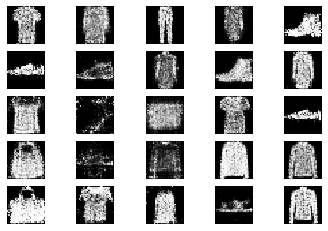

28801 [D loss: 0.658989, acc.: 59.38%] [G loss: 1.003146]
28802 [D loss: 0.575266, acc.: 67.19%] [G loss: 0.924950]
28803 [D loss: 0.581493, acc.: 67.19%] [G loss: 0.951715]
28804 [D loss: 0.604700, acc.: 73.44%] [G loss: 0.971116]
28805 [D loss: 0.634605, acc.: 67.19%] [G loss: 1.027212]
28806 [D loss: 0.703329, acc.: 48.44%] [G loss: 0.933702]
28807 [D loss: 0.656826, acc.: 57.81%] [G loss: 0.882613]
28808 [D loss: 0.644394, acc.: 54.69%] [G loss: 0.942514]
28809 [D loss: 0.630039, acc.: 62.50%] [G loss: 0.933372]
28810 [D loss: 0.659267, acc.: 62.50%] [G loss: 0.905085]
28811 [D loss: 0.664807, acc.: 57.81%] [G loss: 0.912477]
28812 [D loss: 0.587782, acc.: 68.75%] [G loss: 0.998097]
28813 [D loss: 0.707093, acc.: 53.12%] [G loss: 0.875099]
28814 [D loss: 0.644223, acc.: 64.06%] [G loss: 0.860553]
28815 [D loss: 0.613421, acc.: 62.50%] [G loss: 1.048512]
28816 [D loss: 0.616886, acc.: 65.62%] [G loss: 0.976606]
28817 [D loss: 0.599223, acc.: 64.06%] [G loss: 0.922134]
28818 [D loss:

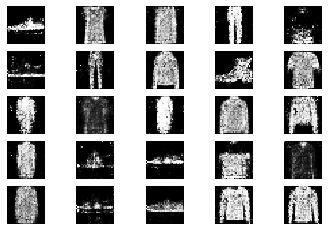

29001 [D loss: 0.592423, acc.: 71.88%] [G loss: 0.993396]
29002 [D loss: 0.641949, acc.: 51.56%] [G loss: 0.938539]
29003 [D loss: 0.638315, acc.: 65.62%] [G loss: 0.982713]
29004 [D loss: 0.647362, acc.: 62.50%] [G loss: 1.020367]
29005 [D loss: 0.646898, acc.: 65.62%] [G loss: 1.080267]
29006 [D loss: 0.570825, acc.: 68.75%] [G loss: 1.041821]
29007 [D loss: 0.682907, acc.: 53.12%] [G loss: 0.985268]
29008 [D loss: 0.695012, acc.: 56.25%] [G loss: 1.053083]
29009 [D loss: 0.627084, acc.: 62.50%] [G loss: 0.923597]
29010 [D loss: 0.604230, acc.: 67.19%] [G loss: 0.939243]
29011 [D loss: 0.624036, acc.: 62.50%] [G loss: 0.956830]
29012 [D loss: 0.664883, acc.: 54.69%] [G loss: 0.983338]
29013 [D loss: 0.630909, acc.: 64.06%] [G loss: 1.012828]
29014 [D loss: 0.679045, acc.: 50.00%] [G loss: 0.927434]
29015 [D loss: 0.623185, acc.: 60.94%] [G loss: 0.884669]
29016 [D loss: 0.672864, acc.: 53.12%] [G loss: 0.888457]
29017 [D loss: 0.588866, acc.: 67.19%] [G loss: 0.944661]
29018 [D loss:

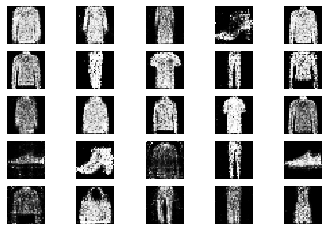

29201 [D loss: 0.672429, acc.: 57.81%] [G loss: 0.934342]
29202 [D loss: 0.612080, acc.: 60.94%] [G loss: 1.006693]
29203 [D loss: 0.610090, acc.: 68.75%] [G loss: 0.968035]
29204 [D loss: 0.666196, acc.: 64.06%] [G loss: 0.905082]
29205 [D loss: 0.673097, acc.: 57.81%] [G loss: 0.899171]
29206 [D loss: 0.623990, acc.: 56.25%] [G loss: 0.918669]
29207 [D loss: 0.685634, acc.: 48.44%] [G loss: 0.909881]
29208 [D loss: 0.628560, acc.: 64.06%] [G loss: 0.951396]
29209 [D loss: 0.654933, acc.: 68.75%] [G loss: 1.014151]
29210 [D loss: 0.668273, acc.: 60.94%] [G loss: 0.951021]
29211 [D loss: 0.606012, acc.: 71.88%] [G loss: 1.035946]
29212 [D loss: 0.633051, acc.: 67.19%] [G loss: 0.956124]
29213 [D loss: 0.612426, acc.: 68.75%] [G loss: 0.999085]
29214 [D loss: 0.575481, acc.: 73.44%] [G loss: 1.010265]
29215 [D loss: 0.667674, acc.: 56.25%] [G loss: 0.838195]
29216 [D loss: 0.590407, acc.: 64.06%] [G loss: 0.904520]
29217 [D loss: 0.606633, acc.: 67.19%] [G loss: 1.013147]
29218 [D loss:

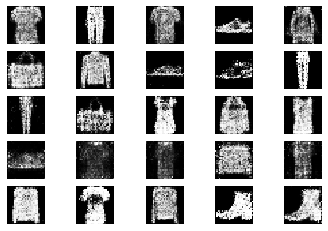

29401 [D loss: 0.606564, acc.: 70.31%] [G loss: 0.967275]
29402 [D loss: 0.590759, acc.: 68.75%] [G loss: 0.946974]
29403 [D loss: 0.622885, acc.: 64.06%] [G loss: 0.942806]
29404 [D loss: 0.562945, acc.: 70.31%] [G loss: 0.993968]
29405 [D loss: 0.666125, acc.: 64.06%] [G loss: 0.966239]
29406 [D loss: 0.633321, acc.: 62.50%] [G loss: 1.057462]
29407 [D loss: 0.644285, acc.: 57.81%] [G loss: 1.015401]
29408 [D loss: 0.578202, acc.: 73.44%] [G loss: 1.078287]
29409 [D loss: 0.600419, acc.: 65.62%] [G loss: 1.058571]
29410 [D loss: 0.666544, acc.: 64.06%] [G loss: 1.072130]
29411 [D loss: 0.617524, acc.: 68.75%] [G loss: 1.043134]
29412 [D loss: 0.650111, acc.: 67.19%] [G loss: 1.030350]
29413 [D loss: 0.676722, acc.: 56.25%] [G loss: 1.036627]
29414 [D loss: 0.627182, acc.: 68.75%] [G loss: 1.017982]
29415 [D loss: 0.615432, acc.: 73.44%] [G loss: 0.947365]
29416 [D loss: 0.698832, acc.: 57.81%] [G loss: 0.893072]
29417 [D loss: 0.596860, acc.: 68.75%] [G loss: 0.958587]
29418 [D loss:

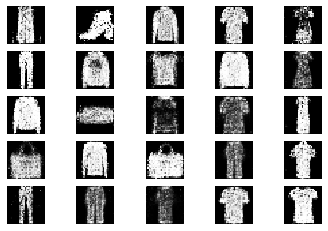

29601 [D loss: 0.632601, acc.: 65.62%] [G loss: 1.092232]
29602 [D loss: 0.713082, acc.: 51.56%] [G loss: 0.975885]
29603 [D loss: 0.619873, acc.: 65.62%] [G loss: 1.008597]
29604 [D loss: 0.717553, acc.: 54.69%] [G loss: 0.880189]
29605 [D loss: 0.646299, acc.: 62.50%] [G loss: 0.839345]
29606 [D loss: 0.652957, acc.: 59.38%] [G loss: 0.967961]
29607 [D loss: 0.620856, acc.: 68.75%] [G loss: 0.901192]
29608 [D loss: 0.578265, acc.: 73.44%] [G loss: 0.945502]
29609 [D loss: 0.631853, acc.: 70.31%] [G loss: 0.979455]
29610 [D loss: 0.612730, acc.: 62.50%] [G loss: 0.947316]
29611 [D loss: 0.685009, acc.: 51.56%] [G loss: 1.050880]
29612 [D loss: 0.566012, acc.: 73.44%] [G loss: 1.133933]
29613 [D loss: 0.614775, acc.: 67.19%] [G loss: 1.015124]
29614 [D loss: 0.584668, acc.: 70.31%] [G loss: 0.953786]
29615 [D loss: 0.682124, acc.: 57.81%] [G loss: 0.887001]
29616 [D loss: 0.603930, acc.: 65.62%] [G loss: 1.041529]
29617 [D loss: 0.677319, acc.: 62.50%] [G loss: 1.036947]
29618 [D loss:

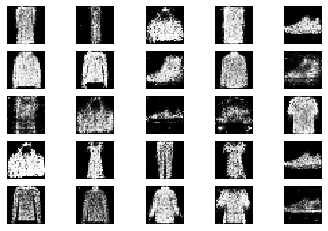

29801 [D loss: 0.562315, acc.: 76.56%] [G loss: 0.987071]
29802 [D loss: 0.628999, acc.: 64.06%] [G loss: 0.962741]
29803 [D loss: 0.576214, acc.: 71.88%] [G loss: 0.884020]
29804 [D loss: 0.631802, acc.: 56.25%] [G loss: 0.948412]
29805 [D loss: 0.600846, acc.: 67.19%] [G loss: 0.896440]
29806 [D loss: 0.618426, acc.: 65.62%] [G loss: 0.939826]
29807 [D loss: 0.677786, acc.: 62.50%] [G loss: 0.902259]
29808 [D loss: 0.688565, acc.: 53.12%] [G loss: 0.976378]
29809 [D loss: 0.629667, acc.: 70.31%] [G loss: 0.950901]
29810 [D loss: 0.598168, acc.: 71.88%] [G loss: 0.942230]
29811 [D loss: 0.665400, acc.: 54.69%] [G loss: 0.914775]
29812 [D loss: 0.573620, acc.: 73.44%] [G loss: 0.909109]
29813 [D loss: 0.643433, acc.: 60.94%] [G loss: 0.984747]
29814 [D loss: 0.625395, acc.: 62.50%] [G loss: 1.018134]
29815 [D loss: 0.668340, acc.: 57.81%] [G loss: 0.983375]
29816 [D loss: 0.592314, acc.: 68.75%] [G loss: 0.994534]
29817 [D loss: 0.589181, acc.: 70.31%] [G loss: 1.022239]
29818 [D loss:

In [7]:
gan = GAN()
gan.train(epochs=30000, batch_size=32, sample_interval=200)